In [1]:
## import numpy as np
import pandas as pd
!pip install nolds
!pip install git+https://github.com/neuropsychology/NeuroKit.py#egg=neurokit
from pandas import ExcelWriter
from pandas import ExcelFile
import os , sys
import glob
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.stats import norm
import matplotlib.mlab as mlab
import numpy as np
import neurokit as nk
import neurokit2 as nk2
import re
import seaborn as sns
cwd = os.getcwd()
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower
sns.set(style="white")
sns.set_palette("Set2")
palette_3color = sns.color_palette(['#99D4BF', '#9BB7D1', '#FFE2B8'])

### Import the trajectories

In [4]:

files = glob.glob('*[0-9].txt*')

raw_traj = {}

filtered_traj = {}

for file in files:
    raw_traj[file[:-4]] = np.loadtxt(file, dtype='i', delimiter=',')

#Frame rate 10s: 103, 105
#Frame rate 5s: 111
cont = [64,67,70,71,73,74,75,76,77,78,79,80,81,82,83,84,103,105,111,120,207, 209, 211, 
        215, 217, 219, 221,223,225,226,227, 241,243]

#Frame rate 10s: 107
#Frame rate 5s: 109
#Frame rate 2.5s: 110
heat= [36,37,38,39,40,41,43,44,45,47,48,49,50,51,52,54,55,56,57,58,59,60,
    61,62,63,65,66,68,69,72,85,107,109,110,159, 90, 206, 208, 210,
    216, 218, 222, 224, 228, 229, 231, 232, 237,239, 240, 242, 245,247,248,249, 250, 252, 258, 264, 265, 269]


Stir_Heat = [197,198,199,200,201]



#Categories that are not analyzed in this paper (for Naringenin analysis, see Naringenin analysis notebook)
cont_RRed = [87]
heat_RRed = [86,88,89]
heat_U73122 = [92]
heat_U73122_20191104_AddedLater = [115]
heat_U73122_20191104 = [116]
cont_U73122_20191104_AddedLater = [114]
heat_U73122_20191106_AddedLater = [121]
heat_U73122_20191106_AddedLater2 = [122]
higher_deltaT = [90]
cont_FrameRate10 = [105]
heat_FrameRate10 = [106, 107]
heat_FrameRate5 = [109]
heat_FrameRate2p5 = [110]
cont_FrameRate5 = [111]
color_by_delta_T = [249, 245, 251, 232, 253]

#Seperate trajectories into control and biased. 
traj_binned_raw = {}
bins = ['heat','cont','Stir_Heat']
#bins = ['color_by_delta_T']
#bins = ['cont_FrameRate10', 'heat_FrameRate10', 'heat_FrameRate5', 'heat_FrameRate2p5', 'cont_FrameRate5']
#bins = ['Naringenin40','heat']
for b in bins:
    traj_binned_raw[b] = {}


#For now, ignore the size and perimeter data and just look at centroid position.
for key in raw_traj.keys():
    for bin_name in bins:
        if re.match('^[0-9]*$', key): 
            if int(key) in vars()[bin_name]:
                traj_binned_raw[bin_name][key] = raw_traj[key][:,0:2]
                filtered_traj[key] = raw_traj[key]
                break
        else: 
            break
        


### Convert trajectories to mm and min --- Trajectories are now 3 columns: x, y, t
### Also get the T1, T2, Delta T, Y MSD & X MSD Log Log slope from the excel for the trials that do have a record
### Also get RMSD data from 'Taylor RMSD combined.xlsx"

In [68]:

def Swap(arr, start_index, last_index):
    arr[:, [start_index, last_index]] = arr[:, [last_index, start_index]]

thermolist = pd.read_excel('Experiment_List.xlsx', sheet_name='Sheet1')
sizelist = pd.read_excel('Experiment_List.xlsx', sheet_name='SizeList')
rmsd_x_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='x only')
rmsd_y_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='y only')
rmsd_x = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='x entire traj')
rmsd_y = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='y entire traj')
rmsd_xy = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='xy entire traj')
rmsd_xy_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='xy')
rmsd_y_last200['Y_MSD'] = ""
rmsd_y_last200['X_MSD'] = ""
rmsd_xy['Lp Peak'] = ""
rmsd_xy['Lp'] = ""
rmsd_xy['Tp Peak'] = ""
rmsd_xy['Tp'] = ""

traj_binned = {}
traj_info = {}

angle_figure = pd.read_excel('BeadExperiment_Angles.xlsx', sheet_name='Sheet1')

for b in bins:  
    traj_binned[b] = {}
    traj_info[b] = {}
    traj_info[b]['T1'] = {}
    traj_info[b]['T2'] = {}
    traj_info[b]['Y_MSD'] = {}
    traj_info[b]['X_MSD'] = {}
    traj_info[b]['DeltaT'] = {}
    traj_info[b]['DeltaT cm'] = {}
    traj_info[b]['Time'] = {}
    
    for key in traj_binned_raw[b].keys(): 
        temp1 = traj_binned_raw[b][key]
        
        
        #If the bin is cont or heat, convert the higher frame rate trials to FR = 30s
        if b == 'cont':
            if int(key) in [103,105]:
                temp1 = temp1[0::3]
            elif int(key) in [111]:
                temp1 = temp1[0::6]
        elif b == 'heat':
            if int(key) in [107]:
                temp1 = temp1[0::3]
            elif int(key) in [109]:
                temp1 = temp1[0::6]   
            elif int(key) in [110]:
                temp1 = temp1[0::12] 
            
        traj_binned[b][key] = np.zeros((len(temp1[:,0]),3))
        trialnum = int(key)
        indlist = np.where(thermolist['Trial'] == trialnum)
        ind = indlist[0][0]

        pixel_conv = thermolist['Pixel Conversion'][ind]
        axis = thermolist['Axis'][ind]
        try: 
            indlist_rmsd = np.where(rmsd_y['Trial'] == trialnum)
            ind_rmsd = indlist_rmsd[0][0]
            rmsd_y_last200['Y_MSD'][ind_rmsd] = thermolist['Y_MSD'][ind]
            rmsd_y_last200['X_MSD'][ind_rmsd] = thermolist['X_MSD'][ind]
            rmsd_xy['Lp Peak'][ind_rmsd] = thermolist['L at with max Lp occurs (mm)'][ind]
            rmsd_xy['Tp Peak'][ind_rmsd] = thermolist['T at which max Tp occurs'][ind]
            rmsd_xy['Lp'][ind_rmsd] = thermolist['Max persistence length'][ind]
            rmsd_xy['Tp'][ind_rmsd] = thermolist['Max persistence time (min)'][ind]
            traj_info[b]['Time'][key] = thermolist['Hour'][ind]
        except KeyError:
            print(trialnum)
        
        if thermolist['T1'][ind] > 0:
            traj_info[b]['T1'][key] = thermolist['T1'][ind]
            traj_info[b]['T2'][key] = thermolist['T2'][ind]
            traj_info[b]['DeltaT'][key] = traj_info[b]['T1'][key] - traj_info[b]['T2'][key]
            traj_info[b]['DeltaT cm'][key] = thermolist['Delta T cm'][ind]
            traj_info[b]['Y_MSD'][key] = thermolist['Y_MSD'][ind]
            traj_info[b]['X_MSD'][key] = thermolist['X_MSD'][ind]

            if traj_info[b]['T1'][key] - traj_info[b]['T2'][key] < 0:
                print(b,key)
        camnum = thermolist['Cam'][ind]
        if pixel_conv != 0:
            #For newer trials, some use different chamber heights (e.g. with thermistors at bottom), 
            #Cameras are set at a certain height to focus on organism in flat silicon dish directly on surface (defaults below)
            #For any arena that doesn't have the default height, a pixel conversion is measured and recorded. that number is used
            temp1 = temp1 * pixel_conv 
        #else, just use the default conversions for each camera setup
        elif camnum == 1:
            temp1 = temp1 * 50800/1864000  #Si Wafer PVC pipe setup
        elif camnum ==2:
            temp1 = temp1 * 50800/966000 #Si Wafer PVC pipe setup
        elif camnum ==3:
            temp1 = temp1 * 50800/834000 #Si Wafer PVC pipe setup
        else:
            continue
            
        
        if axis == 'yp':
            temp1[:,1] = temp1[:,1] * -1
        elif axis == 'xp':
            Swap(temp1, 0, 1)
            temp1[:,1] = temp1[:,1] * -1
        elif axis == 'xn':
            Swap(temp1, 0, 1)
        
        #Third column is time
        traj_binned[b][key][:,2] = np.linspace(0,0.5*(len(temp1[:,0])-1),len(temp1[:,0]))    
        traj_binned[b][key][:,:2] = temp1

        
#print(traj_info['heat'])
#print(traj_binned['Stir_Bottom_Heat']['200'])

cont 207
cont 64
cont 226
Stir_Heat 198


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

### Plot angle changes during trajectory 

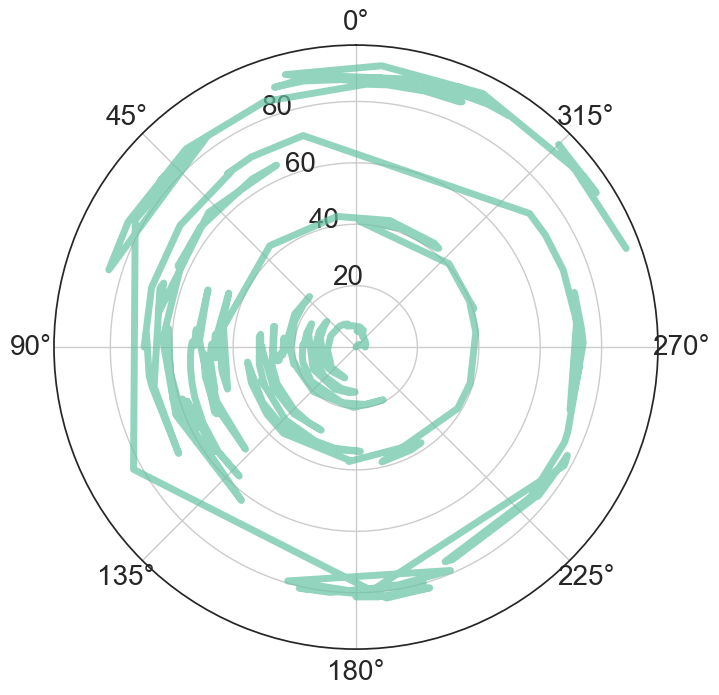

,Frame,Time (s),Time (min),Area,Mean,Mn,Max,Angle,Length,Unnamed: 9,...,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23
0,1.0,0.0,0.000000,252.0,113.078,76.059,214.756,-54.224,251.446,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,20.0,0.333333,222.0,107.845,79.372,254.903,-43.898,220.658,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,40.0,0.666667,214.0,111.024,68.927,200.357,-39.289,213.190,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,60.0,1.000000,199.0,105.725,68.253,165.000,-41.923,197.568,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,80.0,1.333333,190.0,108.906,68.060,189.224,-49.497,189.381,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,328.0,6540.0,109.000000,370.0,98.871,66.946,154.200,118.648,369.195
328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,329.0,6560.0,109.333333,379.0,101.006,70.593,188.716,110.450,377.809
329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,330.0,6580.0,109.666667,379.0,96.959,66.271,174.458,100.061,377.809
330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,331.0,6600.0,110.000000,418.0,98.952,71.447,141.623,101.634,416.557


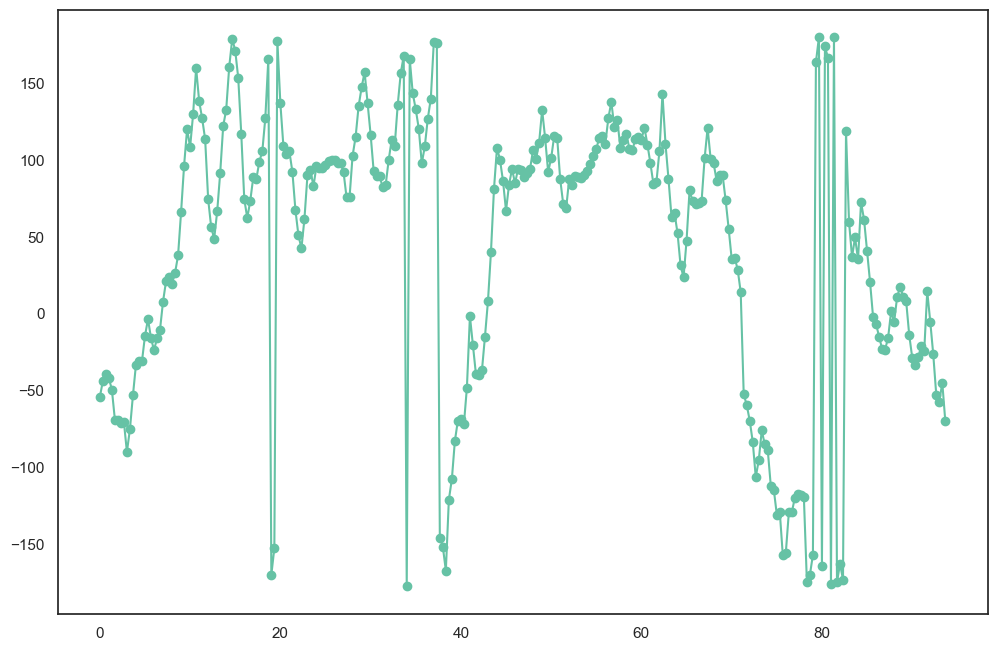

In [9]:
import math

x = angle_figure["Time (min)"]
y = angle_figure["Angle"]
y_rad = np.radians(y)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(y_rad, x, linewidth = 5, alpha = 0.7)
ax.grid(True)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20, rotation = 45)
ax.set_theta_offset(np.pi/2)


title = 'F1orientation.png'
plt.savefig(cwd+'/PaperFigs/' + title)


plt.show()
plt.plot(x,y,'-o')
angle_figure

## KYMOGRAPH OF PERCENT OF ANIMALS AT Y POSITIONS AS FUNCTION OF TIME

61
33
5


<Figure size 1200x800 with 0 Axes>

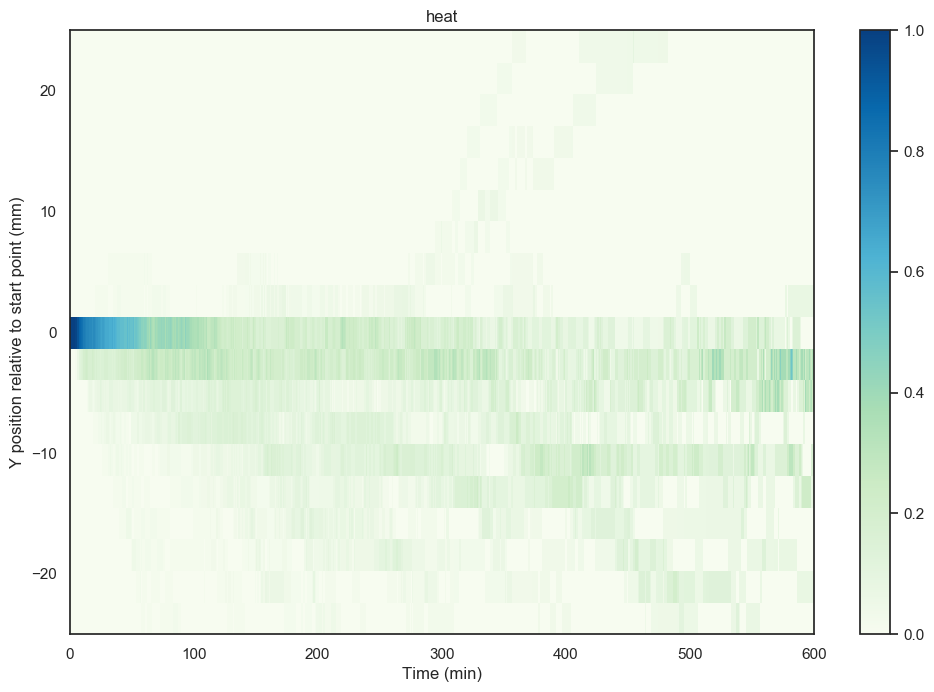

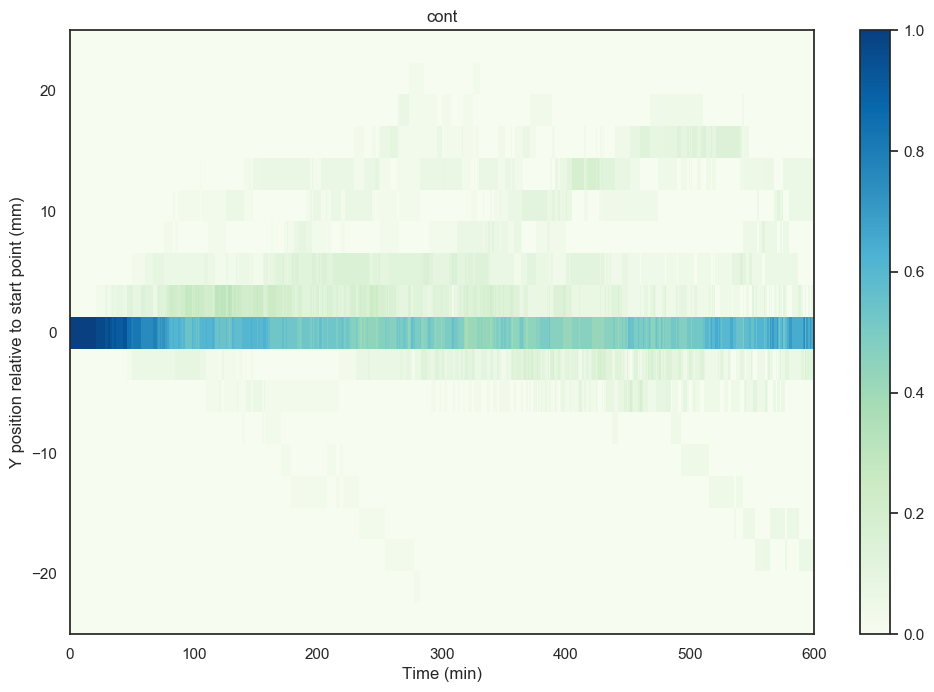

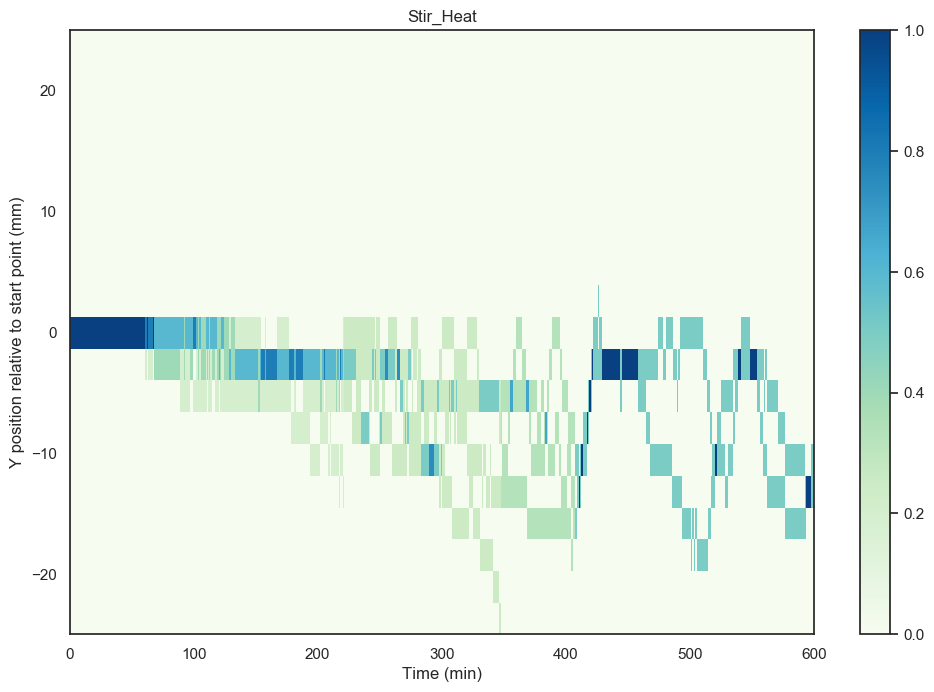

In [23]:
#NUMBER OF MIN WE WANT THE KYMOGRAPH TO BE
l_kymo = 60*10
#FILLER NUMBER TO INDICATE TRAJ ALREADY ENDED
filler = -10000
plt.set_cmap('GnBu')

for b in bins:
    templist = []
    concat = np.zeros([l_kymo*2, len(traj_binned[b].values())])
    
    
    #concatenate (t, y position) across all trials in a certain condition
    for array in traj_binned[b].values():
        templist.append(array[:,1])  #list of all y value columns
    for i in range(len(templist)):
        if len(templist[i]) >= l_kymo*2 :
            concat[0:l_kymo*2, i-1] = templist[i][0:l_kymo*2]
        else:
            concat[0:len(templist[i]), i-1] = templist[i][:]
            concat[len(templist[i]):l_kymo*2,i-1] = filler   #put in an impossible filler number


    #create the x and y axes
    x = np.linspace(0,0.5*(l_kymo*2),l_kymo*2+1)   #time (min)
    y = np.linspace(-25, 25, 20)   #position relative to start (mm)
    [X, Y] = np.meshgrid(x, y)
    #create empty ndarray with dimensions (y-1, x-1) columns flipped because i want the position to be the y axis 
    kymograph = np.zeros([len(y-1), len(x-1)])
    
    #absolute total num of trajectories in the condition
    absolute_total_traj = len(traj_binned[b].values())
    print(absolute_total_traj)
    
    for i in range(len(kymograph[0,:])-1):   #TIMEPOINT
        total_traj = absolute_total_traj
        # find the total number of trajectories at that timepoint
        # take the total_traj and minus one for each organism that finished moving already
        time_slice = concat[i, :]
        for entry in time_slice:
            if entry == filler:
                total_traj = total_traj - 1
        
        for j in range(len(kymograph[:,0])-1):
            counter = 0
            ymin = y[j]
            ymax = y[j+1]
            
            
            for entry in time_slice:
                if entry >= ymin and entry < ymax:
                    counter = counter +1 
            kymograph[j,i] = counter / total_traj
            
        #print(total_traj)
    plt.figure()
    plt.title(b)
    plt.xlabel('Time (min)')
    plt.ylabel('Y position relative to start point (mm)')
    c = plt.pcolormesh(X , Y, kymograph)            
    c = plt.colorbar()
    title = 'KYMOGRAPH_' + b + '.png'
    plt.savefig(cwd+'/PaperFigs/' + title)
    
    
    
    

### Temperature plots!

In [12]:
T1_list = {}
T2_list = {}
Y_MSD_list ={}
X_MSD_list ={}
DeltaT_list = {}
Time_List ={}

for b in bins:
    temp = list(traj_info[b]['T1'].values())
    T1_list[b] = list(traj_info[b]['T1'].values())
    T2_list[b] = list(traj_info[b]['T2'].values())
    Y_MSD_list[b] = list(traj_info[b]['Y_MSD'].values())
    X_MSD_list[b] = list(traj_info[b]['X_MSD'].values())
    DeltaT_list[b] = list(traj_info[b]['DeltaT cm'].values())
    Time_List[b] = list(traj_info[b]['Time'].values())

Text(0, 0.5, 'Slope of log-log MSD (Y)')

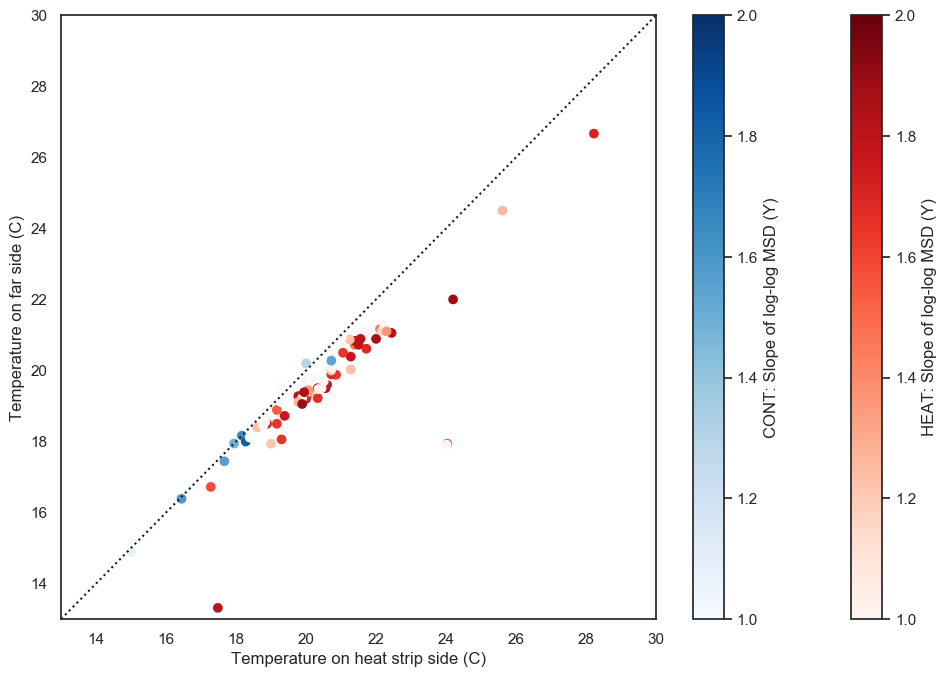

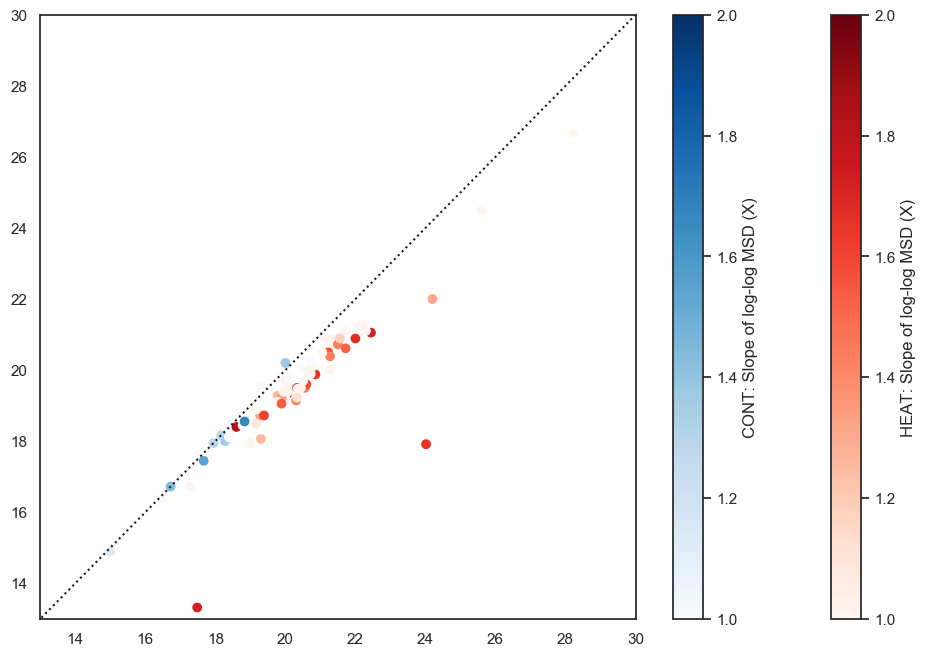

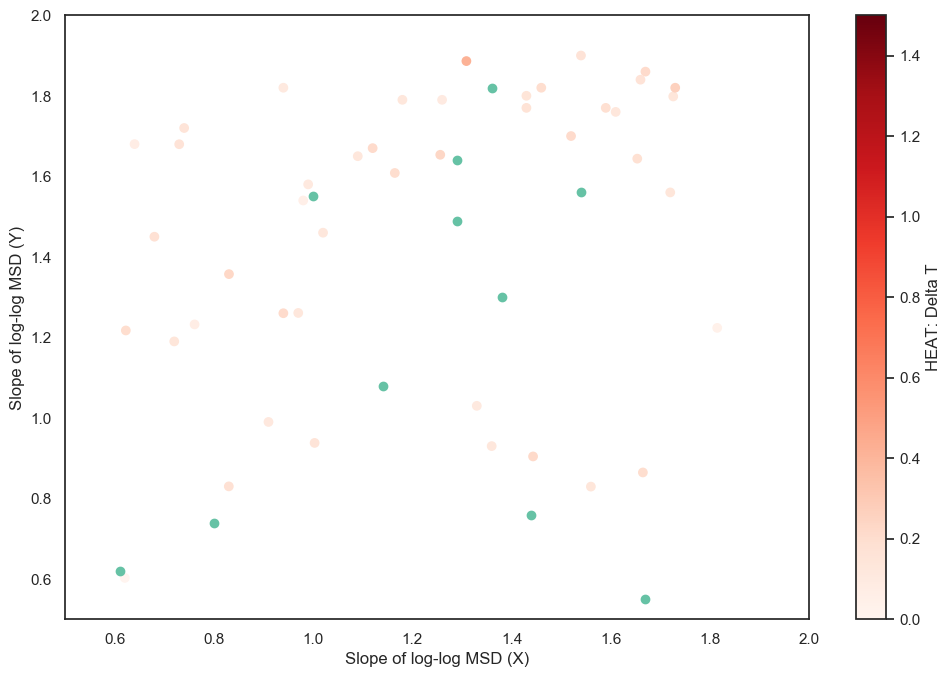

In [16]:
#T1, T2, colored by Y MSD

plt.figure()

for b in bins:
    if b == 'cont':
        plt.scatter(T1_list[b], T2_list[b], c = Y_MSD_list[b],cmap = 'Blues')

        cbar = plt.colorbar()
        cbar.set_label('CONT: Slope of log-log MSD (Y)')
    elif b == 'heat':
        plt.scatter(T1_list[b], T2_list[b], c = Y_MSD_list[b],cmap = 'Reds')

        cbar = plt.colorbar()
        cbar.set_label('HEAT: Slope of log-log MSD (Y)')
    plt.clim(1,2)
    plt.xlim([13,30])
    plt.ylim([13,30])

#Plot y=x for reference
x = np.linspace(11,30,100) 
y = x
plt.plot(x,y,':k')
plt.xlabel('Temperature on heat strip side (C)')
plt.ylabel('Temperature on far side (C)')

#T1, T2, colored by X MSD

plt.figure()

for b in bins:
    if b == 'cont':
        plt.scatter(T1_list[b], T2_list[b], c = X_MSD_list[b],cmap = 'Blues')

        cbar = plt.colorbar()
        cbar.set_label('CONT: Slope of log-log MSD (X)')
    elif b == 'heat':
        plt.scatter(T1_list[b], T2_list[b], c = X_MSD_list[b],cmap = 'Reds')

        cbar = plt.colorbar()
        cbar.set_label('HEAT: Slope of log-log MSD (X)')
    plt.clim(1,2)
    plt.xlim([13,30])
    plt.ylim([13,30])

#Plot y=x for reference
x = np.linspace(11,30,100) 
y = x
plt.plot(x,y,':k')

#X MSD, Y MSD, colored by Delta T

plt.figure()

for b in bins:
    
    if b == 'cont':
        plt.scatter(X_MSD_list[b], Y_MSD_list[b])
        #par = np.polyfit(X_MSD_list[b], Y_MSD_list[b], 1, full=True)
        #print(par)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)])
        #cbar = plt.colorbar()
        #cbar.set_label('CONT: Delta T')
    elif b == 'heat':
        plt.scatter(X_MSD_list[b], Y_MSD_list[b],  c =DeltaT_list[b], cmap = 'Reds')
        #par = np.polyfit(X_MSD_list[b], Y_MSD_list[b], 1, full=True)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)],'r')
        cbar = plt.colorbar()
        cbar.set_label('HEAT: Delta T')
    plt.clim(0,1.5)

plt.xlim([0.5,2])
plt.ylim([0.5,2])
plt.xlabel('Slope of log-log MSD (X)')
plt.ylabel('Slope of log-log MSD (Y)')


## Velocities, avg angle wrt y, modified straightness index


In [19]:
#0: Abs displacement, 1: velocity, 2: persistence velocity, 3: turning velocity, 4: angle, 5: angle2, 
# 6: y dir velocity, 7: x dir velocity, 8: y dir acceleration, 9: x dir acceleration, 10: WHETHER TO REMOVE!, 
#11: y displacement, 12: x displacement


import nolds
#Find the velocities
#all_w = [i for i in range(1,100,5)]

def V_overlapping_windows(bins, all_w, noise_threshold=0):

    V = {}

    for b in bins:    
        V[b] = {}
        for w in all_w: 
            V[b][w] = {}
            for key in traj_binned[b].keys():
                L = len(traj_binned[b][key][:,1])-2*w
                V[b][w][key] = np.zeros((L,14))   
                #Abs displacement, velocity, persistence velocity, turning velocity, angle, angle2, 
                #y dir velocity, x dir velocity, y dir acceleration, x dir acceleration, WHETHER TO REMOVE!, 
                #y displacement, x displacement
                temp = traj_binned[b][key]    
                for i in range(L):   
                    dx1 = temp[i+w, 0]  - temp[i, 0]
                    dx2 = temp[i+2*w, 0]  - temp[i+w, 0]
                    dy1 = temp[i+w, 1]  - temp[i, 1]
                    dy2 = temp[i+2*w, 1]  - temp[i+w, 1] 
                    x1 = temp[i+w, 0]
                    y1 = temp[i+w, 1]
                    x2 = temp[i+2*w, 0]
                    y2 = temp[i+2*w, 1]
                


                   #Angles wrt positive y axis

                    angle1 = np.arctan2(dx1,dy1)
                    angle2 = np.arctan2(dx2,dy2)

                    dot = np.dot(np.array([dx1,dy1]),np.array([dx2,dy2]))
                    norma = np.linalg.norm(np.array([dx1,dy1]))
                    normb = np.linalg.norm(np.array([dx2,dy2]))


                    if (norma * normb) <= noise_threshold:
                        angle = 0
                        V[b][w][key][i,10] = 1
                    else:
                        cos_theta = dot / (norma * normb)
                        V[b][w][key][i,10] = 0
                        if cos_theta < -1 or cos_theta > 1:
                            cos_theta = np.round(cos_theta,5)


                        angle = np.arccos(cos_theta)





                    V[b][w][key][i,0] = np.sqrt((y2-y1)**2+(x2-x1)**2)

                    #SPECIFY FRAME RATE
                    if b == 'cont_FrameRate10'or b == 'heat_FrameRate10':
                        framerate = 10
                    elif b == 'cont_FrameRate5'or b == 'heat_FrameRate5':
                        framerate = 5    
                    elif b == 'cont_FrameRate5'or b == 'heat_FrameRate2p5':
                        framerate = 2.5 
                    else:
                        framerate = 30

                    V[b][w][key][i,1] = V[b][w][key][i,0]/ (framerate/60*w)  #mm/min
                    V[b][w][key][i,2] = V[b][w][key][i,1] * np.cos(angle)
                    V[b][w][key][i,3] = V[b][w][key][i,1] * np.sin(angle)
                    V[b][w][key][i,4] = angle
                    V[b][w][key][i,5] = angle2
                    #Expect the biased trials to have negative y velocity
                    V[b][w][key][i,6] = (y2-y1)/(framerate/60*w)
                    V[b][w][key][i,7] = (x2-x1)/(framerate/60*w)
                    V[b][w][key][i,8] = (dy2-dy1)/(framerate/60*w)**2
                    V[b][w][key][i,9] = (dx2-dx1)/(framerate/60*w)**2
                    V[b][w][key][i,11] = dy2
                    V[b][w][key][i,12] = dx2
                    # col 13: DISTANCE FROM ORIGIN
                    V[b][w][key][i,13] = np.sqrt((y2-temp[0,1])**2+(x2-temp[0,0])**2) 
                    
    return V

def V_nonoverlapping_windows(bins, all_w, noise_threshold=0):
    
    V = {}

    for b in bins:    
        V[b] = {}
        for w in all_w: 
            V[b][w] = {}
            for key in traj_binned[b].keys():
                L = int(np.floor(len(traj_binned[b][key][:,1])/w - 2))
                V[b][w][key] = np.zeros((L,15))   
                #Abs displacement, velocity, persistence velocity, turning velocity, angle, angle2, 
                #y dir velocity, x dir velocity, y dir acceleration, x dir acceleration, WHETHER TO REMOVE!, 
                #y displacement, x displacement
                temp = traj_binned[b][key]    
                temp = temp.astype(float)
                for i in range(L):   
                    dx1 = temp[i*w + w, 0]  - temp[i*w, 0]
                    dx2 = temp[i*w+2*w, 0]  - temp[i*w+w, 0]
                    dy1 = temp[i*w+w, 1]  - temp[i*w, 1]
                    dy2 = temp[i*w+2*w, 1]  - temp[i*w+w, 1] 
                    x1 = temp[i*w+w, 0]
                    y1 = temp[i*w+w, 1]
                    x2 = temp[i*w+2*w, 0]
                    y2 = temp[i*w+2*w, 1]

                   #Angles wrt positive y axis
                    angle1 = math.atan2(dx1,dy1)
                    angle2 = math.atan2(dx2,dy2)
                    angle1 = np.arctan2(dx1,dy1)
                    angle2 = np.arctan2(dx2,dy2)

                    dot = np.dot(np.array([dx1,dy1]),np.array([dx2,dy2]))
                    norma = np.linalg.norm(np.array([dx1,dy1]))
                    normb = np.linalg.norm(np.array([dx2,dy2]))


                    if (dx1 * dy1) <= noise_threshold:
                        angle = 0
                        V[b][w][key][i,10] = 1
                    else:
                        cos_theta = dot / (norma * normb)
                        V[b][w][key][i,10] = 0
                        if cos_theta < -1 or cos_theta > 1:
#                             print(dx1)
#                             print(x1)
#                             print(x2)
#                             print(dy1)
                            cos_theta = np.round(cos_theta,5)


                        angle = np.arccos(cos_theta)





                    V[b][w][key][i,0] = np.sqrt((y2-y1)**2+(x2-x1)**2)

                    #SPECIFY FRAME RATE
                    if b == 'cont_FrameRate10'or b == 'heat_FrameRate10':
                        framerate = 10
                    elif b == 'cont_FrameRate5'or b == 'heat_FrameRate5':
                        framerate = 5    
                    elif b == 'cont_FrameRate5'or b == 'heat_FrameRate2p5':
                        framerate = 2.5 
                    else:
                        framerate = 30

                    V[b][w][key][i,1] = V[b][w][key][i,0]/ (framerate/60*w)  #mm/min
                    V[b][w][key][i,2] = V[b][w][key][i,1] * np.cos(angle)
                    V[b][w][key][i,3] = V[b][w][key][i,1] * np.sin(angle)
                    V[b][w][key][i,4] = angle
                    V[b][w][key][i,5] = angle2
                    #Expect the biased trials to have negative y velocity
                    V[b][w][key][i,6] = (y2-y1)/(framerate/60*w)
                    V[b][w][key][i,7] = (x2-x1)/(framerate/60*w)
                    V[b][w][key][i,8] = (dy2-dy1)/(framerate/60*w)**2
                    V[b][w][key][i,9] = (dx2-dx1)/(framerate/60*w)**2
                    V[b][w][key][i,11] = dy2 
                    V[b][w][key][i,12] = dx2
                    # col 13: DISTANCE FROM ORIGIN
                    V[b][w][key][i,13] = np.sqrt((y2-temp[0,1])**2+(x2-temp[0,0])**2)   
                    V[b][w][key][i,14] = norma*normb 
                    

    return V


        
#convert from (-pi,pi) to (0,2pi) then to deg
def convertangle (angle_list):
    angle_list = (2*np.pi + angle_list) * (angle_list < 0) + angle_list*(angle_list > 0)
    angle_list = np.rad2deg(angle_list)
    return angle_list

all_w = np.linspace(1,40,40, dtype = int)
#all_w_overlap = [1,2, 4,6,8,10,12,14,16,18,20]
V = V_nonoverlapping_windows(bins, all_w, noise_threshold = 0.0601**2)
V_overlap = V_overlapping_windows(bins, all_w, noise_threshold = 0.0601**2)





/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:133: RuntimeWarning: invalid value encountered in double_scalars


### Entropy analysis -- need more data points! 

In [20]:
import nolds
def util_granulate_time_series(time_series, scale):
    """Extract coarse-grained time series
    Args:
        time_series: Time series
        scale: Scale factor
    Returns:
        Vector of coarse-grained time series with given scale factor
    """
    n = len(time_series)
    b = int(np.fix(n / scale))
    temp = np.reshape(time_series[0:b*scale], (b, scale))
    cts = np.mean(temp, axis = 1)
    return cts
def SampEn(U, m, r):

    def _maxdist(x_i, x_j):
        result = max([abs(ua - va) for ua, va in zip(x_i, x_j)])
        return result

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = 0
        for i in range(len(x)):
            for j in range(len(x)):
                if i == j:
                    continue
                C += (_maxdist(x[i], x[j]) <= r)
        return C

    N = len(U)
        
    return -np.log(_phi(m+1) / _phi(m))

def multiscale_entropy(time_series, tolerance = None, maxscale = None):
    """Calculate the Multiscale Entropy of the given time series considering
    different time-scales of the time series.
    Args:
        time_series: Time series for analysis
        sample_length: Bandwidth or group of points
        tolerance: Tolerance (default = 0.1*std(time_series))
    Returns:
        Vector containing Multiscale Entropy
    Reference:
        [1] http://en.pudn.com/downloads149/sourcecode/math/detail646216_en.html
    """

    if tolerance is None:
        #we need to fix the tolerance at this level. If it remains 'None' it will be changed in call to sample_entropy()
        tolerance = 0.1*np.std(time_series)
    if maxscale is None:
        maxscale = len(time_series)

    mse = np.zeros(maxscale)

    for i in range(maxscale):
        temp = util_granulate_time_series(time_series, i+1)
        #mse[i] = SampEn(temp,1,0.2*np.std(time_series))
        mse[i] = nolds.sampen(temp,tolerance = 0.2*np.std(time_series))
    return mse

### Various violinplots and boxplots (Fig 3)

In [21]:
def FP_fnc (bins, traj_binned, r_threshold):    #r_threshold in mmm
    FP = {}
    FP_list = {}
    for b in bins: 
        FP[b] = {}
        FP_list[b] = []
        for key in traj_binned[b].keys():
            raw_data = traj_binned[b][key]
            passed_threshold = 0
            for t in range(len(raw_data[:,1])-1):
                dx = raw_data[t , 0]  - raw_data[0, 0]
                dy = raw_data[t , 1]  - raw_data[0, 1]
                
                r = (dx**2 + dy**2) ** 0.5
                if r > r_threshold:
                    FP[b][key] = t*0.5 #FP IS IN MINUTES
                    FP_list[b].append(t*0.5)
                    passed_threshold = 1
                    break
            if passed_threshold == 0:
                FP[b][key] = t*0.5 #FP IS IN MINUTES
                FP_list[b].append(t*0.5)
            continue

    return FP, FP_list
                    
#input the V matrix from above! y displacement is index 11, abs disp is index 0
#take the sum of absolute y displacements
def y_dir_index (V, w, bins, traj_binned):
    y_dir = {}
    for b in bins: 
        y_dir[b] = []
        for key in traj_binned[b].keys():
            y_dir[b].append(np.sum(-(V[b][w][key][:,11]))/np.sum(V[b][w][key][:,0])) 

            
      
    return y_dir

def y_straightness_index (bins, traj_binned,V):
    y_straightness  = {}
    for b in bins: 
        y_straightness[b] = []
        for key in traj_binned[b].keys():
            l = len(traj_binned[b][key][:,0])-1
            y_straightness[b].append(((traj_binned[b][key][l,0]-traj_binned[b][key][0,0])**2 +
                                      (traj_binned[b][key][l,1]-traj_binned[b][key][0,1])**2)**0.5 / np.sum(V[b][w][key][:,0])) 
    
 
    return y_straightness

#avg angle wrt positive y axis
def avg_param (V, w, bins, traj_binned, paramnumber, remove = 'no', todeg = 'no', flipsign = 'no'):
    avg_param_mat = {}
    for b in bins: 
        avg_param_mat[b] = []
        for key in traj_binned[b].keys():
            raw_data = V[b][w][key]
            if remove == 'yes':
                temp_mat = removal(raw_data, paramnumber)
            else:
                temp_mat = raw_data[:,paramnumber]
            if todeg == 'yes':
                temp_mat = convertangle(temp_mat)
                
            #By default, towards heat is -ve. Flip to yes if Towards heat should be +ve
            if flipsign == 'yes':
                temp_mat = -temp_mat
            #avg_param_mat[b].append(np.mean(temp_mat))     #all pts... use for everything except avg_param_x,y and avg_param_speed
            avg_param_mat[b].append(np.mean(temp_mat[-210:-10]))   #last 200 pts offset by 10 .. use for avg_param_x,y and avg_param_speed
            
#             if key == '226':
#                 print('226: '+ str(np.mean(temp_mat[-210:-10])))
#             if key == '229':
#                 print('229: '+ str(np.mean(temp_mat[-210:-10])))      
           
    
    #whole traf
            if key == '226':
                print('226: '+ str(np.mean(temp_mat)))
            if key == '232':
                print('232: '+ str(np.mean(temp_mat)))        

    return avg_param_mat 


w=2
w_overlap = 20
y_dir = y_dir_index(V, w, bins, traj_binned)
avg_param_y = avg_param(V, w, bins, traj_binned,6, flipsign = 'yes')
avg_param_x = avg_param(V, w, bins, traj_binned,7, flipsign = 'no')
y_straightness = y_straightness_index (bins, traj_binned,V)

turnangle = avg_param(V, w, bins, traj_binned,4, flipsign = 'no')
angle = avg_param(V, w, bins, traj_binned,5, flipsign = 'no')

avg_param_speed = avg_param(V, w, bins, traj_binned,1, flipsign = 'no')

avg_param_thermotaxis_index = {}
for b in bins: 
    avg_param_thermotaxis_index[b] = []
    for i in range(len(avg_param_speed[b])):
        avg_param_thermotaxis_index[b].append(avg_param_y[b][i]/avg_param_speed[b][i])


FP_detailed, FP_plot = FP_fnc (bins, traj_binned, 5)


# boxplot_x = ['Control', 'Heat', 'Heat with Stir']


# dir_boxplot_data = [y_dir['cont'], y_dir['heat'], y_dir['Stir_Heat']]
# angle_boxplot_data = [avg_param_y['cont'], avg_param_y['heat'], avg_param_y['Stir_Heat']]
# straightness_boxplot_data = [y_straightness['cont'], y_straightness['heat'], y_dir['Stir_Heat']]
# angle_boxplot_data_x = [avg_param_x['cont'], avg_param_x['heat'], avg_param_x['Stir_Heat']]


boxplot_x = ['Control', 'Heat']


dir_boxplot_data = [y_dir['cont'], y_dir['heat']]
angle_boxplot_data = [avg_param_y['cont'], avg_param_y['heat']]
straightness_boxplot_data = [y_straightness['cont'], y_straightness['heat']]
angle_boxplot_data_x = [avg_param_x['cont'], avg_param_x['heat']]
turnangle_data = [turnangle['cont'], turnangle['heat']]
angle_data = [angle['cont'], angle['heat']]

FP = [FP_plot['cont'], FP_plot['heat']]

speed_data = [avg_param_speed['cont'], avg_param_speed['heat']]
T_index = [avg_param_thermotaxis_index['cont'], avg_param_thermotaxis_index['heat']]



232: 0.3055939781546422
226: -0.00018339998821040578
232: 0.0660233903420523
226: 0.0018339998821040513
232: 0.3696119109725564
226: nan
232: 0.5964000475082836
226: 0.16244544101546207
232: 0.5916663249500064
226: 0.25480362191733646


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:187: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


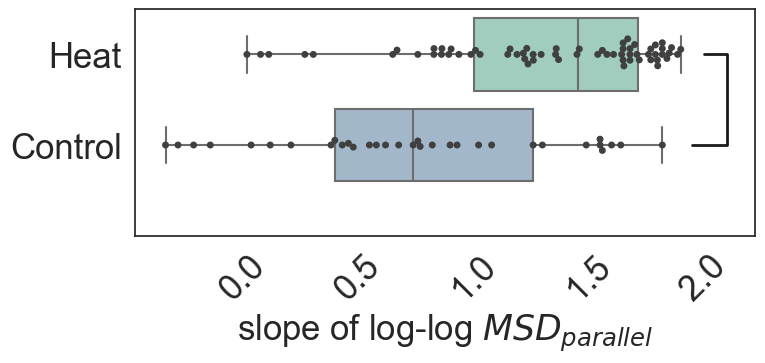

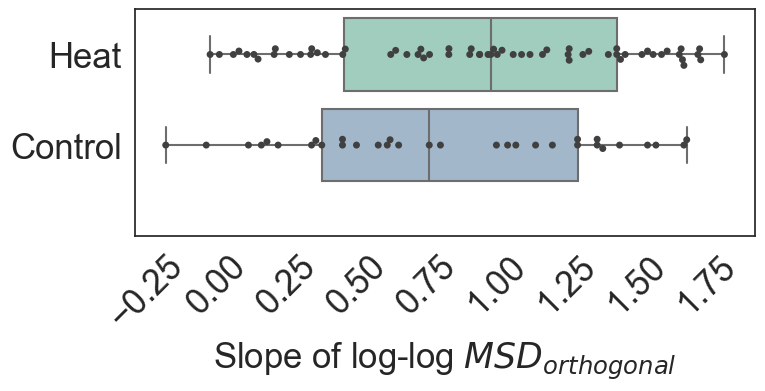

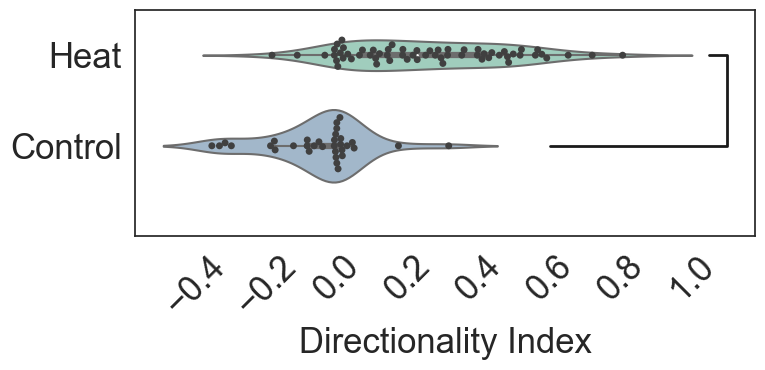

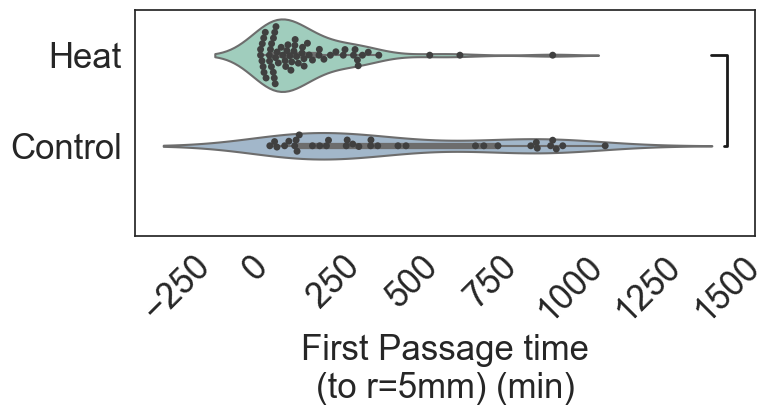

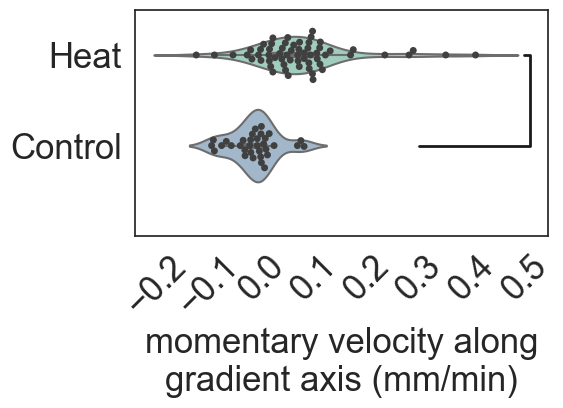

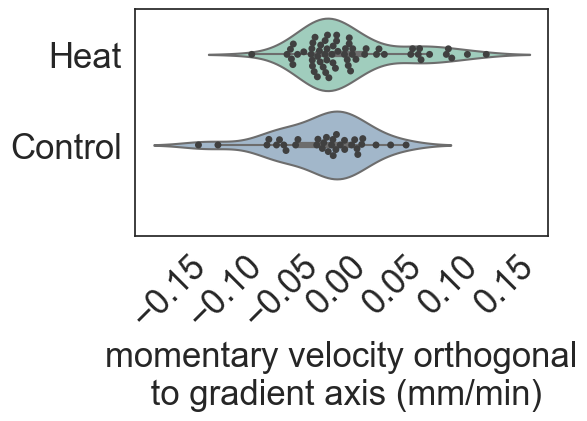

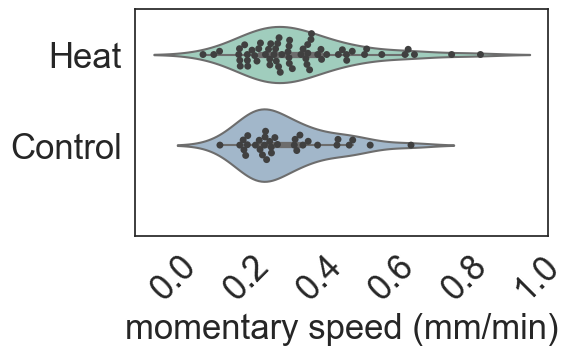

<Figure size 1200x800 with 0 Axes>

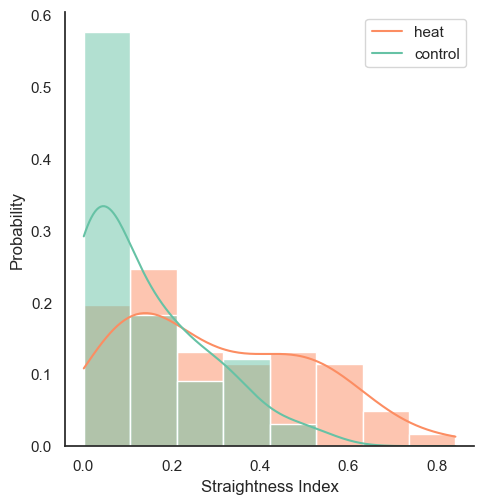

<Figure size 1200x800 with 0 Axes>

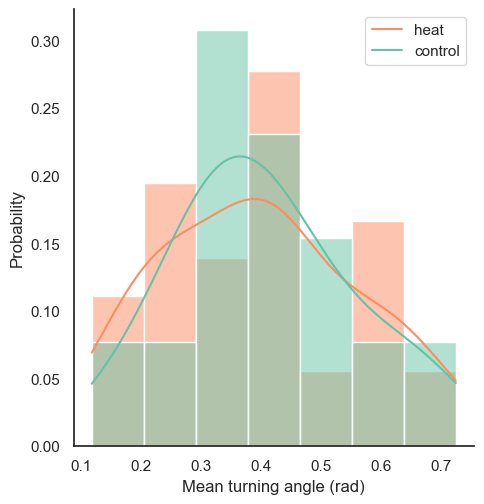

<Figure size 1200x800 with 0 Axes>

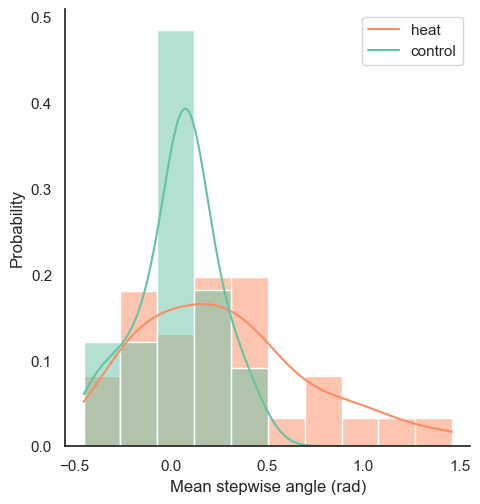

<Figure size 1200x800 with 0 Axes>

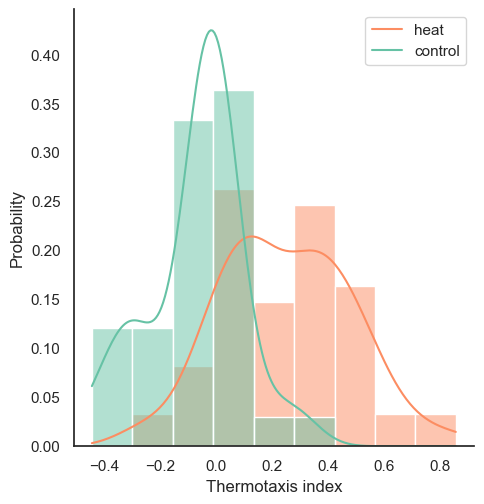

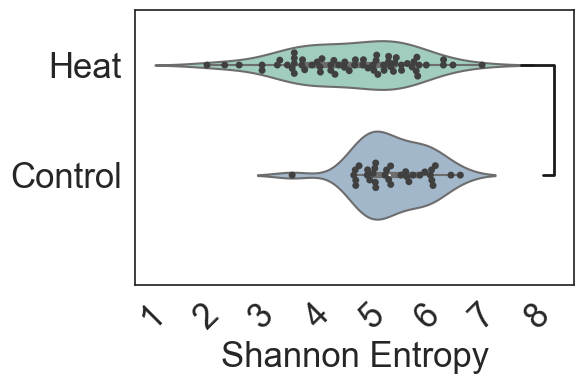

<Figure size 1200x800 with 0 Axes>

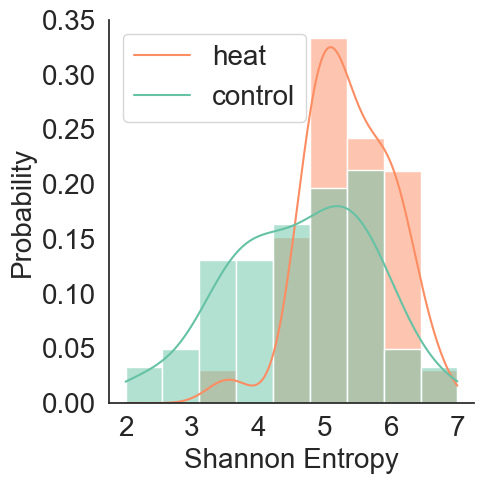

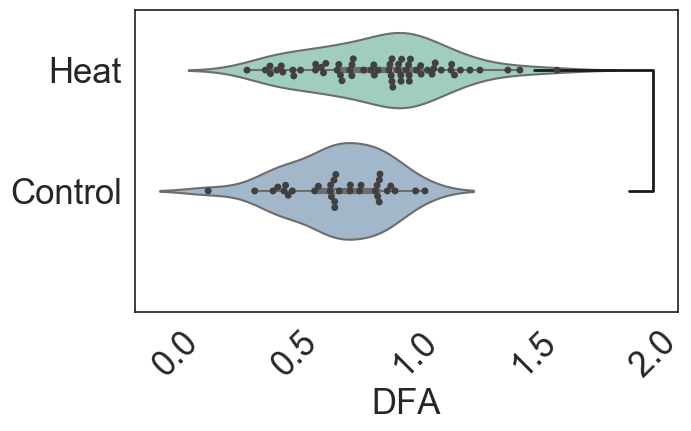

<Figure size 1200x800 with 0 Axes>

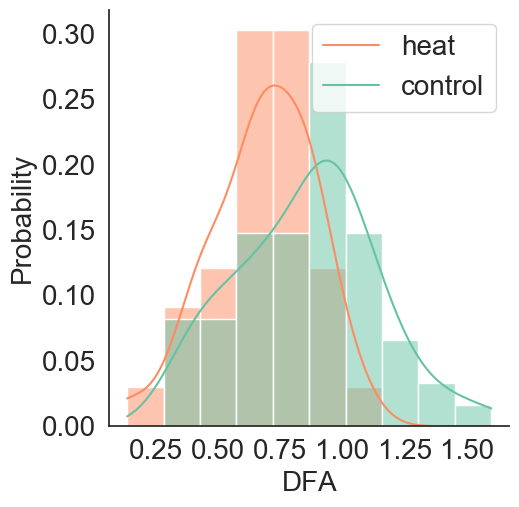

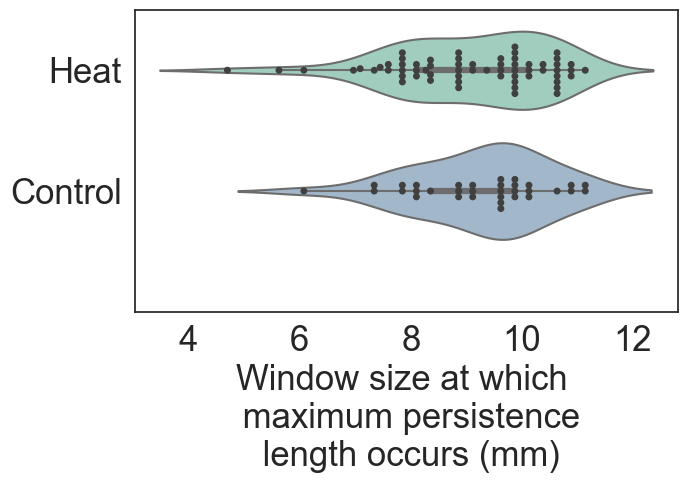

In [24]:
#Plot as Violinplots

rmsd_y_last200 = rmsd_y_last200.sort_values(by = ['condition'], ascending= False)
rmsd_xy = rmsd_xy.sort_values(by = ['condition'], ascending = False)


palette = palette_3color

plt.figure(figsize=[8,3])
sns.boxplot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x = "Y_MSD", y = "condition", palette = palette)
sns.swarmplot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x = "Y_MSD", y = "condition", color = "0.25")
plt.xlabel ('slope of log-log $MSD_{parallel}$',fontsize = 25)
plt.ylabel("")
plt.xticks (fontsize = 25)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.xticks(fontsize = 25,rotation=45)
plt.yticks(fontsize = 25)
plt.ylabel("")
plt.plot([2,2.1,2.1,1.95], [0, 0, 1, 1], linewidth=2, color='k')
plt.savefig(cwd+'/PaperFigs/YMSD Boxplot.png', bbox_inches="tight")

plt.figure(figsize=[8,3])
sns.boxplot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x = "X_MSD", y = "condition", palette = palette)
sns.swarmplot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x = "X_MSD", y = "condition", color = "0.25")
plt.ylabel("")
plt.xticks (fontsize = 25)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.xticks(fontsize = 25,rotation=45)
plt.yticks(fontsize = 25)
plt.ylabel("")
plt.xlabel ('Slope of log-log $MSD_{orthogonal}$',fontsize = 25)
plt.savefig(cwd+'/PaperFigs/XMSD Boxplot.png', bbox_inches="tight")

plt.figure(figsize=[8,3])
temp_plot_df = pd.DataFrame(y_dir.items(), columns=['condition', 'data'])
temp_plot_df = temp_plot_df[temp_plot_df["condition"]!= "Stir_Heat"]
temp_plot_df = temp_plot_df.explode("data")
temp_plot_df["data"] = temp_plot_df["data"].apply(pd.to_numeric)
sns.violinplot(data=temp_plot_df, x = "data", y = "condition", palette = palette)
sns.swarmplot(data=temp_plot_df, x = "data", y = "condition", color = '0.25')
plt.plot([1.05,1.1,1.1,0.6], [0, 0, 1, 1], linewidth=2, color='k')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
title = 'y directionality index histogram'
plt.xlabel('Directionality Index', fontsize = 25)
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")
del temp_plot_df

plt.figure(figsize=[8,3])
temp_plot_df = pd.DataFrame(FP_plot.items(), columns=['condition', 'data'])
temp_plot_df = temp_plot_df[temp_plot_df["condition"]!= "Stir_Heat"]
temp_plot_df = temp_plot_df.explode("data")
temp_plot_df["data"] = temp_plot_df["data"].apply(pd.to_numeric)
sns.violinplot(data=temp_plot_df, x = "data", y = "condition", palette = palette)
sns.swarmplot(data=temp_plot_df, x = "data", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
title = 'First Passage time to r 5mm'
plt.xlabel('First Passage time\n(to r=5mm) (min)', fontsize = 25)
plt.xticks (fontsize = 25)
plt.yticks (fontsize = 25)
plt.plot([1450,1500,1500,1490], [0, 0, 1, 1], linewidth=2, color='k')
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")

plt.figure(figsize=[8*2/3,3])
temp_plot_df = pd.DataFrame(avg_param_y.items(), columns=['condition', 'data'])
temp_plot_df = temp_plot_df[temp_plot_df["condition"]!= "Stir_Heat"]
temp_plot_df = temp_plot_df.explode("data")
temp_plot_df["data"] = temp_plot_df["data"].apply(pd.to_numeric)
sns.violinplot(data=temp_plot_df, x = "data", y = "condition", palette = palette)
sns.swarmplot(data=temp_plot_df, x = "data", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.plot([0.5,0.51,0.51,0.3], [0, 0, 1, 1], linewidth=2, color='k')
plt.xlabel('momentary velocity along\ngradient axis (mm/min)', fontsize = 25)
title = 'stepwise Y velocity violinplot'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")


plt.figure(figsize=[8*2/3,3])
temp_plot_df = pd.DataFrame(avg_param_x.items(), columns=['condition', 'data'])
temp_plot_df = temp_plot_df[temp_plot_df["condition"]!= "Stir_Heat"]
temp_plot_df = temp_plot_df.explode("data")
temp_plot_df["data"] = temp_plot_df["data"].apply(pd.to_numeric)
sns.violinplot(data=temp_plot_df, x = "data", y = "condition", palette = palette)
sns.swarmplot(data=temp_plot_df, x = "data", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.xlabel('momentary velocity orthogonal\n to gradient axis (mm/min)', fontsize = 25)
title = 'stepwise X velocity boxplot'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")


plt.figure(figsize=[8*2/3,3])
temp_plot_df = pd.DataFrame(avg_param_speed.items(), columns=['condition', 'data'])
temp_plot_df = temp_plot_df[temp_plot_df["condition"]!= "Stir_Heat"]
temp_plot_df = temp_plot_df.explode("data")
temp_plot_df["data"] = temp_plot_df["data"].apply(pd.to_numeric)
sns.violinplot(data=temp_plot_df, x = "data", y = "condition", palette = palette)
sns.swarmplot(data=temp_plot_df, x = "data", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.xlabel('momentary speed (mm/min)', fontsize = 25)
title = 'stepwise speed boxplot'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")

plt.figure()
sns.displot(data=straightness_boxplot_data, kde = True, legend = False,stat = 'probability', common_norm=False,palette="Set2")
plt.legend(['heat','control'])
plt.xlabel('Straightness Index')
title = 'straightness index violinplot'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")

plt.figure()
sns.displot(data=turnangle_data, kde = True, legend = False,stat = 'probability', common_norm=False,palette="Set2")
plt.legend(['heat','control'])
plt.xlabel('Mean turning angle (rad)')
title = 'Turning angle histogram'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")

plt.figure()
sns.displot(data=angle_data, kde = True, legend = False,stat = 'probability', common_norm=False,palette="Set2")
plt.legend(['heat','control'])
plt.xlabel('Mean stepwise angle (rad)')
title = 'Stepwise angle histogram'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")


plt.figure()
sns.displot(data=T_index, kde = True, legend = False,stat = 'probability', common_norm=False,palette="Set2")
plt.legend(['heat','control'])
plt.xlabel('Thermotaxis index')
title = 'Thermotaxis index histogram'
plt.savefig(cwd+'/PaperFigs/'+title + '.png', bbox_inches="tight")


plt.figure(figsize=[6,4])
rmsd_xy[["Entropy_Shannon_Window_Size_20"]] = rmsd_xy[["Entropy_Shannon_Window_Size_20"]].apply(pd.to_numeric)
sns.violinplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'],x = "Entropy_Shannon_Window_Size_20", y = "condition", palette = palette)
sns.swarmplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x = "Entropy_Shannon_Window_Size_20", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.xlabel('Shannon Entropy', fontsize = 25)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.plot([7.7,8.3,8.3,8.1], [0, 0, 1, 1], linewidth=2, color='k')
plt.tight_layout()
plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Entropy_Shannon Boxplot.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Entropy_Shannon_Window_Size_20", legend = False,kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Shannon Entropy', fontsize = 20)
plt.ylabel('Probability',fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize=20)
plt.legend(['heat','control'], fontsize = 20)
plt.tight_layout()
plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Entropy_Shannon hist.png', bbox_inches="tight")


plt.figure(figsize=[7,4])
rmsd_xy[["DFA"]] = rmsd_xy[["DFA"]].apply(pd.to_numeric)
sns.violinplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'],x = "DFA", y = "condition", palette = palette)
sns.swarmplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x = "DFA", y = "condition", color = '0.25')
plt.ylabel("")
plt.xticks (fontsize = 25,rotation=45)
plt.xlabel('DFA', fontsize = 25)
plt.yticks ([0,1,2], ["Heat", "Control"],fontsize = 25)
plt.plot([1.5,2,2,1.9], [0, 0, 1, 1], linewidth=2, color='k')
plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/DFA boxplot.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="DFA", kde = True, legend = False, hue="condition",stat = 'probability', common_norm=False)
plt.legend(['heat','control'], fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize=20)
plt.xlabel('DFA', fontsize = 20)
plt.ylabel('Probability',fontsize = 20)
plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/DFA hist.png', bbox_inches="tight")



plt.figure(figsize=[7,4])
#sns.boxplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x = "condition", y = "Lp Peak", palette="Set3")
rmsd_xy[["Lp Peak"]] = rmsd_xy[["Lp Peak"]].apply(pd.to_numeric)
sns.violinplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'],x = "Lp Peak", y = "condition", palette = palette)
sns.swarmplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x = "Lp Peak", y = "condition", color = '0.25')
plt.xlabel ('Window size at which \n maximum persistence\n length occurs (mm)', fontsize = 25)
plt.ylabel('')
plt.yticks([0,1,2],['Heat', 'Control'],fontsize = 25)
plt.xticks(fontsize = 25)
plt.savefig(cwd+'/PaperFigs/Lp Peak Boxplot.png', bbox_inches="tight")


## Time of day

[0.2252282244789523, 0.016920950446840628, 0.2618851881346533, -0.007618957190604311, 0.5776728570054923, -0.0015311018806987674, 0.40894709237103155, 0.5659766152009583, 0.4279183868065616, 0.41469679437845675, 0.09345631590175917, 0.4808373523062046, 0.11972877763232427, 0.0002820140389241191, 0.2770114947584957, -0.007321853638589491, 0.35179369963754836, 0.28513513820918224, 0.3116793573879451, 0.5915785461782023, 0.6521422892831993, 0.31291382682944885, 0.24993706628639342, -0.03455859119003973, 0.7199376327647523, 0.10220095363430726, 0.002046489569598037, 0.5202075094874854, 0.4840664709657793, 0.11167023176530151, 0.43666741371159756, 0.1444425911767174, 0.2261662343947226, 0.017917773062817503, 0.18567463212362034, 0.5595361690298675, 0.15527953087613156, 0.3584247464429704, 0.06313269094780424, 0.5164971627892861, 0.07157843327269878, 0.2985086693468791, 0.3957078189106629, 0.19783869879593627, 0.2933797541179058, 0.45766990965399656, 0.141649132214168, 0.39784048680094974, 0

61

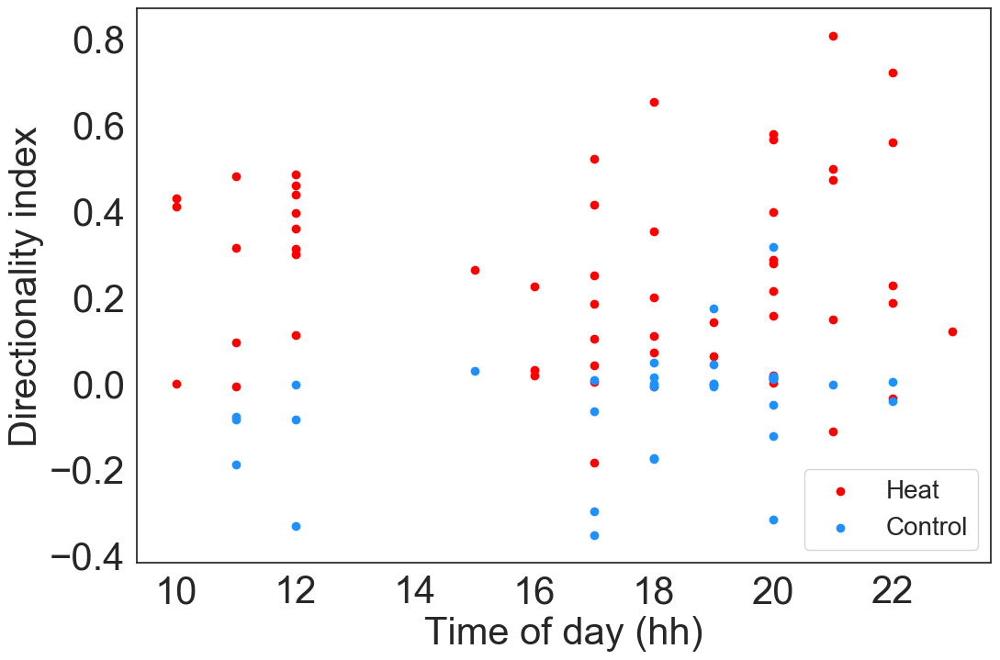

In [25]:
#Y MSD VS TIME OF DAY

plt.figure()

for b in bins:
    if b == 'heat':
        plt.scatter(Time_List[b], y_dir[b], c = '#FF0000' , label = 'Heat')
    elif b == 'cont':
        plt.scatter(Time_List[b], y_dir[b], label = 'Control', c = '#1E90FF')

    plt.clim(0,1.5)

#plt.xlim([0.5,2])
#plt.ylim([0.5,2])
plt.legend(loc = 'lower right', fontsize = 20)
plt.xticks(fontsize = 30)
plt.yticks (fontsize = 30)
plt.xlabel('Time of day (hh)', fontsize = 30)
plt.ylabel('Directionality index', fontsize = 30)
title = 'hour of day'
plt.savefig(cwd+'/PaperFigs/'+title + '.png')

print(y_dir['heat'])
len(Time_List['heat'])

## RMSD Plots

In [26]:
import pandas as pd

def replicate(times, data):
    result2 = []
    for i in range(times):
        for item in data:
            result2.append(item)
    return result2


types = ['RMSD, whole trajectory','RMSD_parallel, whole trajectory',
         'RMSD, [t-105, t-5] min','RMSD_parallel, [t-105, t-5] min']

keylist = replicate(len(types), list(filtered_traj.keys()))

df_tau = pd.DataFrame({'Trials': keylist })
df_vtau = pd.DataFrame({'Trials': keylist })

df_tau['Condition'] = ''
df_tau['Type'] = ''
df_tau['Value'] = ''


df_vtau = pd.DataFrame({'Trials': keylist })
df_vtau['Condition'] = ''
df_vtau['Value'] = ''

c = 0
trials_id = list(filtered_traj.keys())
start_ind = c
end_ind = c+len(trials_id)

for i in range(len(types)):
    df_tau.loc[start_ind:end_ind,'Type'] = types[i]  
    df_vtau.loc[start_ind:end_ind,'Type'] = types[i]
    start_ind = end_ind
    end_ind = start_ind+ int(len(trials_id)) 

    
      
for b in bins: 
    for key in traj_binned[b].keys():
        for w in types:
            for i in range(len(df_tau['Trials'])):
                trialnum =  int(df_tau.loc[i,'Trials'])
                if (trialnum == int(key)):
                    df_tau.loc[i,'Condition']= b
                    df_vtau.loc[i,'Condition']= b
                    
                    if w == df_tau.loc[i,'Type']:
                        if w =='RMSD, whole trajectory':
                            df_tau.loc[i,'Value'] = float(rmsd_xy[rmsd_xy['Trial'] == int(key)]['tau'])
                            df_vtau.loc[i,'Value'] = float(rmsd_xy[rmsd_xy['Trial'] == int(key)]['v tau product'])
                        elif w == 'RMSD_parallel, whole trajectory':
                            df_tau.loc[i,'Value'] = float(rmsd_y[rmsd_y['Trial'] == int(key)]['tau'])
                            df_vtau.loc[i,'Value'] = float(rmsd_y[rmsd_y['Trial'] == int(key)]['v tau product'])
                        elif w == 'RMSD, [t-105, t-5] min':
                            df_tau.loc[i,'Value'] = float(rmsd_xy_last200[rmsd_xy_last200['Trial'] == int(key)]['tau'])
                            df_vtau.loc[i,'Value'] = float(rmsd_xy_last200[rmsd_xy_last200['Trial'] == int(key)]['v tau product'])
                        elif w == 'RMSD_parallel, [t-105, t-5] min':
                            df_tau.loc[i,'Value']= float(rmsd_y_last200[rmsd_y_last200['Trial'] == int(key)]['tau'])
                            df_vtau.loc[i,'Value']= float(rmsd_y_last200[rmsd_y_last200['Trial'] == int(key)]['v tau product'])
                                             

                        
# rmsd_x_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='x only')
# rmsd_y_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='y only')
# rmsd_x = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='x entire traj')
# rmsd_y = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='y entire traj')
# rmsd_xy = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='xy entire traj')
# rmsd_xy_last200 = pd.read_excel('Taylor RMSD combined.xlsx', sheet_name='xy')
      



In [76]:
#sanity check
df_vtau[df_vtau['Trials']== '226']


,Trials,Condition,Value,Type
68,226,cont,0.020817,"RMSD, whole trajectory"
167,226,cont,0.00368018,"RMSD_parallel, whole trajectory"
266,226,cont,0.0131507,"RMSD, [t-105, t-5] min"
365,226,cont,0.0194107,"RMSD_parallel, [t-105, t-5] min"


## Additional plots for the statistical metrics figure!

0.8732168931469892
50.16710191329306


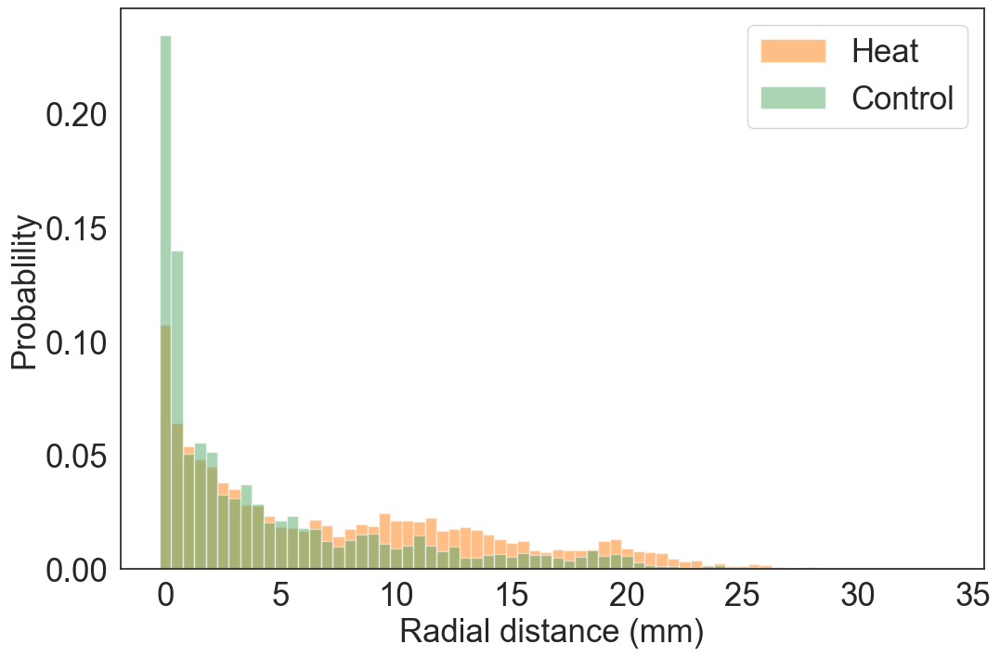

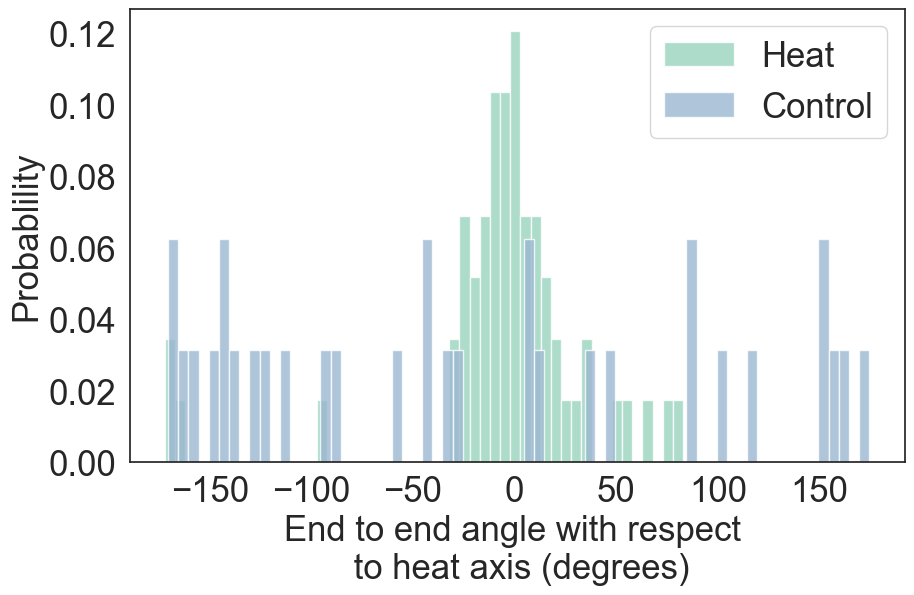

<Figure size 1000x500 with 0 Axes>

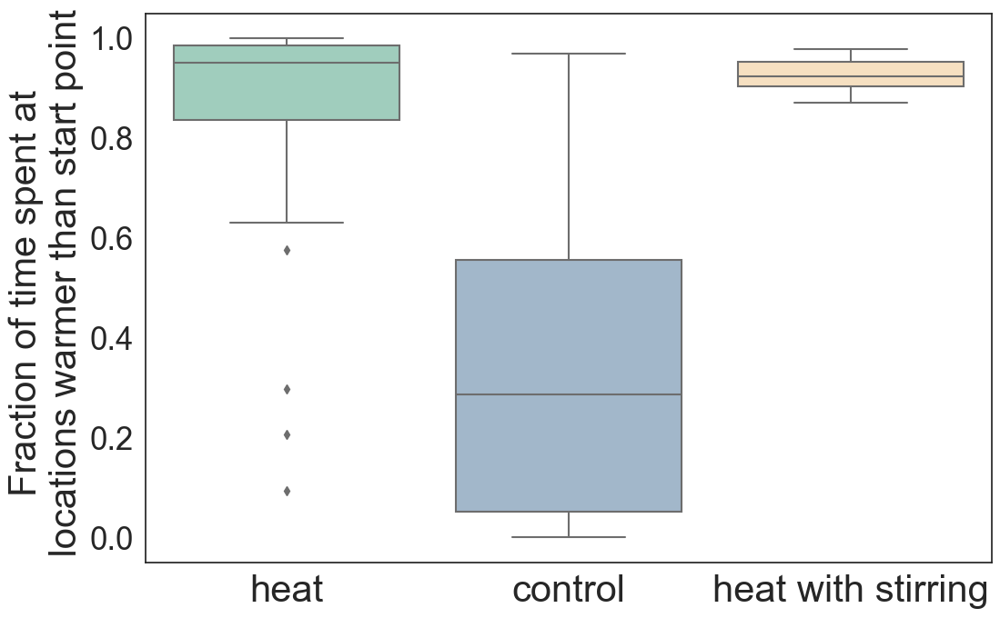

In [97]:
# DISTANCE FROM ORIGIN
plt.figure()
  
dists_heat = []
dists_cont = []
for key in traj_binned_raw['heat'].keys(): 
    dists_heat = dists_heat + list(abs(V['heat'][2][key][:,13][:]))
for key in traj_binned_raw['cont'].keys(): 
    dists_cont = dists_cont + list(abs(V['cont'][2][key][:,13][:]))

h3, edge_3 = np.histogram(dists_heat,bins=np.arange(min(dists_heat), max(dists_heat), 0.5), density=True)
binwidth_3 = edge_3[1] - edge_3[0]
h2, edge_2 = np.histogram(dists_cont,bins=np.arange(min(dists_cont), max(dists_cont), 0.5), density=True)
binwidth_2 = edge_2[1] - edge_2[0]
plt.bar(edge_3[:-1], h3*binwidth_3, binwidth_3, alpha = 0.5, color = 'tab:orange', label = 'Heat')
plt.bar(edge_2[:-1], h2*binwidth_2, binwidth_2, alpha = 0.5, color = 'g', label = 'Control')
#plt.title('Distance from center of dish')
plt.legend(fontsize = 25)
plt.xlabel('Radial distance (mm)',fontsize = 25)
plt.ylabel('Probablility' ,fontsize = 25)
plt.xticks (fontsize = 25)
plt.yticks (fontsize = 25)

plt.savefig(cwd+'/PaperFigs/distfromdishcenter.png')



#END TO END ANGLE
 
End_to_end_angles_heat = []
End_to_end_angles_cont = []
for key in traj_binned_raw['heat'].keys(): 
    #Angles wrt NEGATIVE y axis (i.e. HEAT AXIS)
    temp = np.arctan2(traj_binned['heat'][key][-1,0], - traj_binned['heat'][key][-1,1])* 180 / np.pi
    End_to_end_angles_heat.append(temp)
for key in traj_binned_raw['cont'].keys(): 
    temp = np.arctan2(traj_binned['cont'][key][-1,0], - traj_binned['cont'][key][-1,1])* 180 / np.pi
    End_to_end_angles_cont.append(temp)
plt.figure(figsize = [10,6])
h3, edge_3 = np.histogram(End_to_end_angles_heat,bins=np.arange(min(End_to_end_angles_heat), max(End_to_end_angles_heat), 5), density=True)
binwidth_3 = edge_3[1] - edge_3[0]
h2, edge_2 = np.histogram(End_to_end_angles_cont,bins=np.arange(min(End_to_end_angles_cont), max(End_to_end_angles_cont), 5), density=True)
binwidth_2 = edge_2[1] - edge_2[0]
plt.bar(edge_3[:-1], h3*binwidth_3, binwidth_3, alpha = 0.8, color = ['#99D4BF'], label = 'Heat')
plt.bar(edge_2[:-1], h2*binwidth_2, binwidth_2, alpha = 0.8, color = ['#9BB7D1'], label = 'Control')
plt.legend(fontsize = 25)
plt.xlabel('End to end angle with respect \n to heat axis (degrees)', fontsize = 25)
plt.ylabel('Probablility', fontsize = 25)
plt.xticks (fontsize = 25)
plt.yticks (fontsize = 25)

#Calculate mean and Standard deviation.
mean = np.mean(End_to_end_angles_heat)
sd = np.std(End_to_end_angles_heat)
print(mean)
print(sd)

plt.savefig(cwd+'/PaperFigs/end_to_end_angle_wrt_negative_y.png', bbox_inches="tight")


Frac_neg_y = {}
Frac_neg_y_plt = []
for b in bins:    
    Frac_neg_y[b] = []
    for key in traj_binned[b].keys():
        total_num_pt =  len(traj_binned[b][key][:,1])
        temp = traj_binned[b][key]  
        origin = temp[0,1]
        tally = 0
        for i in range(len(temp)):
            if temp[i,1] < temp[0,1]:
                tally += 1
        Frac_neg_y[b].append(tally/total_num_pt)
    Frac_neg_y_plt.append(list(Frac_neg_y[b]))
plt.figure(figsize = [10,5])
fig1, ax1 = plt.subplots()
#ax1.set_title('Fraction of pts below starting point')

Frac_df = pd.DataFrame(Frac_neg_y.items(), columns=['condition', 'data'])
Frac_df = Frac_df.explode('data')
sns.boxplot(data = Frac_df, x = 'condition', y = 'data', palette = palette_3color)
plt.xticks([0,1,2],['heat', 'control', 'heat with stirring'], fontsize = 30)
plt.xlabel("")
plt.yticks(fontsize = 25)
plt.ylabel ('Fraction of time spent at \n locations warmer than start point', fontsize = 30)
title = 'Fraction of pts below starting point'
plt.savefig(cwd + '/PaperFigs/'+title + '.png', bbox_inches = 'tight')

In [28]:
#Find mean, stdev of MSD values

print('Y MSD mean, heat:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'heat', "Y_MSD"].mean())
print('Y MSD stdev, heat:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'heat', "Y_MSD"].sem())
print('Y MSD mean, cont:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'cont', "Y_MSD"].mean())
print('Y MSD stdev, cont:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'cont', "Y_MSD"].sem())
print('X MSD mean, heat:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'heat', "X_MSD"].mean())
print('X MSD stdev, heat:' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'heat', "X_MSD"].sem())
print('X MSD mean:, cont' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'cont', "X_MSD"].mean())
print('X MSD stdev:, cont' , rmsd_y_last200.loc[rmsd_y_last200['condition'] == 'cont', "X_MSD"].sem())

Y MSD mean, heat: 1.3264602908192107
Y MSD stdev, heat: 0.0617218098985939
Y MSD mean, cont: 0.7508454545454546
Y MSD stdev, cont: 0.10529239627742819
X MSD mean, heat: 0.9475157274850633
X MSD stdev, heat: 0.06817284360718023
X MSD mean:, cont 0.817369696969697
X MSD stdev:, cont 0.09381022555283432


## Neurokit complexity analysis

In [30]:
complexities = {}
dfa = {}
for b in bins: 
    complexities[b] = {} 
    dfa[b] ={}

    for key in traj_binned[b].keys():
        complexities[b][key] = {}
        for w in all_w:
            #TWEAK THE COLUMN TO USE DIF THINGS FOR COMPLEXITY ANALYSIS
            complexities[b][key][w] = nk.complexity(V[b][w][key][:,6], sampling_rate=1/30, shannon=True, sampen=False, multiscale=False, spectral=True, svd=True, correlation=True, higushi=True, petrosian=True, fisher=True, hurst=True, dfa=True, lyap_r=False, lyap_e=True, emb_dim=2, tolerance='default', k_max=8, bands=None, tau=1)
            
# KMEANS on the complexity vectors
import pandas as pd
def replicate(times, data):
    result2 = []
    for i in range(times):
        for item in data:
            result2.append(item)
    return result2

keylist = replicate(len(all_w), list(filtered_traj.keys()))

df = pd.DataFrame({'Trials': keylist })


writer = pd.ExcelWriter('Neurokit_results_V_many_window_sizes.xlsx', engine='xlsxwriter')
df['Condition'] = ''
df['window size'] = ''
c = 0
trials_id = list(filtered_traj.keys())
start_ind = c
end_ind = c+len(trials_id)
for i in range(len(all_w)):
    print(all_w[i])
    print(start_ind)
    print(end_ind)
    df.loc[start_ind:end_ind,'window size'] = all_w[i]   
    start_ind = end_ind
    end_ind = start_ind+ int(len(trials_id)) 
print(df)
    
for k in complexities['heat']['47'][2].keys():
    df[k] = ''
      
for b in bins: 
    for key in traj_binned[b].keys():
        for w in all_w:
            temp = complexities[b][key][w]
            for i in range(len(df['Trials'])):
                trialnum =  int(df.loc[i,'Trials'])
                if (trialnum == int(key)) and (w == df.loc[i,'window size']):
                    for key2 in temp.keys():
                        df.loc[i,str(key2)]=temp[key2]
                        df.loc[i,'Condition'] = b

df.to_excel("Neurokit_results_V_many_window_sizes.xlsx")  

results_window_lengths = {}
all_data = {}



for b in bins: 
    results_window_lengths[b] = {}
    all_data[b] = {}
    temp = complexities['heat']['43'][1]
    for metric in temp.keys():
        results_window_lengths[b][metric] = {}
        all_data[b][metric] = {}
        for w in all_w:
            all_data[b][metric][w] = []
        for key in traj_binned[b].keys():
            max_init = -100000
            w_init = -10000
            
            for w in all_w:
                temp_w = complexities[b][key][w]
                try:
                    all_data[b][metric][w].append(temp_w[metric])
                    if temp_w[metric] > max_init:
                        max_init = temp_w[metric]
                        w_init = w
                except KeyError:
                    continue
            
            results_window_lengths[b][metric][key] = np.array([[w_init], [max_init]])    
            



            
    


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 17 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [7, 8] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning:

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 18 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 17 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 17 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning:

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [7, 8] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, t

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_reg

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/sign

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  kee

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute SVD Entropy.
NeuroKit warning: complexity(): Failed to compute fractal_dim.
NeuroKit warning: complexity(): Failed to compute Fisher Information.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute SVD Entropy.
NeuroKit warning: complexity(): Failed to compute fractal_dim.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  kee

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measure

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremel

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [7, 8] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 9 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not r

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 17 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measure

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signa

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [5, 6] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 7 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signa

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning:

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [7, 8] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 9 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future d

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points 

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [4, 5] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 6 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signa

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurok

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signa

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1250: RankWarning: Polyfit may be poorly conditioned
  poly = poly_fit(xvals, yvals, 1, fit=fit)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [0, 1] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 2 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/mea

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklear

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakas

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 17 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakas

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signa

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  kee

NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute SVD Entropy.
NeuroKit warning: complexity(): Failed to compute fractal_dim.
NeuroKit warning: complexity(): Failed to compute Fisher Information.
NeuroKit warning: complexity(): Failed to compute dfa.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warn

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 18 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakas

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 11 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/sign

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 18 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 18 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWar

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakas

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to 

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 18 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and 

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurok

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 19 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakas

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning:

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 20 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/en

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 14 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:49

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 12 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [7, 8] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC di

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [6, 7] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 8 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:519: RuntimeWarning: invalid value encountered in double_scalars
  Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precis

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 15 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 13 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/sklearn/metrics/_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 11 data points are n

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:1516: RuntimeWarning: choosing nvals = [8, 9] , DFA with less than ten data points is extremely unreliable
  warnings.warn(msg.format(nvals),RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 10 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/sign

NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:48: RuntimeWarning: RANSAC did not reach consensus, using numpy's polyfit
  RuntimeWarning)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/nolds/measures.py:495: RuntimeWarning: 16 data points are not enough! For emb_dim = 10, matrix_dim = 4, min_tsep = 0 and min_nb = 8 you need at least 21 data points in your time series
  RuntimeWarning
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/comp

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  (p, r1, r2, s)=np.linalg.lstsq(x, L)
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/neurokit/signal/complexity.py:526: FutureWarning: `rco

NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
NeuroKit warning: complexity(): Failed to compute lyap_e.
1
0
99
2
99
198
3
198
297
4
297
396
5
396
495
6
495
594
7
594
693
8
693
792
9
792
891
10
891
990
11
990
1089
12
1089
1188
13
1188
1287
14
1287
1386
15
1386
1485
16
1485
1584
17
1584
1683
18
1683
1782
19
1782
1881
20
1881
1980
21
1980
2079
22
2079
2178
23
2178
2277
24
2277
2376
25
2376
2475
26
2475
2574
27
2574
2673
28
2673
2772
29
2772
2871
30
2871
2970
31
2970
3069
32
3069
3168
33
3168
3267
34
3267
3366
35
3366
3465
36
3465
3564
37
3564
3663
38
3663
3762
39
3762
3861
40
3861
3960
     Trials Condition window size
0       249                     1
1       103                     1
2       248                     1
3       258                     1
4       264                     1
...     ...       ..

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have bee

<Figure size 1200x800 with 0 Axes>

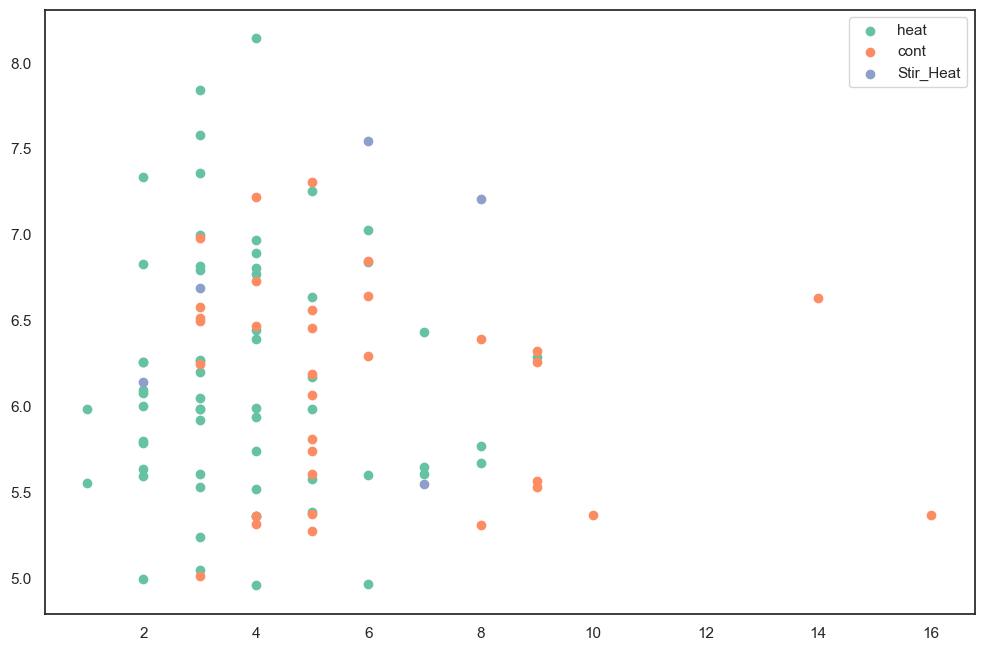

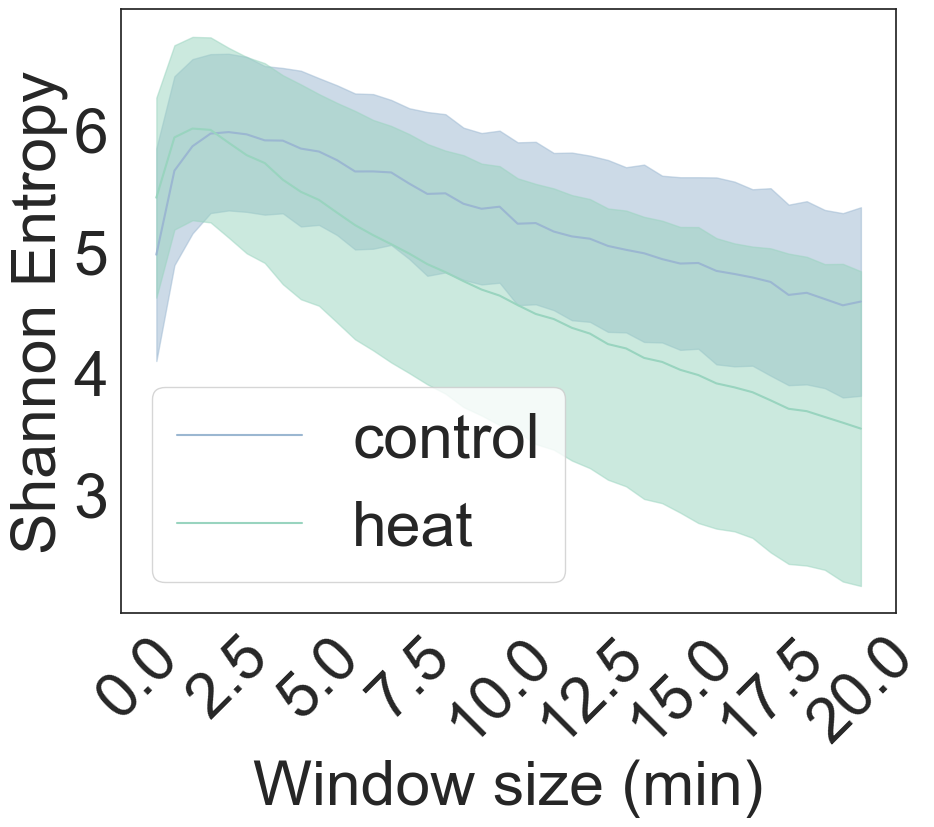

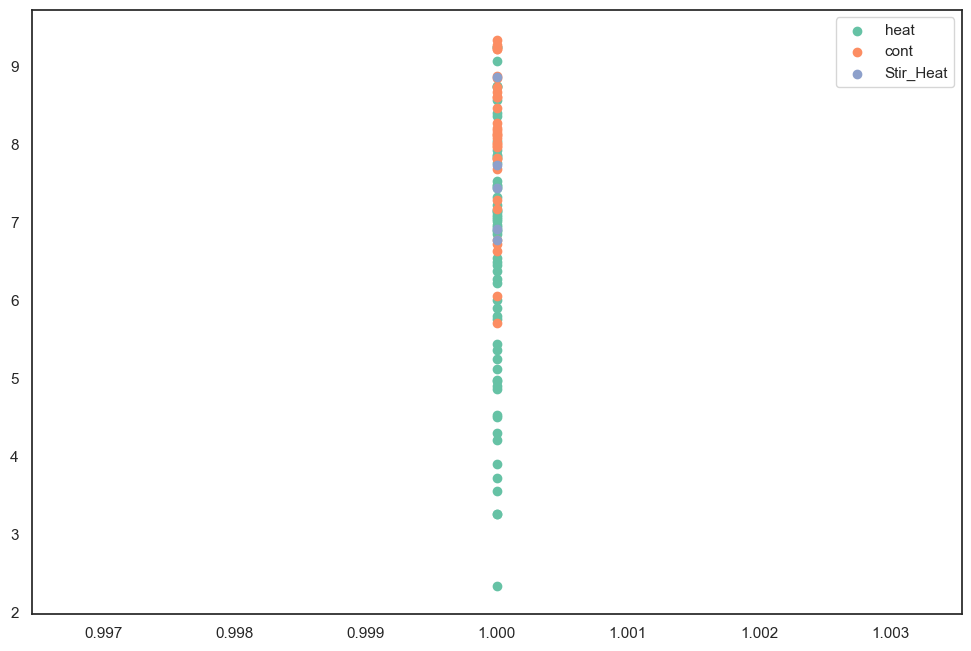

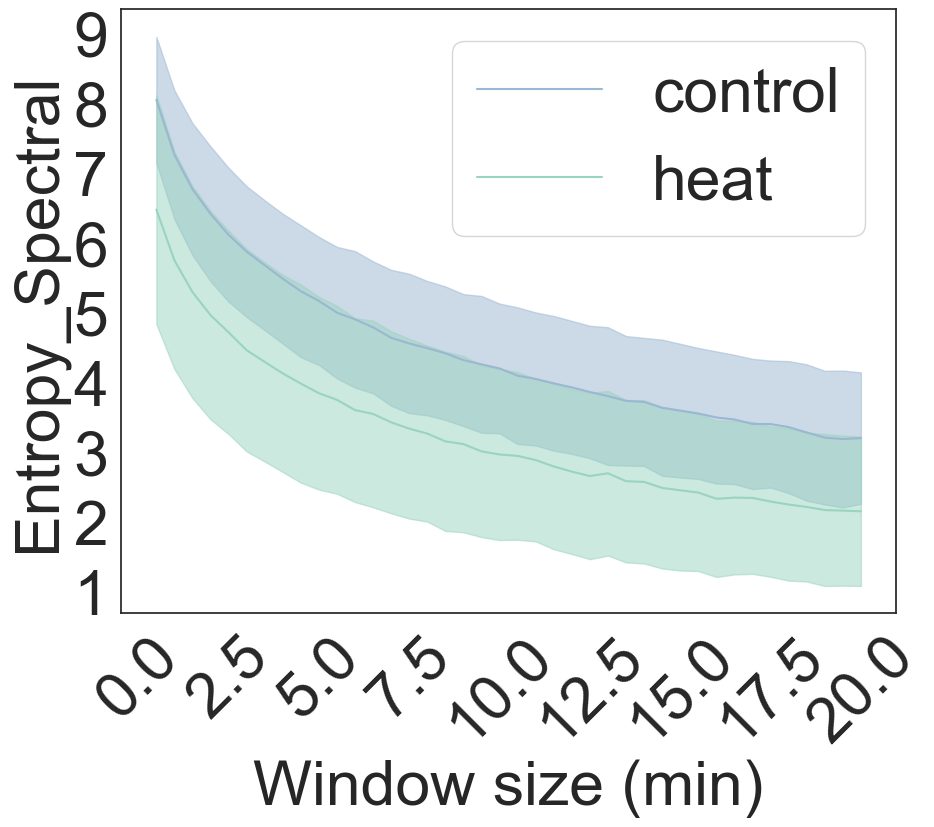

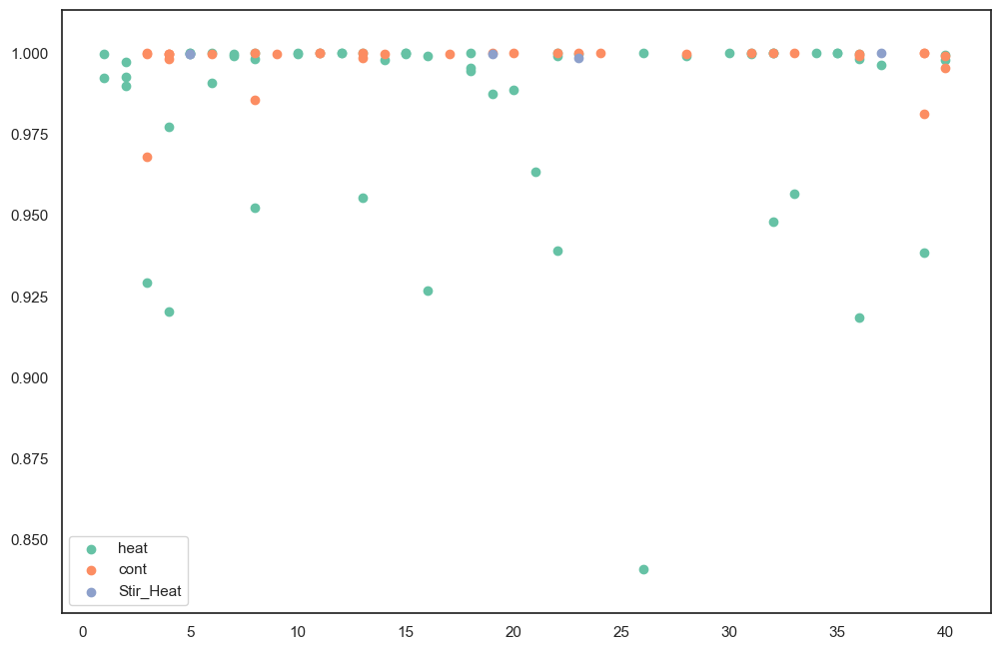

...

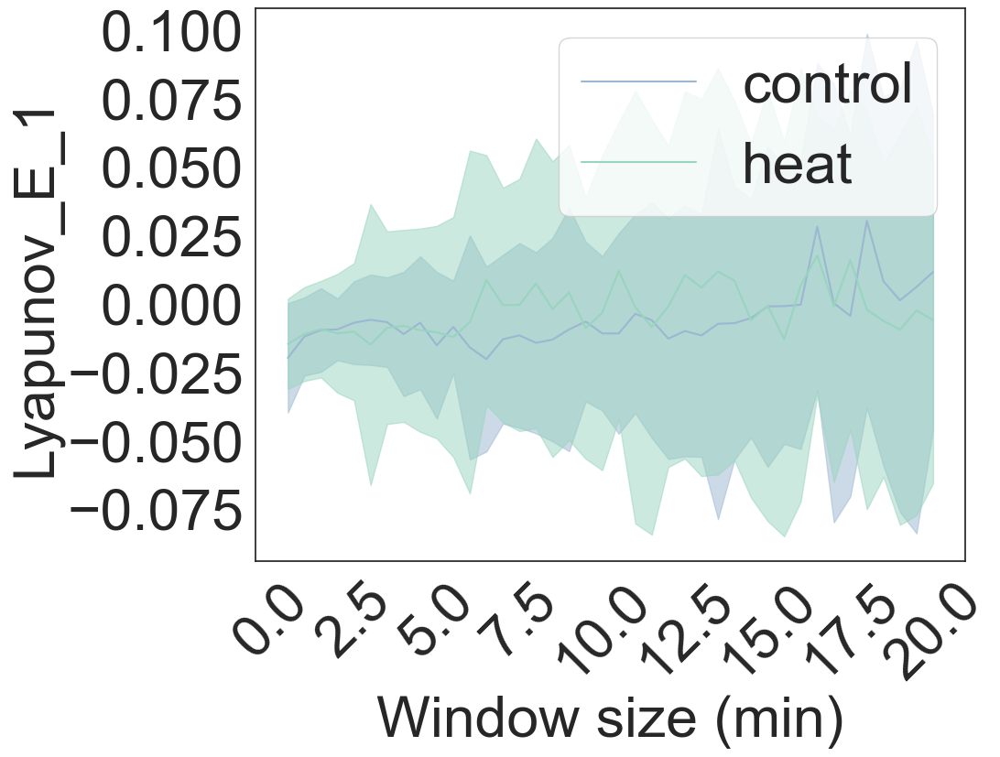

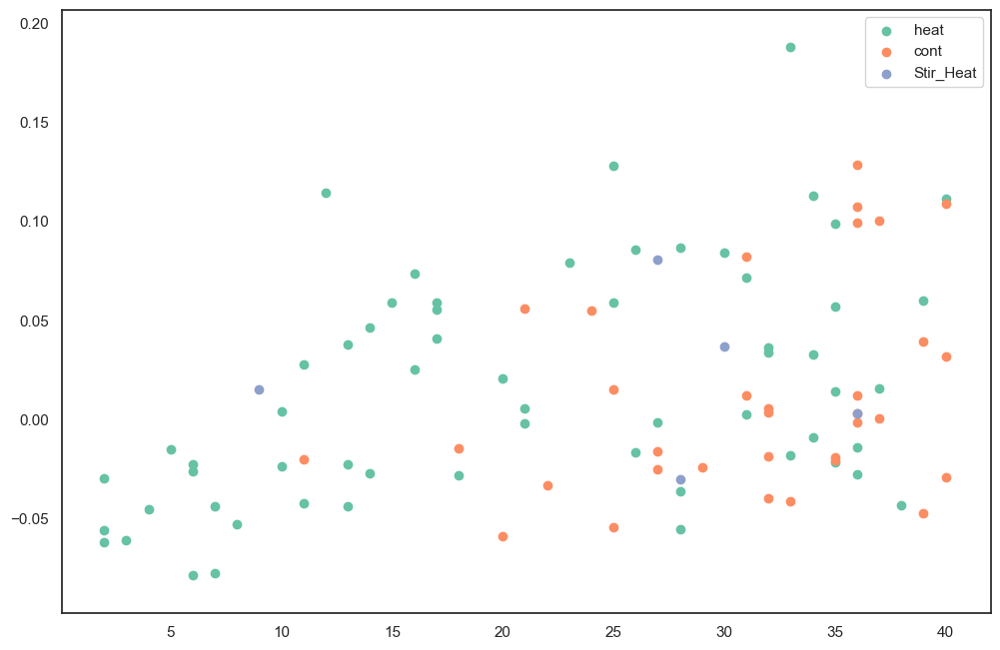

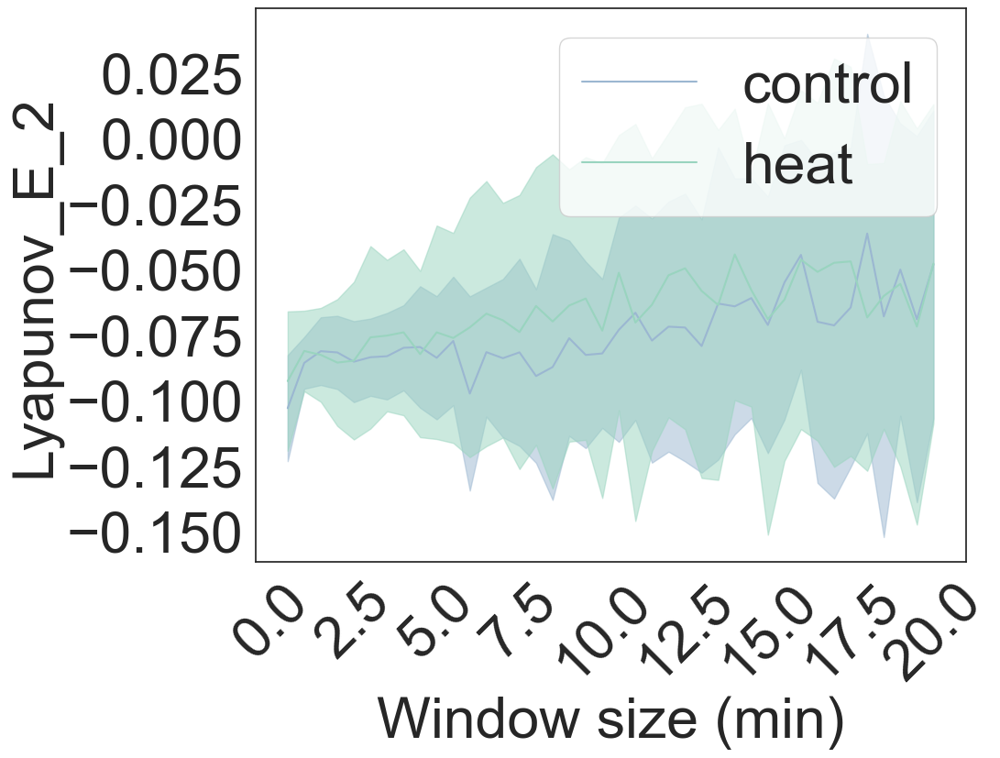

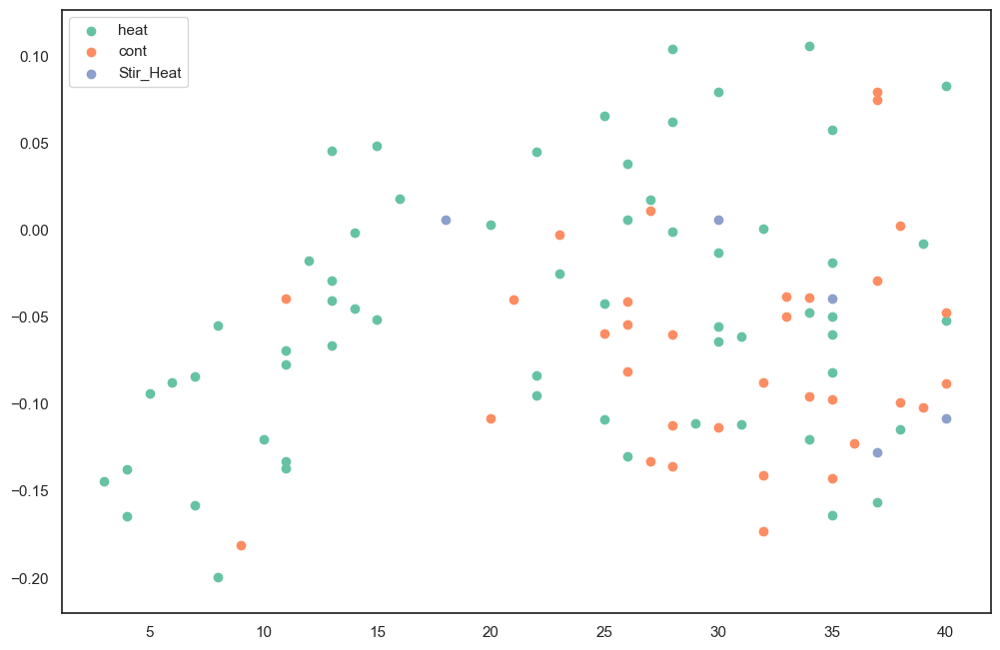

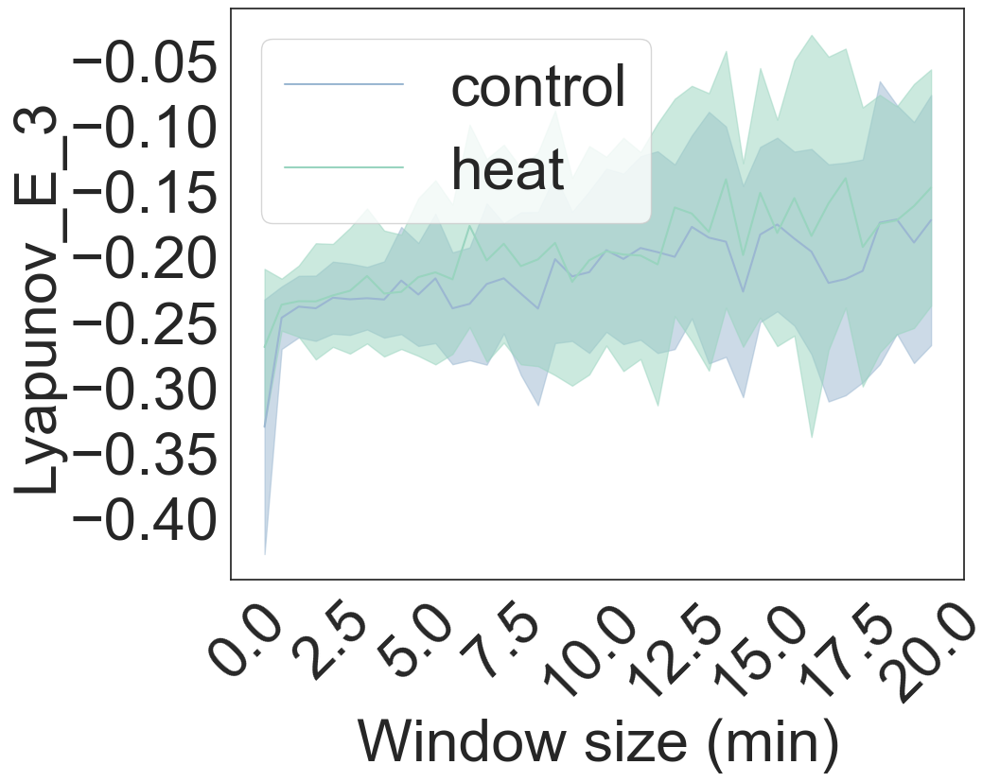

In [31]:
plt.tight_layout()
for metric in results_window_lengths[bins[0]].keys():
    plt.figure()
    for b in bins:
        plot_results = np.concatenate([results_window_lengths[b][metric][x] for x in sorted(results_window_lengths[b][metric])], 1)
        plt.scatter(plot_results[0,:], plot_results[1,:], label = b)
        plt.legend()
    title = metric
    plt.savefig(cwd+'/PaperFigs/fig3 varying window size/' + title + '.png')
    

    plt.figure(figsize=(10,8))
    for b in ['cont','heat']:
        x = np.array(list(all_data[b][metric].keys()))
        y = []
        error = []
        for val in all_data[b][metric].values():
            y.append(np.mean(val))
            error.append(np.std(val))
        # Plot scatter plot
        y = np.array(y)
        x = x/2
        error = np.array(error)
        if b == 'heat':
            plt.plot(x, y, label = b, color = palette_3color[0])
            plt.fill_between(x, y-error, y+error,alpha = 0.5, color = palette_3color[0])

        elif b == 'cont':
            plt.plot(x, y, label = 'control', color = palette_3color[1])
            plt.fill_between(x, y-error, y+error,alpha = 0.5, color = palette_3color[1])
    if metric == 'DFA':
        plt.xlim([0,12])
        plt.ylim([0,15])
    plt.xlabel ('Window size (min)', fontsize = 45)
    plt.ylabel (metric, fontsize = 45)
    if metric == 'Entropy_Shannon':
        plt.ylabel ('Shannon Entropy', fontsize = 45)
    plt.legend (fontsize = 45)
    plt.xticks (fontsize = 45, rotation = 45)
    plt.yticks(fontsize = 45)
    title = metric + 'across window size.png'
    plt.savefig(cwd + '/PaperFigs/fig3 varying window size/' + title,bbox_inches='tight')

## Mann whitney tests

In [32]:
import scipy

# print('Directionality index: ', scipy.stats.ttest_ind(dir_boxplot_data[0], dir_boxplot_data[1], equal_var=False) )
# print('V_parallel: ', scipy.stats.ttest_ind(angle_boxplot_data[0], angle_boxplot_data[1], equal_var=False) )
# print('V_orthogonal: ', scipy.stats.ttest_ind(angle_boxplot_data_x[0], angle_boxplot_data_x[1], equal_var=False) )
# print('straightness index: ', scipy.stats.ttest_ind(straightness_boxplot_data[0], straightness_boxplot_data[1], equal_var=False) )
# print('turning angle: ', scipy.stats.ttest_ind(turnangle_data[0], turnangle_data[1], equal_var=False) )
# print('stepwise angle: ', scipy.stats.ttest_ind(angle_data[0], angle_data[1], equal_var=False) )
# print('Speed: ', scipy.stats.ttest_ind(speed_data[0], speed_data[1], equal_var=False) )
# print('FP Time: ', scipy.stats.ttest_ind(FP[0], FP[1], equal_var=False) )
# print('Thermotaxis index: ', scipy.stats.ttest_ind(T_index[0], T_index[1], equal_var=False) )

print('Directionality index: ', scipy.stats.mannwhitneyu(dir_boxplot_data[0], dir_boxplot_data[1]) )
print('V_parallel: ', scipy.stats.mannwhitneyu(angle_boxplot_data[0], angle_boxplot_data[1]) )
print('V_orthogonal: ', scipy.stats.mannwhitneyu(angle_boxplot_data_x[0], angle_boxplot_data_x[1]) )
print('straightness index: ', scipy.stats.mannwhitneyu(straightness_boxplot_data[0], straightness_boxplot_data[1]) )
print('turning angle: ', scipy.stats.mannwhitneyu(turnangle_data[0], turnangle_data[1]) )
print('stepwise angle: ', scipy.stats.mannwhitneyu(angle_data[0], angle_data[1]) )
print('Speed: ', scipy.stats.mannwhitneyu(speed_data[0], speed_data[1]) )
print('FP Time: ', scipy.stats.mannwhitneyu(FP[0], FP[1]) )
print('Thermotaxis index: ', scipy.stats.mannwhitneyu(T_index[0], T_index[1]) )


Lp_heat = rmsd_xy[rmsd_xy['condition'] == 'heat']["Lp Peak"]
Lp_cont = rmsd_xy[rmsd_xy['condition'] == 'cont']["Lp Peak"]
print('Lp Peak: ', scipy.stats.mannwhitneyu(Lp_heat, Lp_cont) )

Tp_heat = rmsd_xy[rmsd_xy['condition'] == 'heat']["Tp Peak"]
Tp_cont = rmsd_xy[rmsd_xy['condition'] == 'cont']["Tp Peak"]
print('Tp Peak: ', scipy.stats.ttest_ind(Tp_heat.dropna(), Tp_cont.dropna(), equal_var=False) )


Tp_heat = rmsd_y_last200[rmsd_y_last200['condition'] == 'heat']["Y_MSD"]
Tp_cont = rmsd_y_last200[rmsd_y_last200['condition'] == 'cont']["Y_MSD"]
print('Y MSD: ', scipy.stats.mannwhitneyu(Tp_heat, Tp_cont) )

Tp_heat = rmsd_y_last200[rmsd_y_last200['condition'] == 'heat']["X_MSD"]
Tp_cont = rmsd_y_last200[rmsd_y_last200['condition'] == 'cont']["X_MSD"]
print('X MSD: ', scipy.stats.mannwhitneyu(Tp_heat, Tp_cont) )

Tp_heat = all_data['heat']['DFA'][20]
Tp_cont = all_data['cont']['DFA'][20]
print('DFA: ', scipy.stats.mannwhitneyu(Tp_heat, Tp_cont) )

Tp_heat = all_data['heat']['Entropy_Shannon'][20]
Tp_cont = all_data['cont']['Entropy_Shannon'][20]
print('Entropy Shannon: ', scipy.stats.mannwhitneyu(Tp_heat, Tp_cont) )

Directionality index:  MannwhitneyuResult(statistic=213.0, pvalue=1.6739967841684332e-10)
V_parallel:  MannwhitneyuResult(statistic=286.0, pvalue=5.869514175175487e-09)
V_orthogonal:  MannwhitneyuResult(statistic=815.0, pvalue=0.0651392222979451)
straightness index:  MannwhitneyuResult(statistic=524.0, pvalue=6.722572491674723e-05)
turning angle:  MannwhitneyuResult(statistic=776.0, pvalue=0.034231822808654146)
stepwise angle:  MannwhitneyuResult(statistic=670.0, pvalue=0.0038882695359141904)
Speed:  MannwhitneyuResult(statistic=855.0, pvalue=0.115819962351292)
FP Time:  MannwhitneyuResult(statistic=427.0, pvalue=2.2526888829618616e-06)
Thermotaxis index:  MannwhitneyuResult(statistic=241.0, pvalue=6.808590794268523e-10)
Lp Peak:  MannwhitneyuResult(statistic=984.0, pvalue=0.3356852139875335)
Tp Peak:  Ttest_indResult(statistic=-2.0295042078290786, pvalue=0.045981889901900885)
Y MSD:  MannwhitneyuResult(statistic=466.0, pvalue=3.5788148394635435e-06)
X MSD:  MannwhitneyuResult(statisti

In [33]:
results_window_lengths[b][metric]

{'249': array([[ 3.90000000e+01],
        [-7.81526975e-03]]),
 '248': array([[38.        ],
        [-0.11432772]]),
 '258': array([[13.        ],
        [-0.04046951]]),
 '264': array([[30.        ],
        [-0.06438205]]),
 '107': array([[11.        ],
        [-0.07714617]]),
 '265': array([[22.        ],
        [-0.09509888]]),
 '38': array([[ 8.        ],
        [-0.05507809]]),
 '110': array([[ 7.        ],
        [-0.08395628]]),
 '39': array([[ 6.        ],
        [-0.08761974]]),
 '229': array([[2.00000000e+01],
        [3.17246001e-03]]),
 '62': array([[31.        ],
        [-0.06132861]]),
 '63': array([[11.        ],
        [-0.13669907]]),
 '228': array([[11.        ],
        [-0.06917494]]),
 '216': array([[3.20000000e+01],
        [8.00154638e-04]]),
 '49': array([[15.        ],
        [ 0.04825381]]),
 '61': array([[2.70000000e+01],
        [1.70924868e-02]]),
 '60': array([[14.        ],
        [-0.04528582]]),
 '48': array([[25.        ],
        [-0.04217

## SENSITIVITY PLOTS

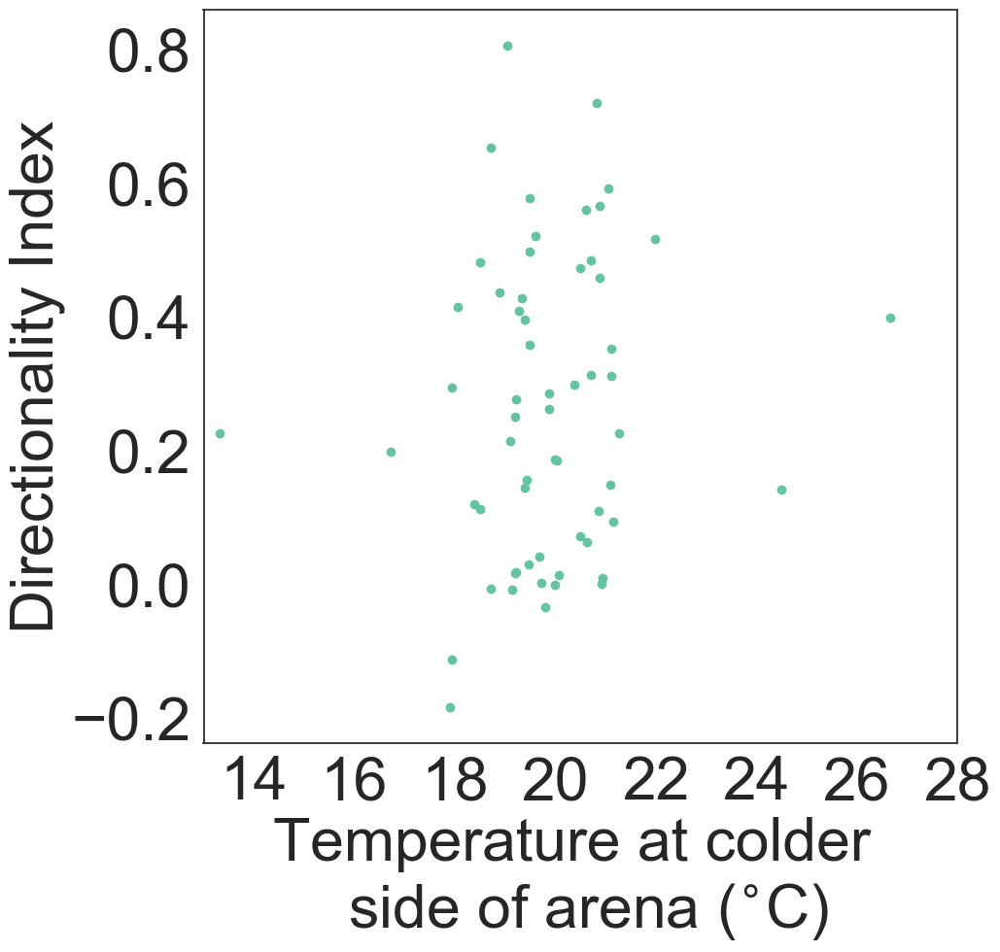

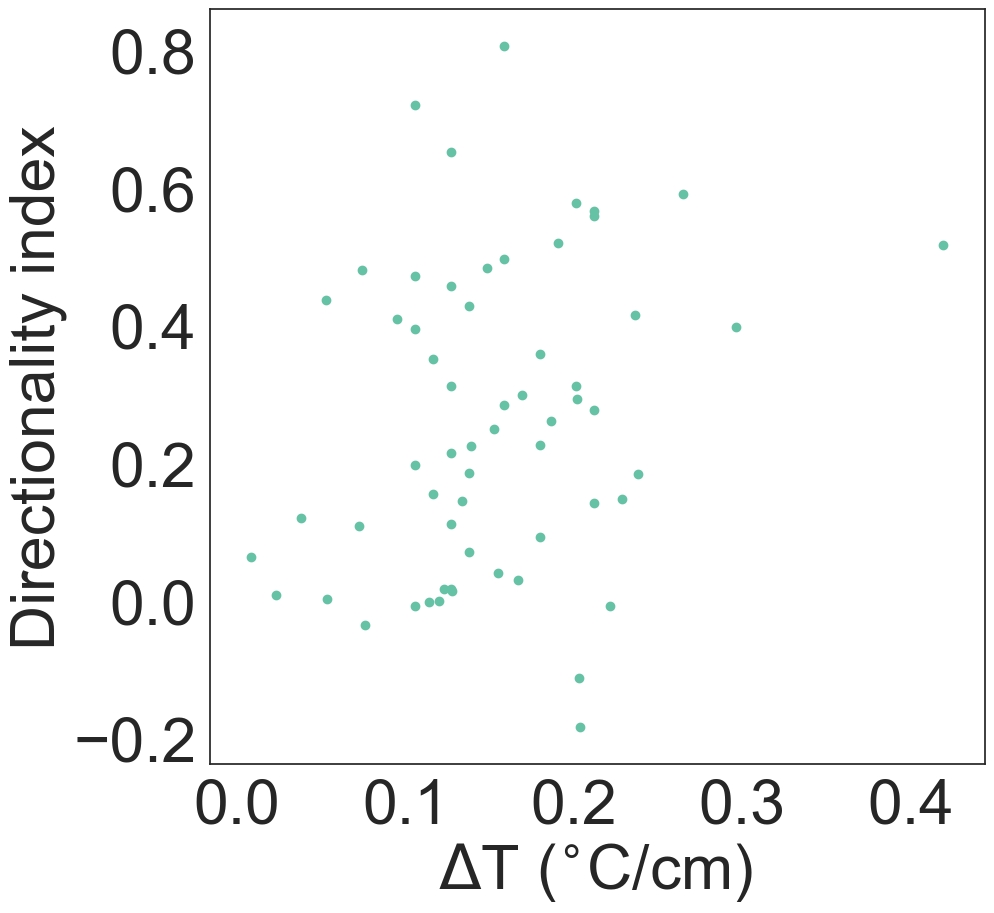

In [94]:
T1_list = {}
T1_list_DT_more_than_p1 = {}
T2_list = {}
Y_MSD_list ={}
X_MSD_list ={}
DeltaT_list = {}
DT_list_more_than_p1 = {}
Vparallel_list = {}
VP_DT_more_than_p1 = {}
DT_T1_in_range = {}
VP_T1_in_range = {}
VP_T2_in_range = {}
T1_in_range = {}
T2_in_range = {}


w=2


for b in bins:
    Vparallel_list[b] = []
    VP_DT_more_than_p1[b] = []
    temp = list(traj_info[b]['T1'].values())
    T1_list[b] = list(traj_info[b]['T1'].values())
    T2_list[b] = list(traj_info[b]['T2'].values())
    Y_MSD_list[b] = list(traj_info[b]['Y_MSD'].values())
    X_MSD_list[b] = list(traj_info[b]['X_MSD'].values())
    DeltaT_list[b] = list(traj_info[b]['DeltaT cm'].values())
    T1_list_DT_more_than_p1[b] = []
    DT_list_more_than_p1[b] = []
    VP_T1_in_range[b] = []
    VP_T2_in_range[b] = []
    T1_in_range[b] = []
    T2_in_range[b] = []
    
    DT_T1_in_range[b] = []
    for key in traj_info[b]['DeltaT cm'].keys():
        if traj_info[b]['T2'][key] <= 50: 
            VP_T1_in_range[b].append(-np.mean(V[b][w][key][:,6])/np.mean(V[b][w][key][:,1]))
            VP_T2_in_range[b].append(-np.mean(V[b][w][key][:,6])/np.mean(V[b][w][key][:,1]))
            T1_in_range[b].append(traj_info[b]['T1'][key])
            T2_in_range[b].append(traj_info[b]['T2'][key])
            DT_T1_in_range[b].append(traj_info[b]['DeltaT cm'][key])




plt.figure(figsize=(10, 10))
for b in bins:
    
    #if b == 'cont':
        #plt.scatter(T1_list[b], Y_MSD_list[b])
        #par = np.polyfit(DelatT[b], Y_MSD_list[b], 1, full=True)
        #print(par)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)])
        #cbar = plt.colorbar()
        #cbar.set_label('CONT: Delta T')
    if b == 'heat':
        plt.scatter(T2_in_range[b], VP_T2_in_range[b], cmap = "coolwarm")
        sns.color_palette("pastel")
        #sns.lineplot(x="T1", y="Vp_T1_plot", data=T1_filtered,err_style="band",legend=False)        
        #plt.scatter(DeltaT_list[b], Y_MSD_list[b],  c =T1_list[b], cmap = 'Reds')
        #par = np.polyfit(X_MSD_list[b], Y_MSD_list[b], 1, full=True)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)],'r')
        #cbar = plt.colorbar(extend='max')
        #cbar.set_label('Delta T/cm (C/cm)')
    #plt.clim(0,0.4)

plt.xticks(fontsize = 45)
plt.yticks(fontsize = 45)
plt.xlim([13,28])
plt.xlabel('Temperature at colder \n side of arena ($^{\circ}$C)',fontsize = 45)
plt.ylabel('Directionality Index',fontsize = 45)
plt.savefig(cwd + '/PaperFigs/Sensitivity/T2 vs Directionality Index all T1.png',bbox_inches='tight')


#DELTA T, V parallel, colored by T1

plt.figure(figsize=(10, 10))
for b in ['heat']:
    #if b == 'cont':
        #plt.scatter(T1_list[b], Y_MSD_list[b])
        #par = np.polyfit(DelatT[b], Y_MSD_list[b], 1, full=True)
        #print(par)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)])
        #cbar = plt.colorbar()
        #cbar.set_label('CONT: Delta T')
    if b == 'heat':
        plt.scatter(DT_T1_in_range[b], VP_T1_in_range[b], cmap = "coolwarm")
        sns.color_palette("pastel")
        #sns.lineplot(x="DT_grouped", y="Vp", data=DT_filtered,err_style="band",legend=False)
        #plt.scatter(DeltaT_list[b], Y_MSD_list[b],  c =T1_list[b], cmap = 'Reds')
        #par = np.polyfit(X_MSD_list[b], Y_MSD_list[b], 1, full=True)
        #plt.plot(np.linspace(0,2,100),[par[0][0]*xx + par[0][1]  for xx in np.linspace(0,2,100)],'r')
        #cbar = plt.colorbar(extend='max')
        #cbar.set_label('T1 (C)')
    plt.clim(13,30)

#plt.xlim([13,30])
#plt.ylim([0.5,2])
plt.xlabel('$\Delta$T ($^{\circ}$C/cm) ', fontsize =45)
plt.ylabel('Directionality index', fontsize = 45)
plt.xticks(fontsize = 45)
plt.yticks(fontsize = 45)
plt.savefig(cwd + '/PaperFigs/Sensitivity/DT vs Directionality index all T13.png',bbox_inches='tight')




In [39]:
#Get the number of elements that satisfy conditions 

        
def getCount(listOfElems, cond = None):
    'Returns the count of elements in list that satisfies the given condition'
    if cond:
        count = sum(cond(elem) for elem in listOfElems)
    else:
        count = len(listOfElems)    
    return count 

temp = []
for key in traj_info['heat']['DeltaT cm'].keys():
    if traj_info['heat']['DeltaT cm'][key] <= 0.1: 
        temp.append(-np.mean(V['heat'][w][key][:,6])/np.mean(V['heat'][w][key][:,1]))
total_trials = len(temp)

print('Total number of trials <= 0.1 C/cm: ' + str(total_trials))
count = getCount(temp, lambda x : x>0.1)
print('fraction trials <= 0.1 C/cm that effectively +ve thermotax: ' + str(count/total_trials))
count = getCount(temp, lambda x : x>0)
print('fration trials <= 0.1 C/cm that +ve thermotax: ' + str(count/total_trials))

temp = []
for key in traj_info['heat']['DeltaT cm'].keys():
    if traj_info['heat']['DeltaT cm'][key] > 0.1: 
        temp.append(-np.mean(V['heat'][w][key][:,6])/np.mean(V['heat'][w][key][:,1]))
total_trials = len(temp)

print('Total number of trials > 0.1 C/cm: ' + str(total_trials))
count = getCount(temp, lambda x : x>0.1)
print('fraction trials > 0.1 C/cm that effectively +ve thermotax: ' + str(count/total_trials))
count = getCount(temp, lambda x : x>0)
print('fration trials > 0.1 C/cm that +ve thermotax: ' + str(count/total_trials))


Total number of trials <= 0.1 C/cm: 9
fraction trials <= 0.1 C/cm that effectively +ve thermotax: 0.5555555555555556
fration trials <= 0.1 C/cm that +ve thermotax: 0.8888888888888888
Total number of trials > 0.1 C/cm: 51
fraction trials > 0.1 C/cm that effectively +ve thermotax: 0.7450980392156863
fration trials > 0.1 C/cm that +ve thermotax: 0.9019607843137255


## Size effects
+ve = towards heat 


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

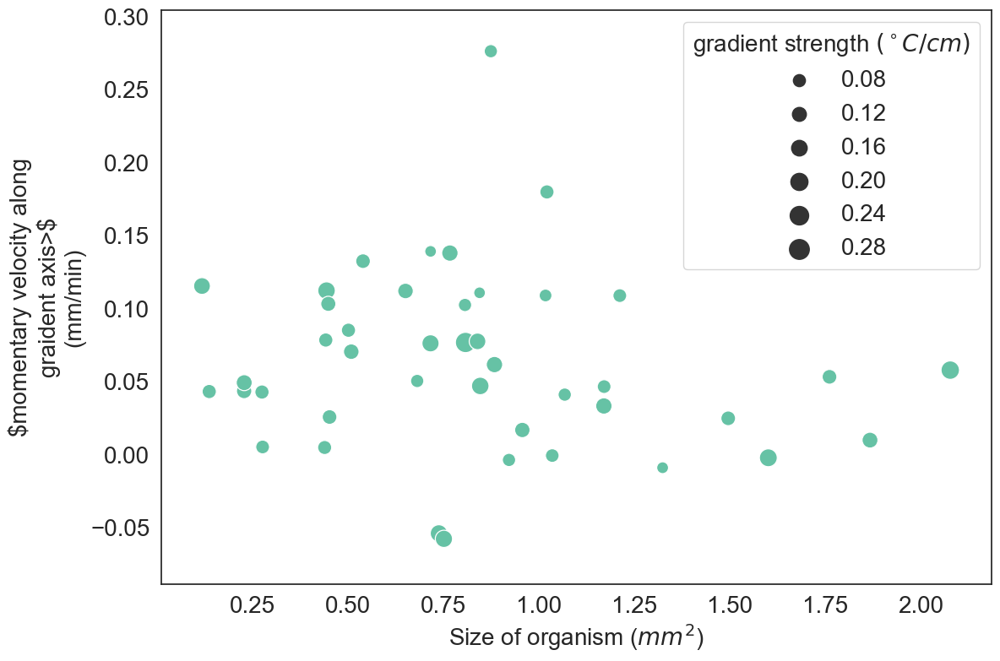

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

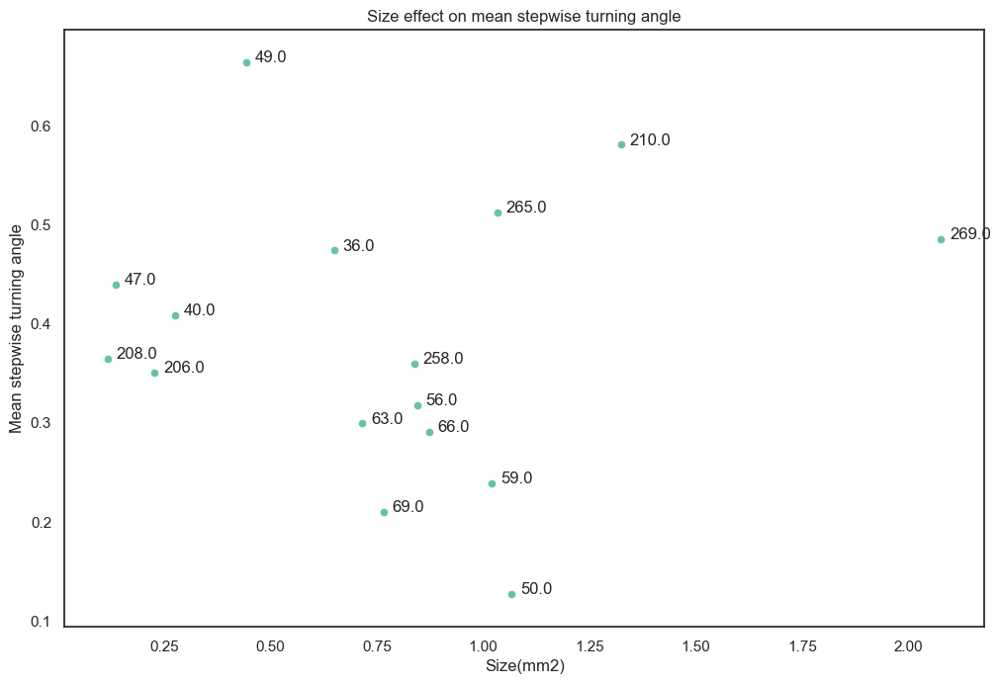

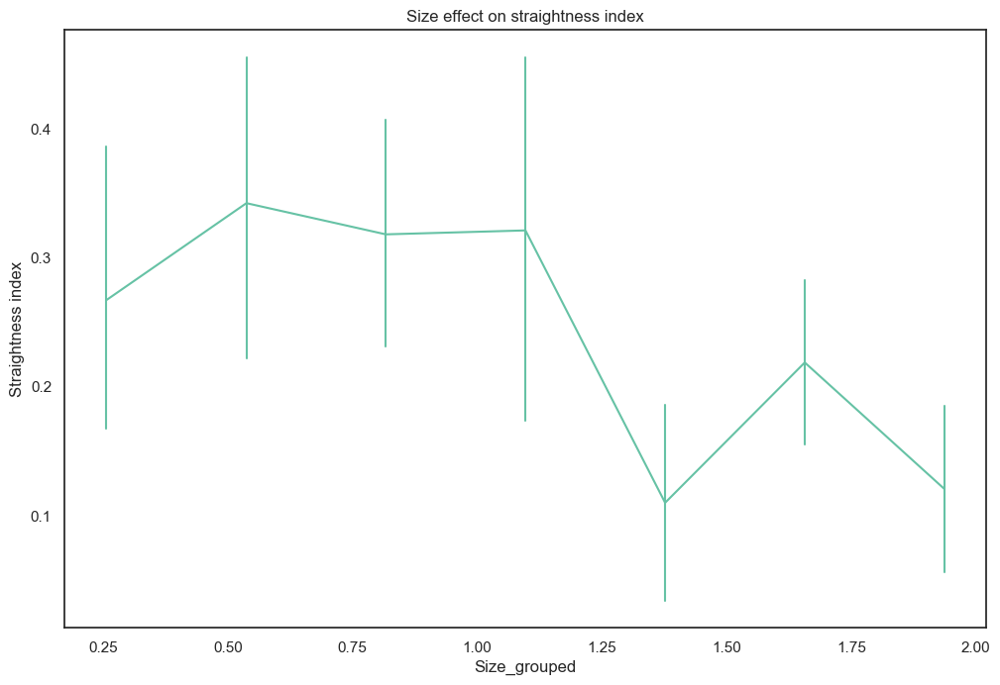

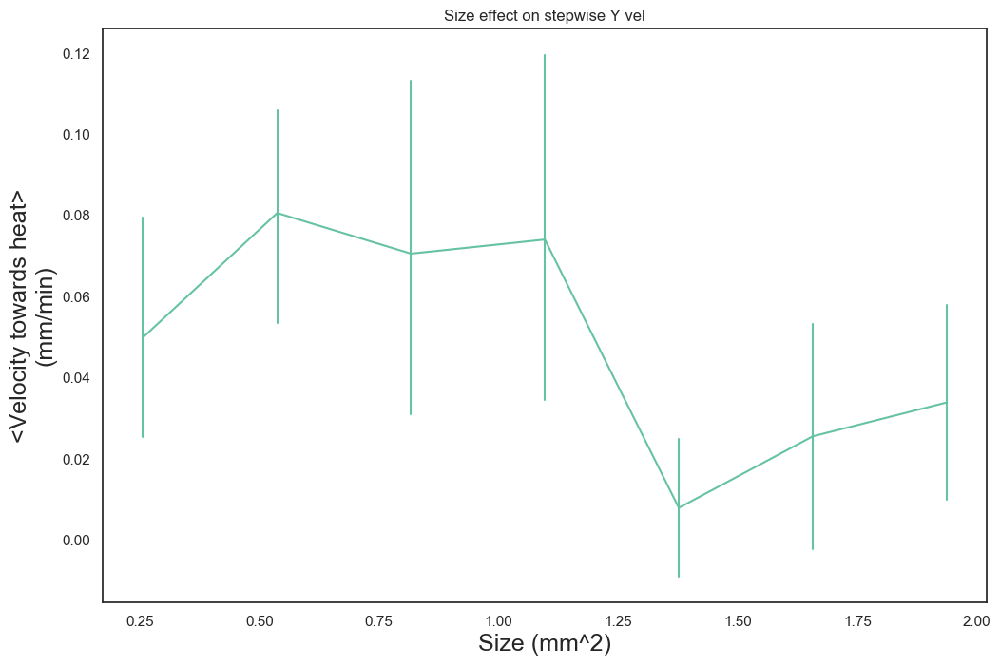

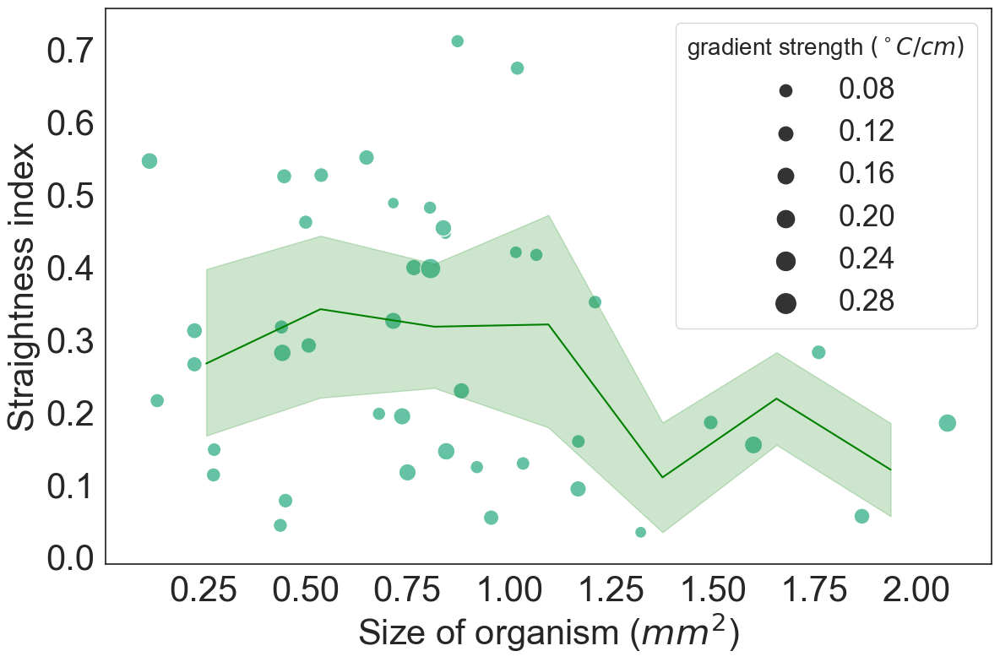

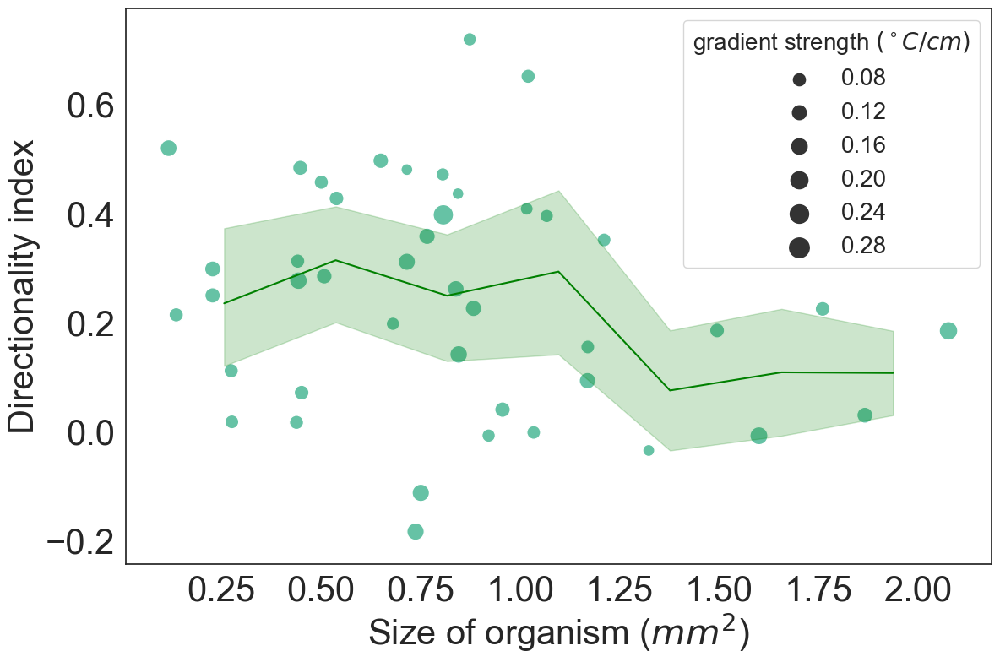

In [93]:
# FILTERED FOR DELTA T

sizelist['Mean stepwise velocity'] = ''
sizelist['Directionality index'] = ''
sizelist['Straightness index'] = ''
sizelist['Size_grouped'] = ''
sizelist['Turning Angle'] = ''
sizelist['v ballistic'] = ''
sizelist['Y MSD'] = ''
sizelist['Thermotaxis index'] = ''
sizelist['Mean stepwise speed'] = ''
w=2
for i in range(len((sizelist['Trial']))):
    key = str(sizelist['Trial'][i])
    sizelist['Turning Angle'][i] = np.mean(V['heat'][w][key][:,4])
    sizelist['Mean stepwise velocity'][i] = -np.mean(V['heat'][w][key][:,6])
    sizelist['Mean stepwise speed'][i] = np.mean(V['heat'][w][key][:,1])
    sizelist['Thermotaxis index'][i] = -np.mean(V['heat'][w][key][:,6]) / np.mean(V['heat'][w][key][:,1])
    sizelist['Directionality index'][i] = np.sum(-(V['heat'][w][key][:,11]))/np.sum(V['heat'][w][key][:,0])
    l = len(traj_binned['heat'][key][:,0])-1
    sizelist['Straightness index'][i] = ((traj_binned['heat'][key][l,0]-traj_binned['heat'][key][0,0])**2 +
                                      (traj_binned['heat'][key][l,1]-traj_binned['heat'][key][0,1])**2)**0.5 / np.sum(V['heat'][w][key][:,0])

           
    temp = rmsd_y_last200[rmsd_y_last200['Trial'] == int(key)]
    sizelist['v ballistic'][i] = temp['v ballistic']
    sizelist['Y MSD'][i] = float(temp['Y_MSD'])
    

sizelist_filtered = sizelist

temp = pd.cut(sizelist_filtered['Size(mm2)'],7)
mid = [(a.left + a.right)/2 for a in temp]
sizelist_filtered['Size_grouped'] = mid
sizelist_filtered['Size_grouped'] = sizelist_filtered['Size_grouped'].astype(float)
sizelist_filtered['Mean stepwise velocity'] = sizelist_filtered['Mean stepwise velocity'].astype(float)
sizelist_filtered["Directionality index"] = sizelist_filtered["Directionality index"].astype(float)
sizelist_filtered["Straightness index"] = sizelist_filtered["Straightness index"].astype(float)
sizelist_filtered['Turning Angle'] = sizelist_filtered['Turning Angle'].astype(float)
sizelist_filtered['v ballistic'] = sizelist_filtered['v ballistic'].astype(float)
sizelist_filtered['Thermotaxis index'] = sizelist_filtered['Thermotaxis index'].astype(float)
sizelist_filtered['Mean stepwise speed'] = sizelist_filtered['Mean stepwise speed'].astype(float)

def movingaverage(interval, window_size):
    window= np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')



plt.figure()
norm = plt.Normalize(sizelist_filtered['DeltaT cm'].min(), sizelist_filtered['DeltaT cm'].max())
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
ax = sns.scatterplot(x="Size(mm2)", y="Mean stepwise velocity", data=sizelist_filtered, size =sizelist_filtered['DeltaT cm'], sizes=(100,300), cmap = "coolwarm", legend=True)
plt.ylabel('$momentary velocity along\ngraident axis>$' +'\n'+'(mm/min)',fontsize = 20)
plt.xlabel ('Size of organism ($mm^2$)',fontsize = 20)
title = 'Size effect on Mean stepwise velocity'

plt.xticks (fontsize = 20)
plt.yticks (fontsize = 20)
legend = plt.legend(title = 'gradient strength $(^\circ C / cm)$', fontsize = 20)
legend.get_title().set_fontsize('20') #legend 'Title' fontsize
plt.tight_layout()

def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.02, point['y'], str(point['val']))
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')


plt.figure()
sns.scatterplot(x="Size(mm2)", y="Turning Angle", data=sizelist_filtered,legend=False)
plt.title('Size effect on mean stepwise turning angle')
plt.ylabel('Mean stepwise turning angle')
title = 'Size effect on Mean stepwise turning angle'
label_point(sizelist_filtered["Size(mm2)"], sizelist_filtered["Turning Angle"], sizelist_filtered["Trial"], plt.gca())  
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')

plt.figure()
sns.lineplot(x="Size_grouped", y="Straightness index", data=sizelist_filtered,err_style="bars",legend=False)
plt.title('Size effect on straightness index')
title = 'Size effect on straightness index'
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')

plt.figure()
sns.lineplot(x="Size_grouped", y="Mean stepwise velocity", data=sizelist_filtered,err_style="bars",legend=False)
plt.title('Size effect on stepwise Y vel')
title = 'Size effect on stepwise Y vel with numbers'
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')
plt.ylabel('<Velocity towards heat>' +'\n'+'(mm/min)',fontsize = 18)
plt.xlabel('Size (mm^2)', fontsize = 18)


plt.figure()
norm = plt.Normalize(sizelist_filtered['DeltaT cm'].min(), sizelist_filtered['DeltaT cm'].max())
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
ax = sns.scatterplot(x="Size(mm2)", y="Straightness index", data=sizelist_filtered, size =sizelist_filtered['DeltaT cm'], sizes=(100,300), cmap = "coolwarm", legend=True)
plt.ylabel('Straightness index',fontsize = 30)
plt.xlabel ('Size of organism ($mm^2$)',fontsize = 30)
plt.xticks (fontsize = 30)
plt.yticks (fontsize = 30)
legend = plt.legend(title = 'gradient strength $(^\circ C / cm)$', fontsize = 25)
legend.get_title().set_fontsize('20') #legend 'Title' fontsize
plt.tight_layout()
sns.lineplot(x="Size_grouped", y="Straightness index", data=sizelist_filtered,err_style="band",color = 'green',legend=False)
title = 'Size effect on Straightness Index'
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')

plt.figure()
norm = plt.Normalize(sizelist_filtered['DeltaT cm'].min(), sizelist_filtered['DeltaT cm'].max())
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
ax = sns.scatterplot(x="Size(mm2)", y="Directionality index", data=sizelist_filtered, size =sizelist_filtered['DeltaT cm'], sizes=(100,300), cmap = "coolwarm", legend=True)
plt.ylabel('Directionality index',fontsize = 30)
plt.xlabel ('Size of organism ($mm^2$)',fontsize = 30)
plt.xticks (fontsize = 30)
plt.yticks (fontsize = 30)
legend = plt.legend(title = 'gradient strength $(^\circ C / cm)$', fontsize = 20)
legend.get_title().set_fontsize('20') #legend 'Title' fontsize
plt.tight_layout()
sns.lineplot(x="Size_grouped", y="Directionality index", data=sizelist_filtered,err_style="band",color = 'green',legend=False)
title = 'Size effect on Directionality Index'
plt.savefig(cwd+'/PaperFigs/Sensitivity/'+title + '.png')




In [73]:
len(sizelist_filtered['DeltaT cm'])

43

## Do regression on the Sizelist 

In [74]:
#removing irrelevant columns
sizelist_filtered_regression = sizelist_filtered.copy()
sizelist_filtered_regression.drop(['Date','Cond', 'Size scope', 'Trial', 'Scope config', 'Size (px)', 'DeltaT', 
                                   'Size(um2)','Estimate for number of cells', 'Unnamed: 12',
                                  'v ballistic', 'Turning Angle', 'Thermotaxis index', 
                                   'Mean stepwise velocity', 'Y MSD', 'Straightness index', 'Size_grouped'],axis=1,inplace = True)
from statsmodels.regression import linear_model
X = sizelist_filtered_regression.drop('Directionality index', axis=1)
y = sizelist_filtered_regression['Directionality index']
model = linear_model.OLS(y, X).fit()

sizelist_filtered_regression
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                 
=========================================================================================
Dep. Variable:     Directionality index   R-squared (uncentered):                   0.611
Model:                              OLS   Adj. R-squared (uncentered):              0.582
Method:                   Least Squares   F-statistic:                              20.98
Date:                  Sun, 07 May 2023   Prob (F-statistic):                    2.52e-08
Time:                          16:57:12   Log-Likelihood:                          8.2321
No. Observations:                    43   AIC:                                     -10.46
Df Residuals:                        40   BIC:                                     -5.181
Df Model:                             3                                                  
Covariance Type:              nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
T1             0.0225      0.007      3.454      0.001       0.009       0.036
DeltaT cm     -1.1257      0.809     -1.392      0.172      -2.760       0.508
Size(mm2)     -0.0672      0.068     -0.981      0.332      -0.206       0.071
==============================================================================
Omnibus:                        0.307   Durbin-Watson:                   1.489
Prob(Omnibus):                  0.858   Jarque-Bera (JB):                0.478
Skew:                          -0.146   Prob(JB):                        0.787
Kurtosis:                       2.574   Cond. No.                         536.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### autocorrelation 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have 

/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have 

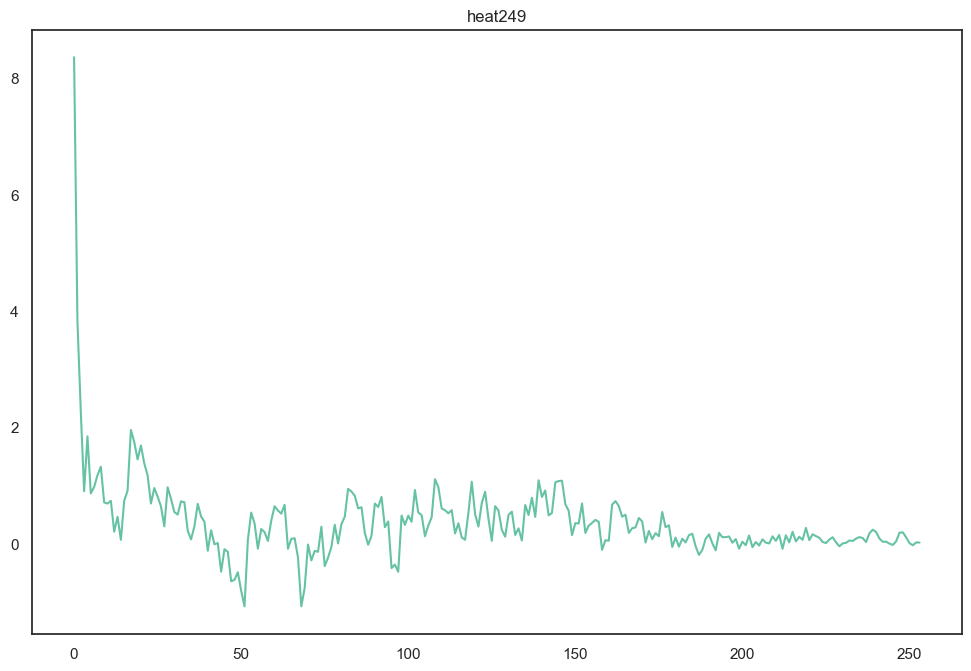

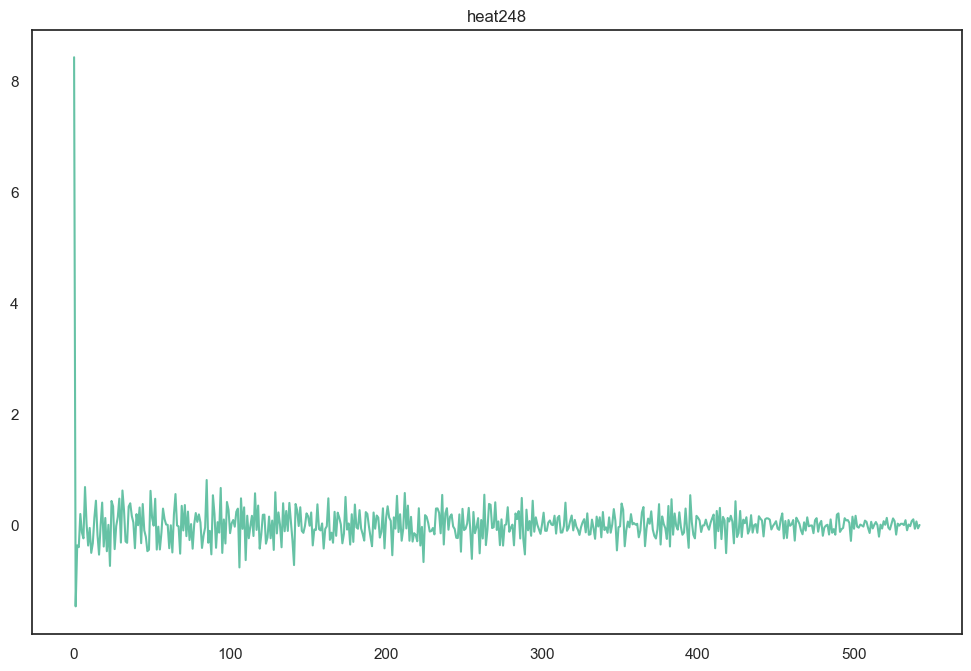

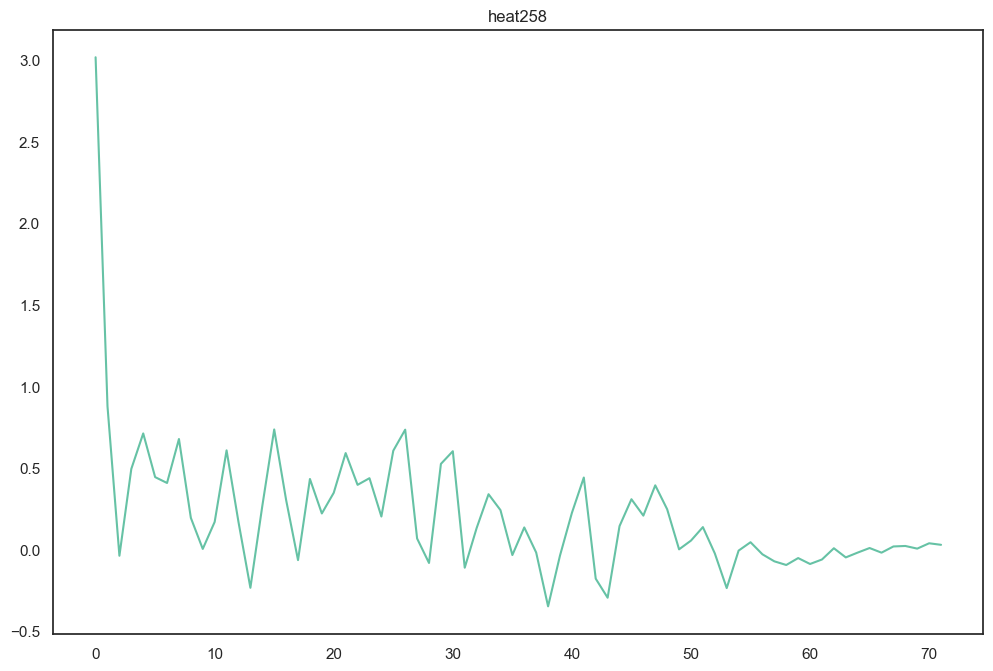

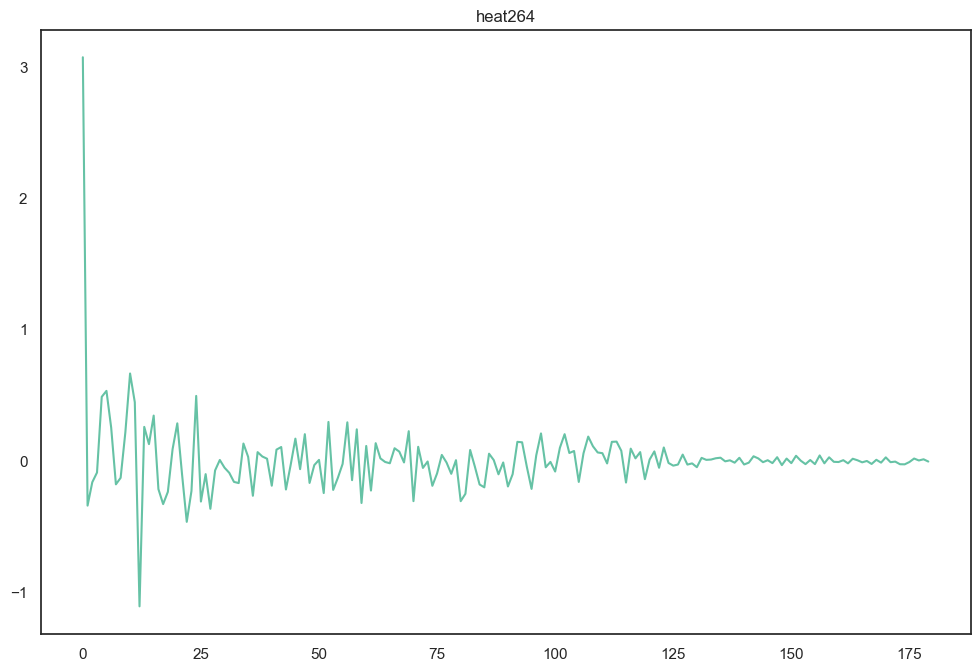

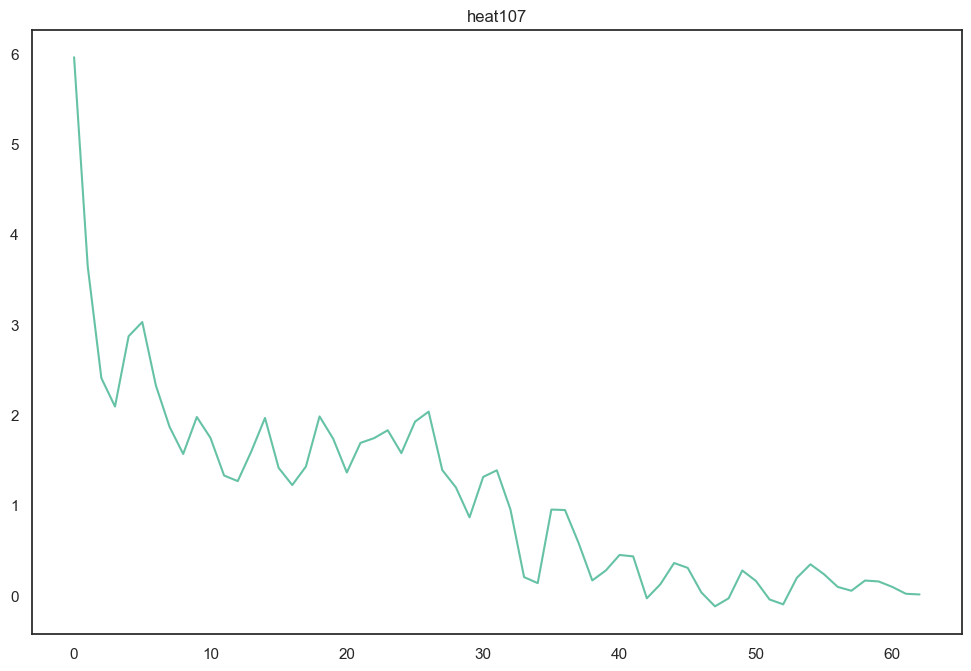

...

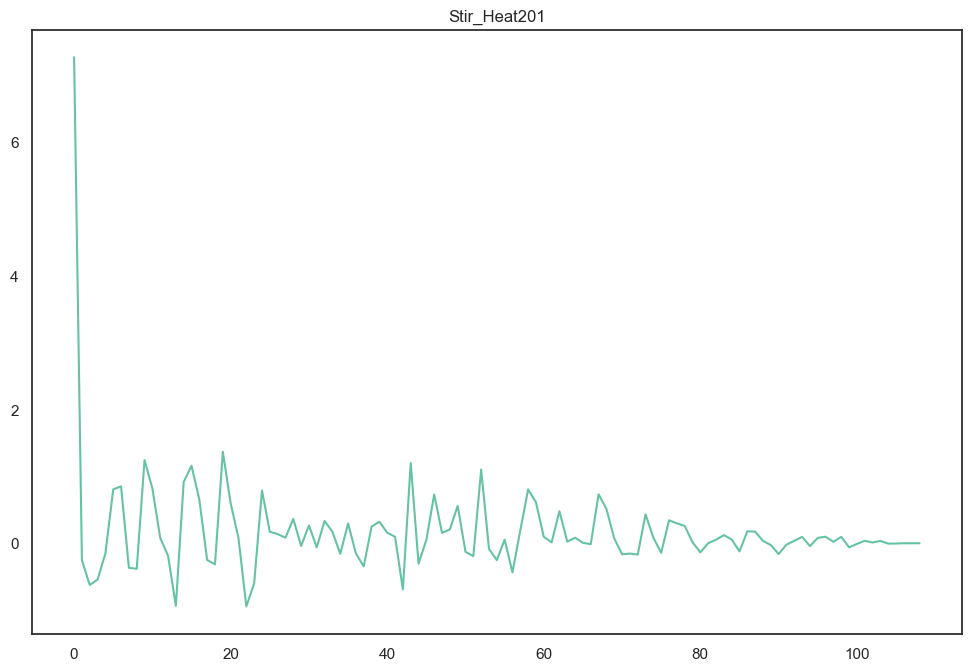

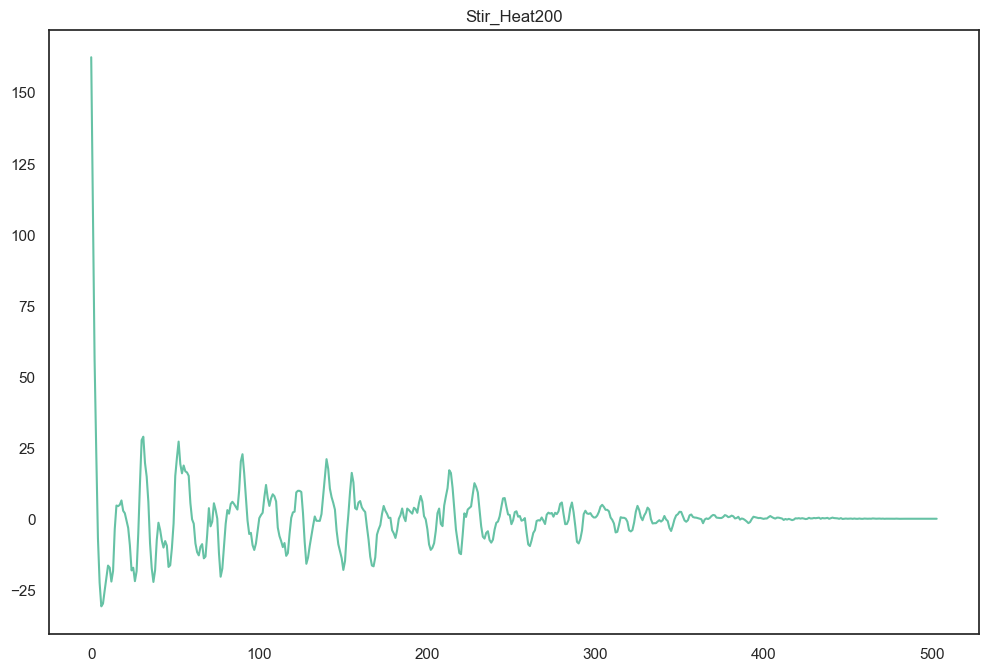

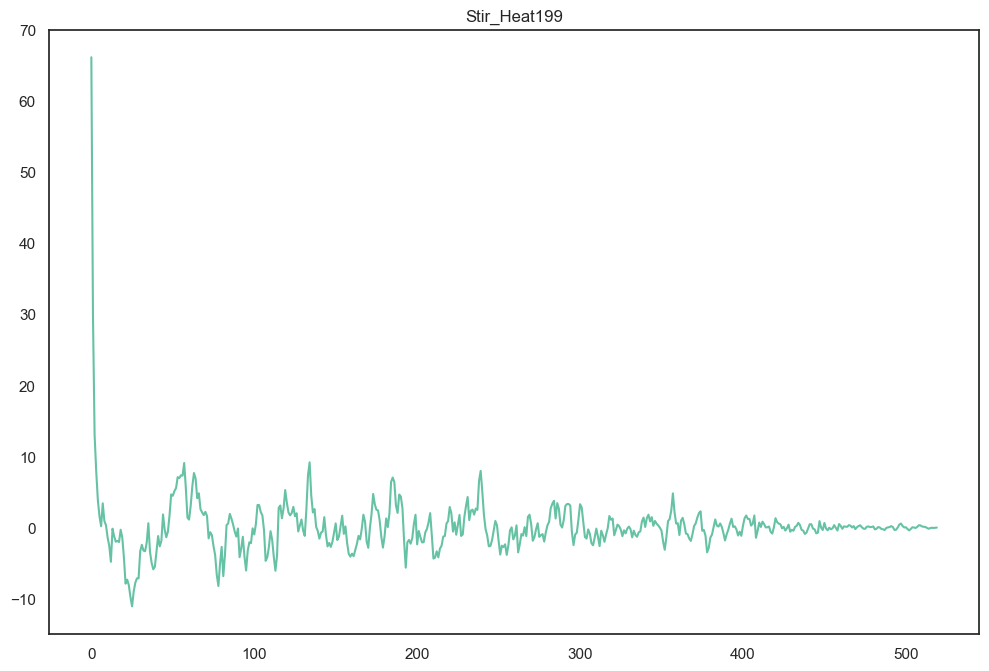

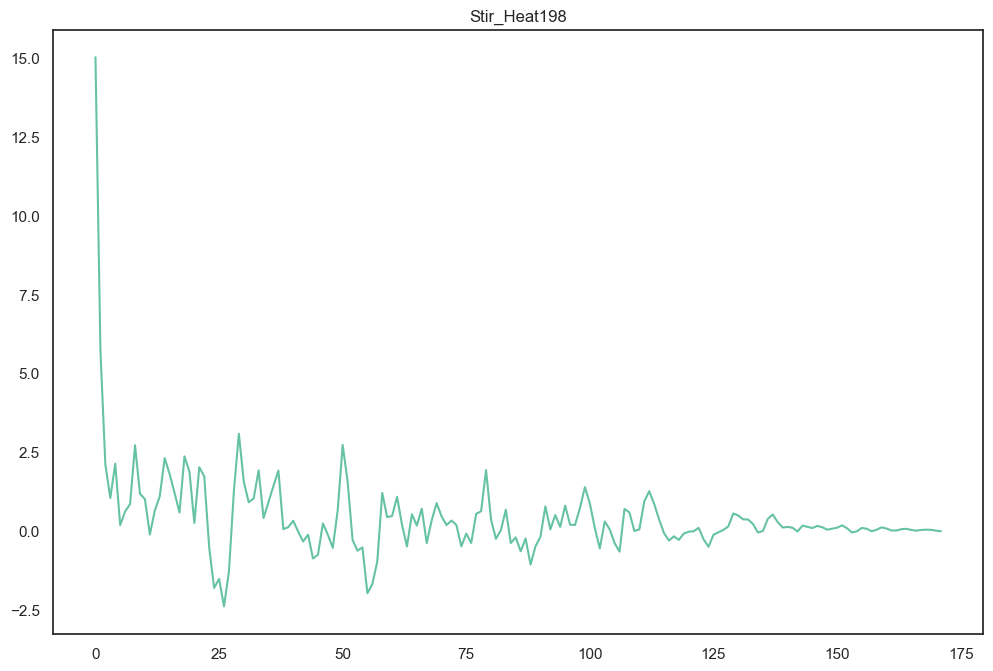

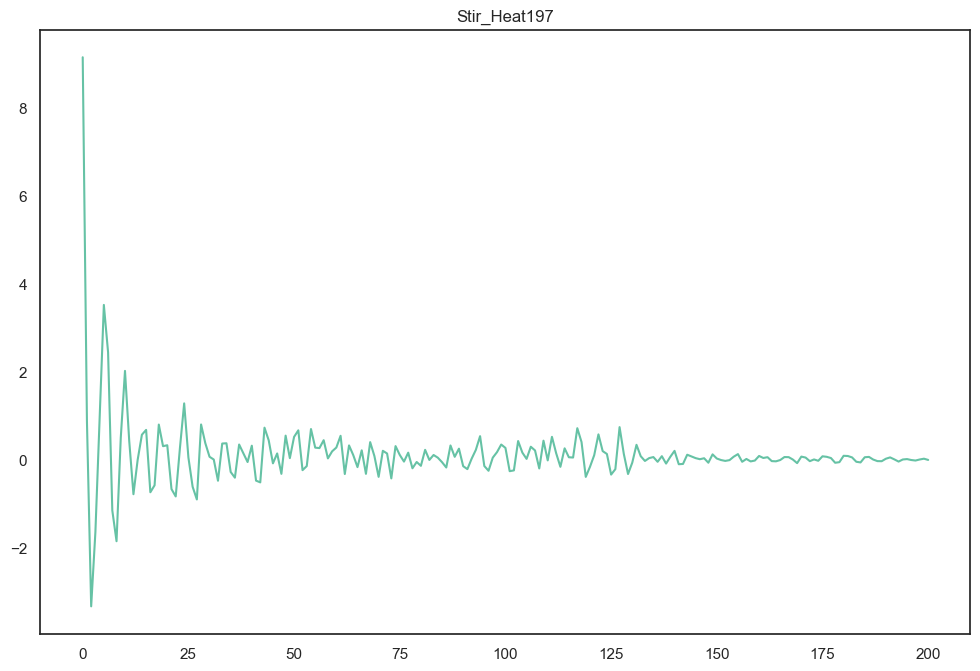

In [95]:
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    return result[int(result.size/2):]


for b in bins:  
    for key in traj_binned_raw[b].keys(): 
        temp = V[b][4][key][:,6]
        autocorr_result = autocorr(temp)
        plt.figure()
        plt.plot(autocorr_result)
        plt.title(b + key)
        

### Histograms for step size and power law fit

heat , vx pars:
[ 0.37013839 -0.71929334]
cov
[[0.00595804 0.00480529]
 [0.00480529 0.00451252]]
stdevs
[0.07718832 0.06717527]
heat , vy pars:
[ 0.36522495 -0.68247801]
cov
[[0.00398819 0.00328575]
 [0.00328575 0.00329012]]
stdevs
[0.06315211 0.05735958]
cont , vx pars:
[ 0.3816659 -0.720671 ]
cov
[[0.008375   0.0065509 ]
 [0.0065509  0.00594882]]
stdevs
[0.09151505 0.0771286 ]
cont , vy pars:
[ 0.40211243 -0.69428021]
cov
[[0.00998426 0.00747754]
 [0.00747754 0.00657042]]
stdevs
[0.09992128 0.08105813]
Stir_Heat , vx pars:
[ 0.24600745 -0.86279678]
cov
[[0.00031392 0.00036788]
 [0.00036788 0.0004723 ]]
stdevs
[0.01771777 0.02173245]


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: divide by zero encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: divide by zero encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: divide by zero encountered in double_scalars


Stir_Heat , vy pars:
[ 0.28681865 -0.79385166]
cov
[[0.0005006  0.00051118]
 [0.00051118 0.00058377]]
stdevs
[0.02237412 0.0241613 ]


<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>

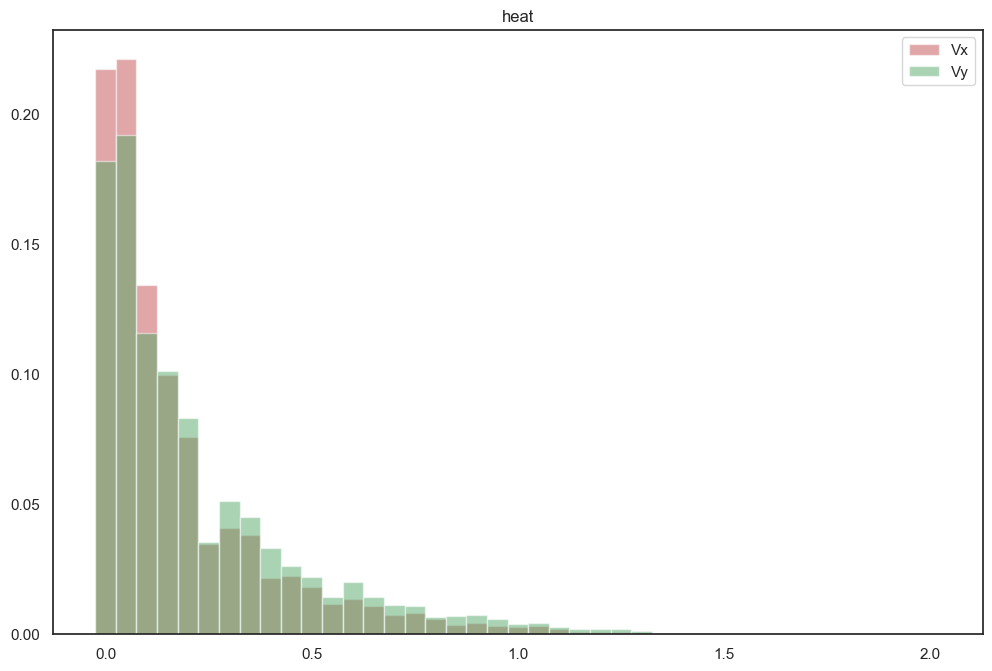

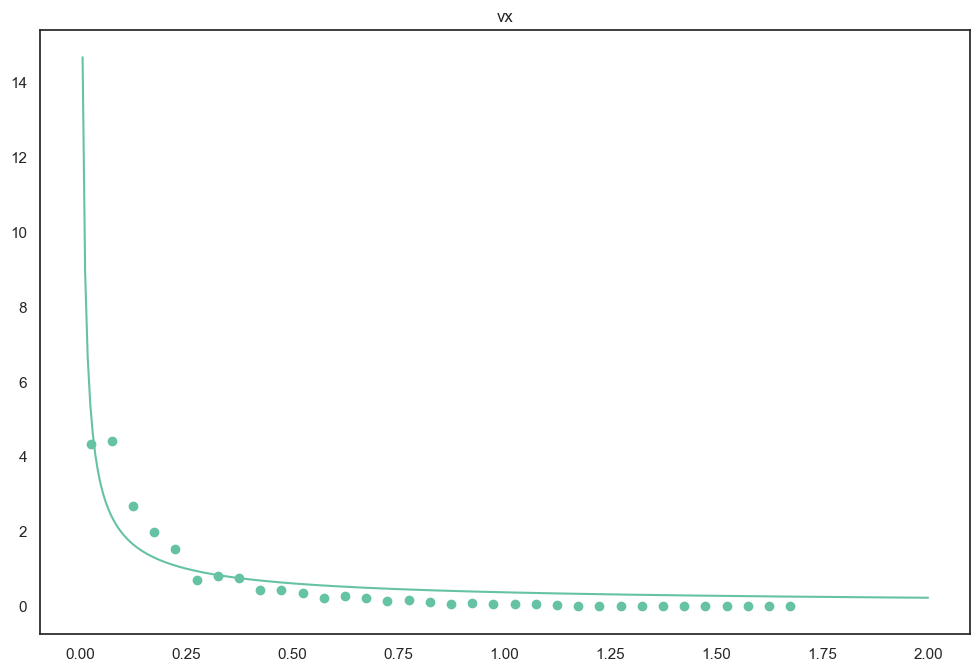

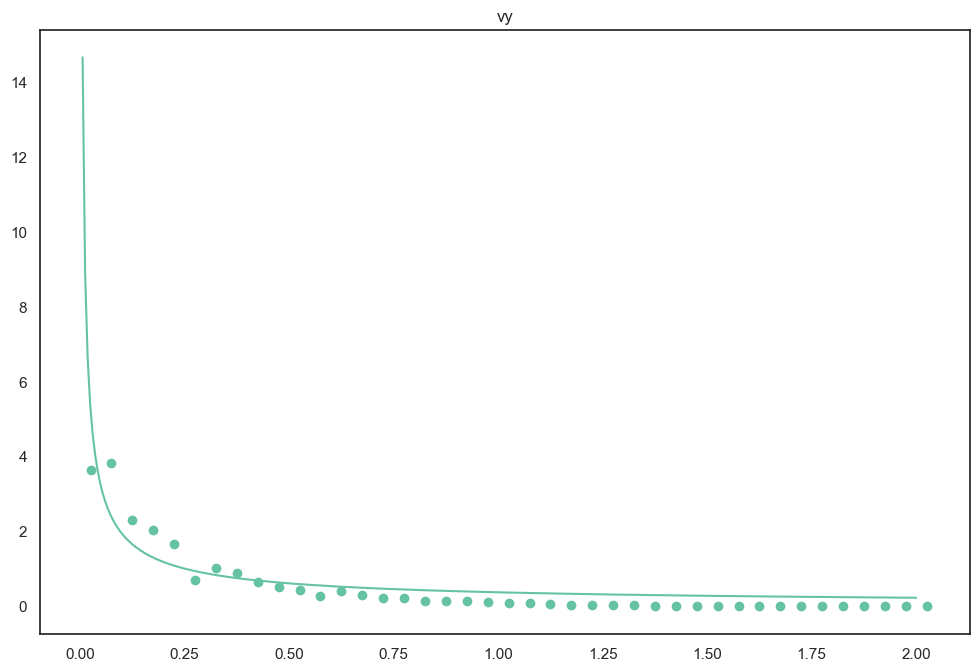

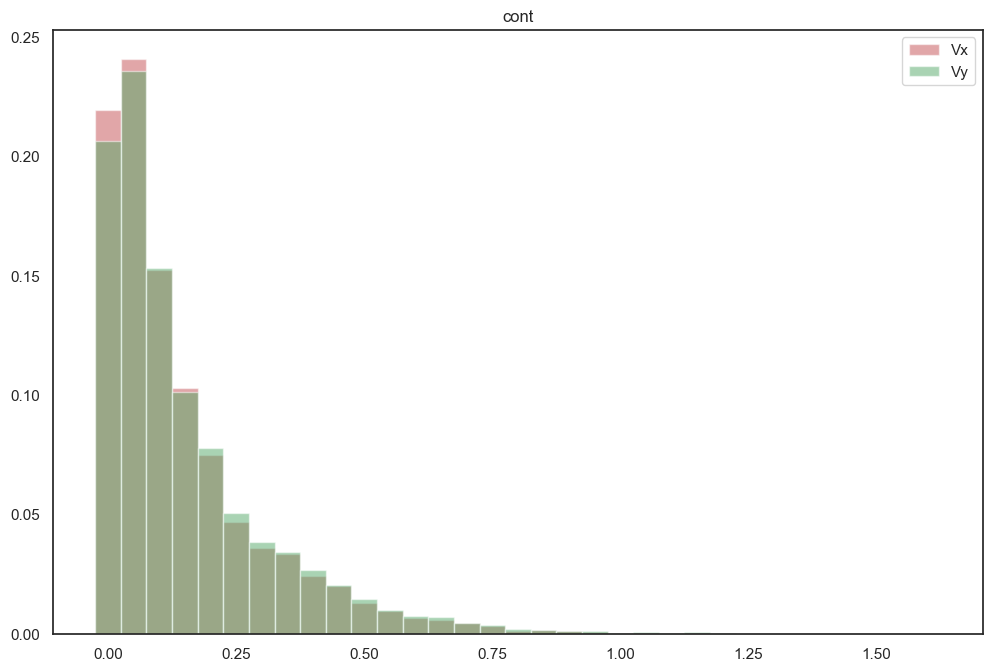

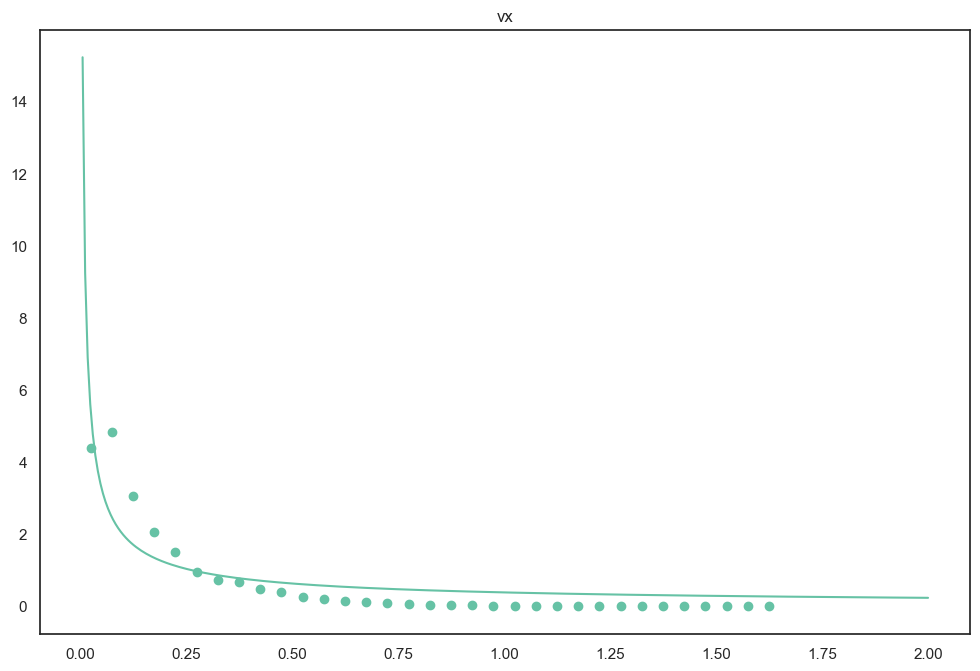

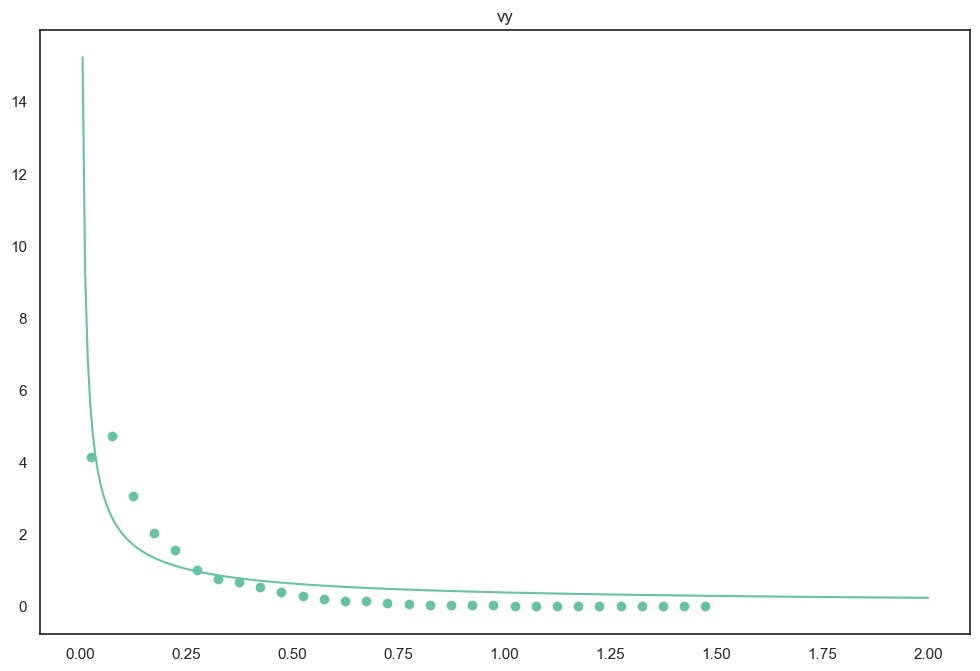

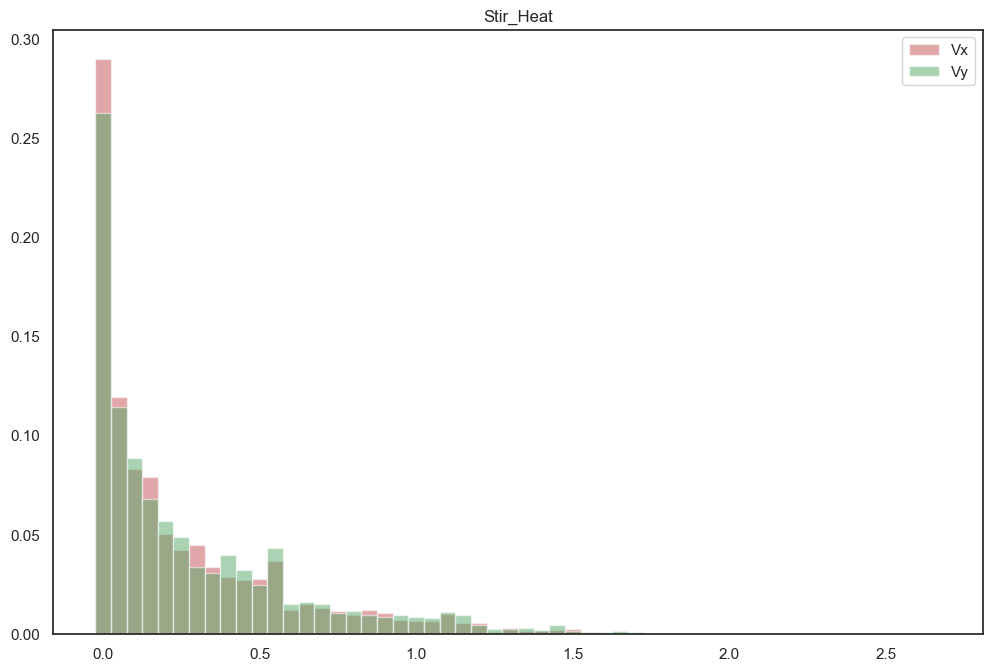

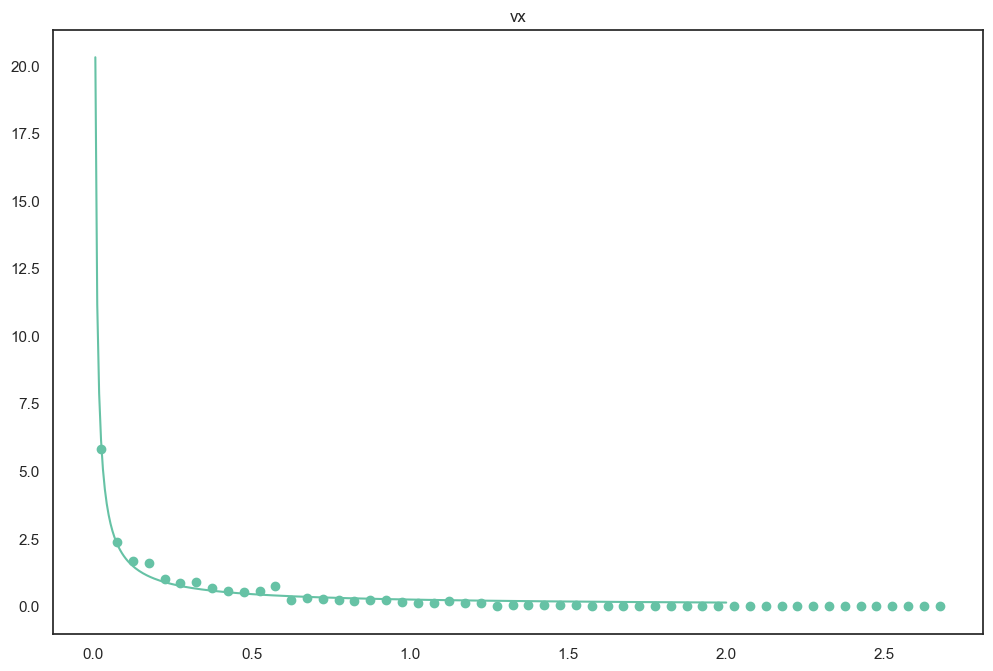

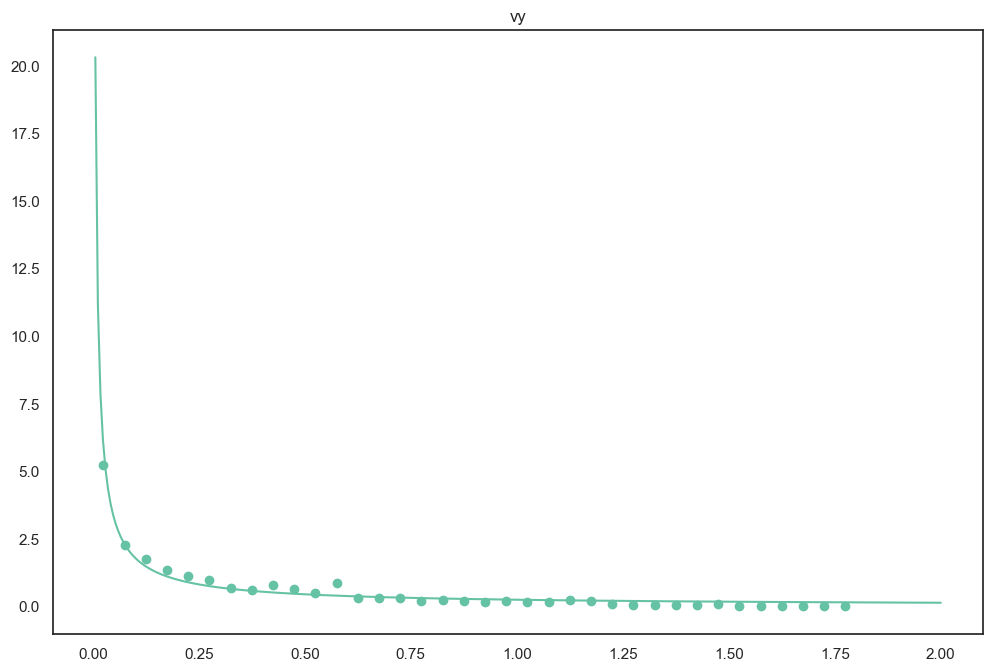

In [96]:
# Import curve fitting package from scipy
from scipy.optimize import curve_fit
# Function to calculate the power-law with constants a and b
def power_law(x, a, b):
    return a*np.power(x, b)

for b in bins: 
    vy = []
    vx = []
    angle_heat = []
    angle_cont = []
    for key in traj_binned_raw[b].keys(): 
        vy.append( abs(V[b][2][key][:,6]))
        vx.append( abs(V[b][2][key][:,7]))
        angle_heat.append(V[b][2][key][:,4])
        angle_cont.append(V[b][2][key][:,4])
    vy = np.concatenate(vy).ravel()
    vx = np.concatenate(vx).ravel()

    plt.figure()
    hx, edge_x = np.histogram(vx,bins=np.arange(min(vx), max(vx), 0.05), density=True)
    binwidth_x = edge_x[1] - edge_x[0]
    hy, edge_y = np.histogram(vy,bins=np.arange(min(vy), max(vy), 0.05), density=True)
    binwidth_y = edge_y[1] - edge_y[0]
    plt.bar(edge_x[:-1], hx*binwidth_x, binwidth_x, alpha = 0.5, color = 'r', label = 'Vx')
    plt.bar(edge_y[:-1], hy*binwidth_y, binwidth_y, alpha = 0.5, color = 'g', label = 'Vy')
    plt.title(b)
    plt.legend()
    
    x1 = []
    for i in range(1,(len(edge_x))):
        x1.append((edge_x[i] + edge_x[i-1])/2)
    x2 = []
    for i in range(1,(len(edge_y))):
        x2.append((edge_y[i] + edge_y[i-1])/2)
    plt.figure()
    # Fit the  power-law data
    pars, cov = curve_fit(f=power_law, xdata=x1, ydata=hx, p0=[0, 0], bounds=(-np.inf, np.inf))
    # Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
    stdevs = np.sqrt(np.diag(cov))
    # Calculate the residuals
    res = hx - power_law(x1, *pars)
    print(b, ', vx pars:')
    print(pars)
    print('cov')
    print(cov)
    print('stdevs')
    print(stdevs)
    x_pars = np.linspace(-4,2,1000)
    y_pars = np.zeros(x_pars.shape)
    for i in range(len(x_pars)):
        y_pars[i] = pars[0] * x_pars[i] ** pars[1]

    plt.scatter(x1,hx)
    plt.plot(x_pars, y_pars)
    plt.title('vx')
    
    plt.figure()
    # Fit the power-law data
    pars, cov = curve_fit(f=power_law, xdata=x2, ydata=hy, p0=[0, 0], bounds=(-np.inf, np.inf))
    # Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
    stdevs = np.sqrt(np.diag(cov))
    # Calculate the residuals
    res = hy - power_law(x2, *pars)
    
    print(b, ', vy pars:')
    print(pars)
    print('cov')
    print(cov)
    print('stdevs')
    print(stdevs)    
    
    plt.scatter(x2,hy)
    plt.plot(x_pars, y_pars)
    plt.title('vy')
        
plt.figure

        

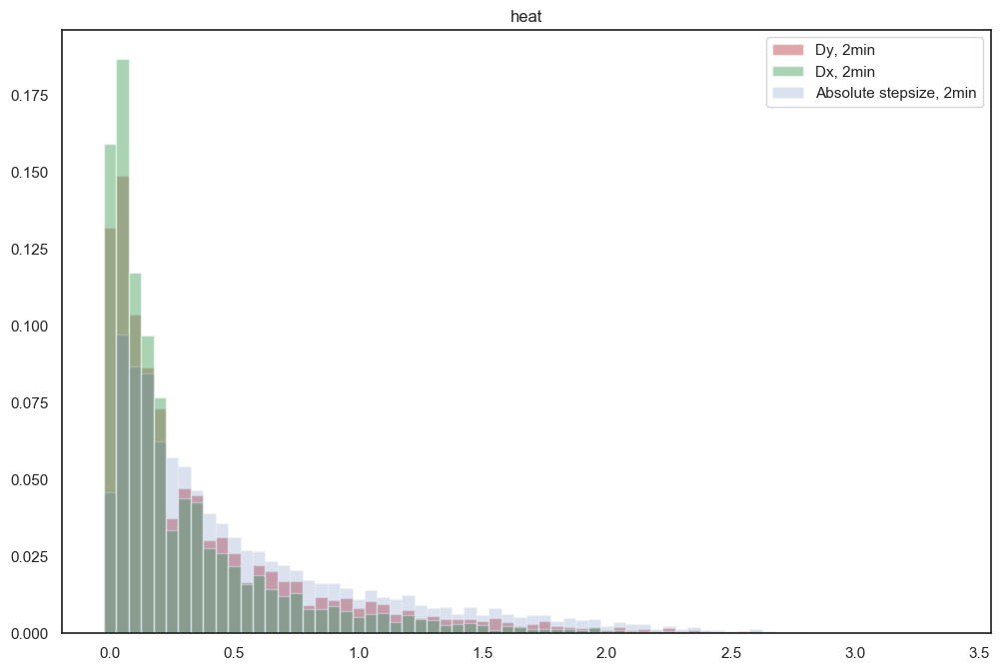

In [102]:
#POOLED  Histograms for step size (abs)
for b in ['heat']:  
    v1 = []
    v2 = []
    v3 = []
    for key in traj_binned_raw[b].keys(): 
        v1 = v1 + list(abs(V[b][4][key][:,11][:]))
        v2 = v2 + list(abs(V[b][4][key][:,12][:]))
        v3 = v3 + list((abs(V[b][4][key][:,12][:])**2 + abs(V[b][4][key][:,11][:])**2)**0.5 )
    plt.figure()
    h3, edge_3 = np.histogram(v3,bins=np.arange(min(v3), max(v3), 0.05), density=True)
    binwidth_3 = edge_3[1] - edge_3[0]
    h2, edge_2 = np.histogram(v2,bins=np.arange(min(v2), max(v2), 0.05), density=True)
    binwidth_2 = edge_x[1] - edge_x[0]
    h1, edge_1 = np.histogram(v1,bins=np.arange(min(v1), max(v1), 0.05), density=True)
    binwidth_1 = edge_y[1] - edge_y[0]
    plt.bar(edge_1[:-1], h1*binwidth_1, binwidth_1, alpha = 0.5, color = 'r', label = 'Dy, 2min')
    plt.bar(edge_2[:-1], h2*binwidth_2, binwidth_2, alpha = 0.5, color = 'g', label = 'Dx, 2min')
    plt.bar(edge_3[:-1], h3*binwidth_3, binwidth_3, alpha = 0.2, color = 'b', label = 'Absolute stepsize, 2min')
    plt.title(b)
    plt.legend()
    
x1 = []
for i in range(1,(len(edge_1))):
    x1.append((edge_1[i] + edge_1[i-1])/2)
x2 = []
for i in range(1,(len(edge_2))):
    x2.append((edge_2[i] + edge_2[i-1])/2)
x3 = []
for i in range(1,(len(edge_3))):
    x3.append((edge_3[i] + edge_3[i-1])/2)


### Power law fit

pars:
[ 0.33211759 -0.48981707]
cov
[[0.00153059 0.0013926 ]
 [0.0013926  0.00243889]]
stdevs
[0.03912279 0.04938513]


/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars
/Users/ilikecookiee/opt/anaconda3/envs/prakashlab/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in double_scalars


Text(0.5, 1.0, 'Heat, 2min, Abs step size')

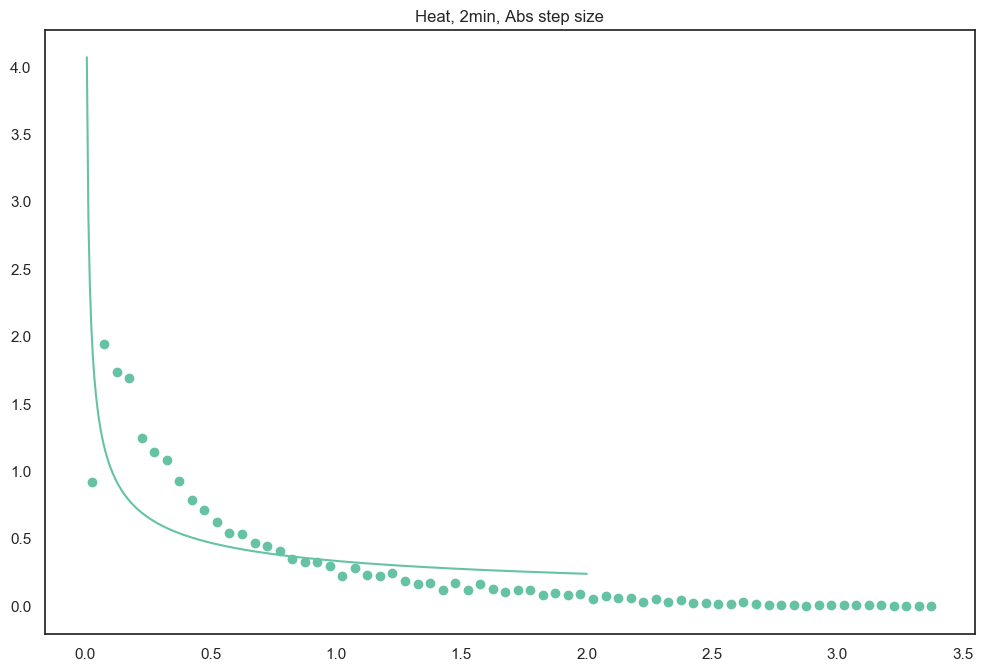

In [103]:
# Import curve fitting package from scipy
from scipy.optimize import curve_fit
# Function to calculate the power-law with constants a and b
def power_law(x, a, b):
    return a*np.power(x, b)
# Fit the dummy power-law data
pars, cov = curve_fit(f=power_law, xdata=x3, ydata=h3, p0=[0, 0], bounds=(-np.inf, np.inf))
# Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
stdevs = np.sqrt(np.diag(cov))
# Calculate the residuals
res = h1 - power_law(x3, *pars)
print('pars:')
print(pars)
print('cov')
print(cov)
print('stdevs')
print(stdevs)

x_pars = np.linspace(-4,2,1000)
y_pars = np.zeros(x_pars.shape)
for i in range(len(x_pars)):
    y_pars[i] = pars[0] * x_pars[i] ** pars[1]

plt.scatter(x3,h3)
plt.plot(x_pars, y_pars)
plt.title('Heat, 2min, Abs step size')


### Windrose velocity plot

In [104]:
#COLUMNS: Abs displacement, velocity, persistence velocity, turning velocity, angle, angle1, 
#y dir velocity, x dir velocity, y dir acceleration, x dir acceleration, WHETHER TO REMOVE

import plotly.graph_objects as go
import math
import plotly.express as px

def round_up(n, decimals=0):
    multiplier = 10 ** decimals
    return math.ceil(n * multiplier) / multiplier

def find_hist_info(b, V,color_parameter, angle_parameter, window, num_bars, ub=1, lb=0):
    df = pd.DataFrame()

    V_concatenated = np.concatenate(list(V[b][window].values()), axis=0)
    angles_raw= V_concatenated[:,angle_parameter]
    angles = []
    vel_angles = []
    remove = V_concatenated[:,10]

    #remove points where there's no displacement
    for i in range(len(angles_raw)):
        if remove[i] == 1:
            continue
        else:
            angles.append(angles_raw[i])
            vel_angles.append(V_concatenated[i,color_parameter])
    angles = np.asarray(angles)

    #Convert from (-pi, pi) to (0, 2pi) if angle param = 5
    if angle_parameter ==  5:
        angles = (2*np.pi + angles) * (angles < 0) + angles*(angles > 0)
        
    #Convert from 300 something degrees to negative numbers for the bar that spans 0 degrees.
    angles = np.rad2deg(angles)
    bar_width = 360/num_bars
    
    
    for a in range(len(angles)):
        lowerbound = 360 - bar_width/2
        if angles[a] >= lowerbound: 
            angles[a] = angles[a] - 360
            

    
    
    angles = list(angles)
    
    
    df['Angles'] = angles
    df['Velocities'] = vel_angles
    
    #positions of the bars
    angle_bin_edges = np.linspace(0-bar_width/2,360-bar_width/2,num_bars)
    V_concat_hist = np.histogram(angles, bins=angle_bin_edges, density=True)
    #Plot midpoint of bins
    angle_midpoints = [(a1 + b1) /2 for a1,b1 in zip(V_concat_hist[1][:-1], V_concat_hist[1][1:])]

    y = df['Velocities']
    df = df[y.between(y.quantile(lb), y.quantile(ub))]

    return df, angle_midpoints, angle_bin_edges


def get_frequency_df(df, velocity_groups, velocity_bin_edges, angle_midpoints, angle_bin_edges):

    sum_f = 0 
    
    df.loc[df['Velocities'] < 0.1,'Velocity Group'] = velocity_groups[0]
    df.loc[(df['Velocities'] >= 0.1) & (df['Velocities'] < 0.2),'Velocity Group'] = velocity_groups[1]
    df.loc[(df['Velocities'] >= 0.2) & (df['Velocities'] < 0.3),'Velocity Group'] = velocity_groups[2]
    df.loc[(df['Velocities'] >= 0.3) & (df['Velocities'] < 0.4),'Velocity Group'] = velocity_groups[3]
    df.loc[(df['Velocities'] >= 0.4) & (df['Velocities'] < 0.5),'Velocity Group'] = velocity_groups[4]
    df.loc[(df['Velocities'] >0.5),'Velocity Group'] = velocity_groups[5]

    #creating a multiindex dataframe with frequencies

    idx = pd.MultiIndex.from_product([velocity_groups,angle_midpoints],names=['speed_bins', 'direction_bins'])
    col = ['frequency']
    df_freq = pd.DataFrame(0, idx, col)

    total_datapoints = len(df)
    frequencies = np.array([])
    # loop selecting given bins and calculating frequencies
    for vel_bin in velocity_groups:
        rows = df[df['Velocity Group']== vel_bin]
        frequency_velocity = len(rows)
        
        for i in range(len(angle_midpoints)):
            rows_angle_bin = rows[(rows['Angles'] >= angle_bin_edges[i])& (rows['Angles'] < angle_bin_edges[i+1])]
            frequency_vel_angle = len(rows_angle_bin)
            frequency_vel_angle = frequency_vel_angle/total_datapoints
        
            #obtaining the final frequencies of bin
            frequencies = np.append(frequencies, frequency_vel_angle)     
            sum_f += frequency_vel_angle
    df_freq.frequency = frequencies
    
    return df_freq, sum_f
    
def plot_windrose (df_freq, velocity_groups, angle_midpoints, title):
    layout = go.Layout(
    autosize=False,
    width=1000,
    height=600)
    fig = go.Figure(layout=layout)
    
    color_palette = ['#0C4CC7','#56C3CC',
                     '#85FFC4', '#28DDFA',
                     '#FFB2B9','#FA8655', '#CC569B','#C7280C']
    
    count = 0
    
    for vel_bin in velocity_groups: 
        #print(df_freq.loc[(vel_bin), 'frequency'])
        fig.add_trace(go.Barpolar(
            r=df_freq.loc[(vel_bin), 'frequency'],
            theta = angle_midpoints,
            name=vel_bin,
            marker_color=color_palette[count]))
        count += 1
        
        
        fig.update_layout(
        title = '',
            
        
        polar = dict(
            radialaxis_tickfont_size = 1,
        radialaxis = dict(
            range=[0,0.1], nticks=1,tickangle = 90),
        angularaxis = dict(
            tickfont_size=40,
            rotation=90, # start position of angular axis
            direction="clockwise"
          ),
        ),
        showlegend = True, font=dict(size=35))
    fig.update_layout(legend={'title_text':'mm/min'})
    fig.show(height = 200)
    fig.write_image(cwd+'/PaperFigs/'+title + '.png', scale=2) 
    return None
    
    
color_parameter = 1 #velocity
angle_parameter = 5 #angle1
window = 20

df, angle_midpoints, angle_bin_edges = find_hist_info('cont', V_overlap, color_parameter, angle_parameter, window, num_bars=25,lb = 0)
velocity_groups = ['0-0.1','0.1-0.2','0.2-0.3','0.3-0.4','0.4-0.5', '>0.5']
outlier_filter_upper_bound_velocity = 100
velocity_bin_edges = [0,0.2,0.2,0.4,0.6,0.8,1,outlier_filter_upper_bound_velocity]
df_freq, sum_f = get_frequency_df(df, velocity_groups, velocity_bin_edges, angle_midpoints, angle_bin_edges)
plot_windrose (df_freq, velocity_groups,angle_midpoints, title = 'Windrose_cont')


df, angle_midpoints, angle_bin_edges = find_hist_info('heat', V_overlap, color_parameter, angle_parameter, window, num_bars=25, lb=0)
df_freq, sum_f = get_frequency_df(df, velocity_groups, velocity_bin_edges, angle_midpoints, angle_bin_edges)
plot_windrose (df_freq, velocity_groups,angle_midpoints, title = 'Windrose_heat')

df_freq

frequency
speed_bins direction_bins           
0-0.1      0.3              0.021614
           15.3             0.015973
           30.3             0.015629
           45.3             0.016124
           60.3             0.014768
...                              ...
>0.5       285.3            0.001313
           300.3            0.001162
           315.3            0.001227
           330.3            0.000969
           345.3            0.003272

[144 rows x 1 columns]

## ----------------------------------------------

# Other stuff,K-means, etc

## ------------------------------------------------

### Different window sizes  (with V_overlap)

1
0
99
   Trials Condition window size
0     249                     1
1     103                     1
2     248                     1
3     258                     1
4     264                     1
..    ...       ...         ...
94    241                     1
95    245                     1
96    250                     1
97    252                     1
98    247                     1

[99 rows x 3 columns]


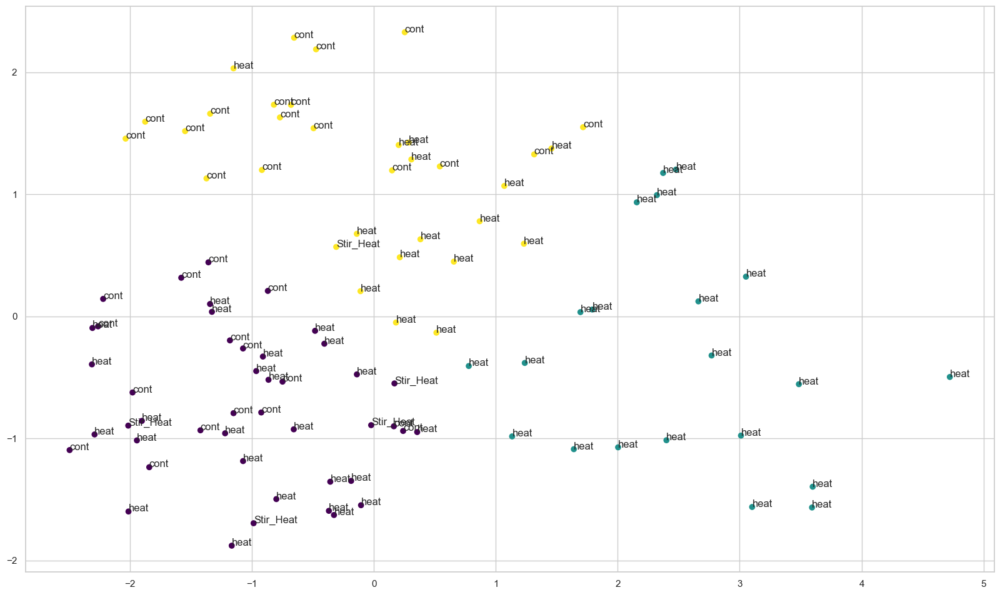

In [126]:
# KMEANS on the complexity vectors
import pandas as pd
def replicate(times, data):
    result2 = []
    for i in range(times):
        for item in data:
            result2.append(item)
    return result2

keylist = replicate(len(all_w), list(filtered_traj.keys()))

df = pd.DataFrame({'Trials': keylist })


writer = pd.ExcelWriter('Neurokit_results_V_Overlap_Many_Window_Sizes.xlsx', engine='xlsxwriter')
df['Condition'] = ''
df['window size'] = ''
c = 0
trials_id = list(filtered_traj.keys())
start_ind = c
end_ind = c+len(trials_id)
for i in range(len(all_w)):
    print(all_w[i])
    print(start_ind)
    print(end_ind)
    df.loc[start_ind:end_ind,'window size'] = all_w[i]   
    start_ind = end_ind
    end_ind = start_ind+ int(len(trials_id)) 
print(df)
    
for k in complexities['heat']['47'][2].keys():
    df[k] = ''
      
for b in bins: 
    for key in traj_binned[b].keys():
        for w in all_w:
            temp = complexities[b][key][w]
            for i in range(len(df['Trials'])):
                trialnum =  int(df.loc[i,'Trials'])
                if (trialnum == int(key)) and (w == df.loc[i,'window size']):
                    for key2 in temp.keys():
                        df.loc[i,str(key2)]=temp[key2]
                        df.loc[i,'Condition'] = b

df.to_excel("Neurokit_results_V_Overlap_Many_Window_Sizes.xlsx")  

df_mat_temp = df.to_numpy()
df_mat = df_mat_temp[:,3:]


trial_labels = df_mat_temp[:,1]  #condition

# for i in range(len(df_mat_temp[:,2])):
#     trial_labels[i] = str(df_mat_temp[i,2]) + ' ' + (df_mat_temp[i,1])  #window size

#Along each column, subtract mean and divide by standard deviation 
# for i in range(len(df_mat[1,:])): 
#     df_mat[:,i] = (df_mat[:,i] - np.mean(df_mat[:,i]))/np.std(df_mat[:,i])

    
plt.figure(figsize=(20, 12))
kmeans_temp = KMeans(n_clusters=3).fit(df_mat)
kmeans_predict_temp = kmeans_temp.predict(df_mat)
kmeans = kmeans_predict_temp
pca = PCA(n_components=10)
X_Pca = pca.fit_transform(df_mat)
plt.scatter(X_Pca[:, 0], X_Pca[:, 1], c=kmeans,  cmap='viridis')
for i, txt in enumerate(trial_labels):
    plt.annotate(txt, (X_Pca[i,0], X_Pca[i,1]))
    
    


In [119]:
print(len(keylist)/96)
print(len(all_w))
print(all_w)
print(raw_traj.keys())

1.03125
1
[1]
dict_keys(['289', '262', '114', '128', '129', '115', '263', '288', '261', '249', '103', '116', '248', '258', '264', '106', '107', '265', '267', '38', '139', '111', '105', '110', '138', '39', '272', '201', '215', '229', '76', '188', '62', '89', '177', '163', '162', '88', '176', '63', '77', '189', '228', '214', '200', '216', '49', '61', '75', '174', '148', '149', '175', '74', '60', '48', '203', '217', '207', '64', '70', '58', '159', '171', '170', '59', '71', '65', '206', '210', '73', '67', '199', '172', '173', '66', '198', '72', '211', '239', '220', '208', '195', '181', '57', '43', '142', '80', '81', '143', '56', '180', '194', '209', '221', '237', '223', '182', '196', '68', '40', '54', '141', '83', '169', '168', '82', '154', '140', '55', '41', '197', '69', '183', '222', '232', '226', '45', '51', '187', '79', '193', '178', '86', '92', '144', '150', '151', '145', '179', '87', '192', '78', '50', '44', '227', '233', '219', '225', '231', '52', '190', '184', '85', '153', '147', '

### Paper 5 cumulative sum methods (get a graph over time for each trajectory??) :

In [123]:
# The things that can be looked at (St)

def absv(traj_full, w):
    traj = traj_full
    L = len(traj[:,0]) - w - 5
    #[timestamp, absdisp]
    abs_v = np.zeros((L,2))
    for i in range(L):
        x1 = traj[i,0]
        y1 = traj[i,1]
        x2 = traj[i+w, 0]
        y2 = traj[i+w, 1]
        dx = x2 - x1
        dy = y2 - y1
        abs_v[i,:] = [traj[i+w,2], np.sqrt(dx**2 + dy**2)/(0.5*w)]
    return abs_v

def abs_turning_angle(traj_full, w):
    traj = traj_full
    L = len(traj[:,0]) - w - 5
    #[timestamp, absdisp]
    abs_turning_angle = np.zeros((L,2))
    c = 0
    for i in range(L):
        x1 = traj[i,0]
        y1 = traj[i,1]
        x2 = traj[i+w, 0]
        y2 = traj[i+w, 1]
        dx = x2 - x1
        dy = y2 - y1 
        if dy == 0:
            continue
        abs_turning_angle[c,:] = [traj[i+w,2], np.abs(np.arctan(dx/dy))]
        c += 1
    
    return abs_turning_angle[~(abs_turning_angle==0).all(1)]



def norm_angle_speed(traj, w):
    abs_v = absv(traj,w)
    abs_theta = abs_turning_angle(traj,w)
    L = len(abs_theta)
    norm_anglespeed = np.zeros((L-2,2))
    c = 0
    for i in range(2,L):
        ind_array = np.where(abs_v[:,0] == abs_theta[i,0])
        ind = ind_array[0][0]
        mu_theta = np.mean(abs_theta[:i,1])
        sigma_theta = np.std(abs_theta[:i,1])
        mu_v = np.mean(abs_v[:ind,1])
        sigma_v = np.std(abs_v[:ind,1])
        St = (abs_theta[i,1]-mu_theta)/(sigma_theta) + (sigma_v)/(abs_v[ind,1]-mu_v)
        if sigma_theta == 0 or abs_v[ind,1]-mu_v == 0:
            continue
        norm_anglespeed[c,:] = [abs_v[ind,0], St]
        c += 1
    return norm_anglespeed[~(norm_anglespeed==0).all(1)]

#Partial sums function

def partial_sum(St):
    L = len(St)-1
    C_tau = np.zeros((L,2))
    C_tau[:,0] = St[1:,0]
    C1 = np.sum(St[1:, 1])/(L-1)
    St[:,1] -= C1
    for i in range(1,L):
        C_tau[i-1,1] = np.sum(St[:i+1,1])
    return C_tau
    



    

FileNotFoundError: [Errno 2] No such file or directory: '/Users/ilikecookiee/Documents/Prakashlab/Thermo_Trajectories/Paper_Repository_Clean/partialsum_turningangle/Ctau; trial 249heat.png'

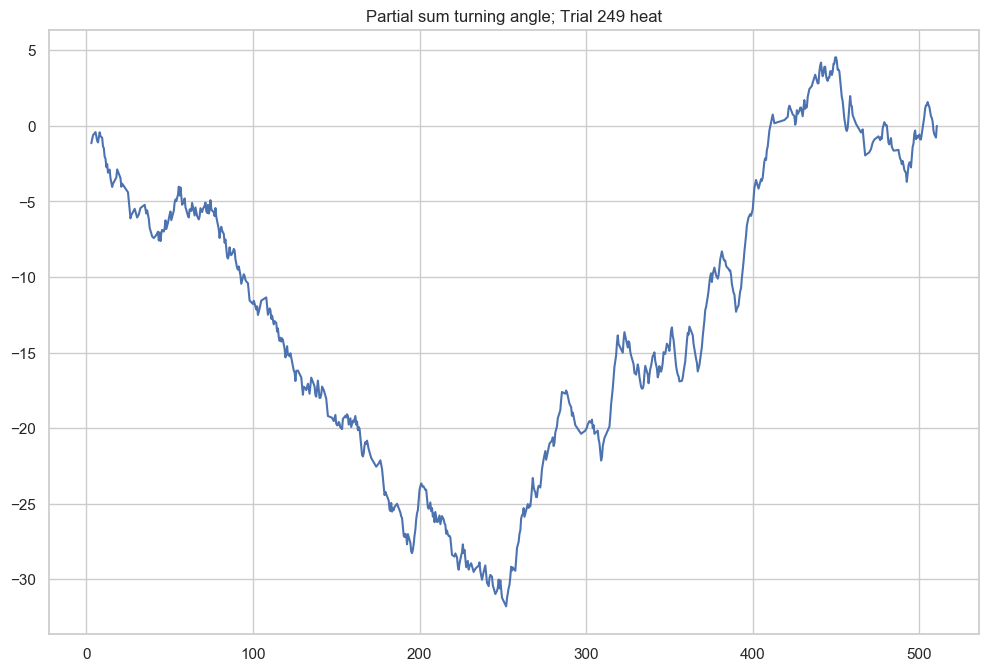

In [124]:
for b in bins: 
    for key in traj_binned[b].keys():
        S = abs_turning_angle(traj_binned[b][key],1)
        ctau = partial_sum(S)
        fig1 = plt.figure()
        plt.plot(ctau[:,0], ctau[:,1])
        plt.title('Partial sum turning angle; Trial ' + key + ' ' + b)
        
        title = 'Ctau; trial ' + key + b
        plt.savefig(cwd+'/partialsum_turningangle/' + title + '.png')
        


### Sweep over different window sizes -- each dictionary subentry is for one window size, and each sub-subentry will contain all fragments for that trajectoy. Fragments will be overlapping (i.e. [0:window size], [1:window size + 1]....)

### First, just do k means on trajectory fragment (location data only). 

In [128]:
all_w = [i for i in range(2,102,2)]

fragments_raw = {}
for b in bins:
    fragments_raw[b] = {}  
    
for b in bins:    
    for w in all_w: 
        fragments_raw[b][w] = {}
        for key in traj_binned[b].keys():
            L = len(traj_binned[b][key][:,1])-w+1
            fragments_raw[b][w][key] = np.zeros((L,w,2))
            temp = traj_binned[b][key]
            for i in range(L):
                fragments_raw[b][w][key][i, :,:] = temp[i:i+w, 0:2]  - temp[i, 0:2]  #make all fragments start at 0,0

In [ ]:
print(traj_binned['cont']['64'])

print(fragments_raw['cont'][4]['64'])

print(fragments_raw['cont'][4]['64'].shape)

In [ ]:
kmeans_raw = {}
for b in bins:
    kmeans_raw[b] = {}
    for w in all_w:
        kmeans_raw[b][w] ={}
        for key in traj_binned[b].keys():
            d1, d2, d3 = fragments_raw[b][w][key].shape
            X_raw = fragments_raw[b][w][key].reshape(d1,d2*d3)
            kmeans_temp_raw = KMeans(n_clusters=2, random_state=0).fit(X_raw)
            kmeans_predict_temp_raw = kmeans_temp_raw.predict(X_raw)
            kmeans_raw[b][w][key] = kmeans_predict_temp_raw




In [ ]:
for b in bins:
    for w in [20]:
        for key in traj_binned[b].keys():
                plt.figure()
                pca = PCA(n_components=2)
                d1, d2, d3 = fragments_raw[b][w][key].shape
                X_raw = fragments_raw[b][w][key].reshape(d1,d2*d3)
                X_Pca_raw = pca.fit_transform(X_raw)
                plt.scatter(X_Pca_raw[:, 0], X_Pca_raw[:, 1], c=kmeans_raw[b][w][key],  cmap='viridis')
                title = b+'; w=' + str(w) + '; trial '+ key
                plt.title(title)
                plt.savefig(title + '.png')
# centers = kmeans_temp.cluster_centers_
# plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);


In [ ]:
#Plot the actual trajectory

for b in bins:
    for w in [8]:
        for key in traj_binned[b].keys():
                plt.figure()
                d1, d2, d3 = fragments_raw[b][w][key].shape
                end = len(traj_binned[b][key][:,1])
                plt.scatter(traj_binned[b][key][:end-w+1,0], traj_binned[b][key][:end-w+1, 1], c=kmeans_raw[b][w][key],  cmap='viridis')
                title = b+'; w=' + str(w) + '; trial '+ key
                plt.title(title)
                plt.savefig(title + '.png')
# centers = kmeans_temp.cluster_centers_
# plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

#### Do k-means on fragments defined by displacement and angle instead of position. 

In [ ]:
all_w = [i for i in range(4,102,4)]

fragments = {}
for b in bins:
    fragments[b] = {}  
    
for b in bins:    
    for w in all_w: 
        fragments[b][w] = {}
        for key in traj_binned[b].keys():
            L = len(traj_binned[b][key][:,1])-w+1
            fragments[b][w][key] = np.zeros((L,w-1,2))
            temp = traj_binned[b][key]
            for i in range(L):
                for j in range(w-1):
                    x1 = temp[i+j,0]
                    x2 = temp[i+j+1,0]
                    y1 = temp[i+j,1]
                    y2 = temp[i+j+1,1]
                    dy = y2-y1
                    dx = x2-x1
                    if  dy == 0:
                        dy = 1e-5
                    fragments[b][w][key][i,j,0] = np.sqrt((dx)**2 + (dy)**2)
                    fragments[b][w][key][i,j,1] = abs(np.arctan((dx)/(dy)))
                    
                

In [ ]:
print(traj_binned['cont']['64'])

print(fragments['cont'][4]['64'])

print(fragments['cont'][4]['64'].shape)

In [ ]:
kmeans = {}
for b in bins:
    kmeans[b] = {}
    for w in all_w:
        kmeans[b][w] ={}
        for key in traj_binned[b].keys():
            d1, d2, d3 = fragments[b][w][key].shape
            X = fragments[b][w][key].reshape(d1,d2*d3)
            kmeans_temp = KMeans(n_clusters=2, random_state=0).fit(X)
            kmeans_predict_temp = kmeans_temp.predict(X)
            kmeans[b][w][key] = kmeans_predict_temp


In [ ]:
for b in bins:
    for w in [12]:
        for key in traj_binned[b].keys():
                plt.figure()
                pca = PCA(n_components=3)
                d1, d2, d3 = fragments[b][w][key].shape
                X = fragments[b][w][key].reshape(d1,d2*d3)
                X_Pca = pca.fit_transform(X)
                plt.scatter(X_Pca[:, 0], X_Pca[:, 1], c=kmeans[b][w][key],  cmap='viridis')
                title = b+'; w=' + str(w) + '; trial '+ key
                plt.title(title)
                plt.savefig(title + '.png')
# centers = kmeans_temp.cluster_centers_
# plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

#### Should show the different clusters on the actual trajectories

In [ ]:
for b in bins:
    for w in [12]:
        for key in traj_binned[b].keys():
                plt.figure()
                pca = PCA(n_components=3)
                d1, d2, d3 = fragments[b][w][key].shape
                X = fragments[b][w][key].reshape(d1,d2*d3)
                X_Pca = pca.fit_transform(X)
                end = len(traj_binned[b][key][:,1])
                plt.scatter(traj_binned[b][key][:end-w+1,0], traj_binned[b][key][:end-w+1, 1], c=kmeans[b][w][key],  cmap='viridis')
                title = b+'; w=' + str(w) + '; trial '+ key
                plt.title(title)
                plt.savefig(title + '.png')
# centers = kmeans_temp.cluster_centers_
# plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

### Other plots that didn't make it into paper

Text(0.5, 12.44444444444443, 'Lyapunov_E_3')

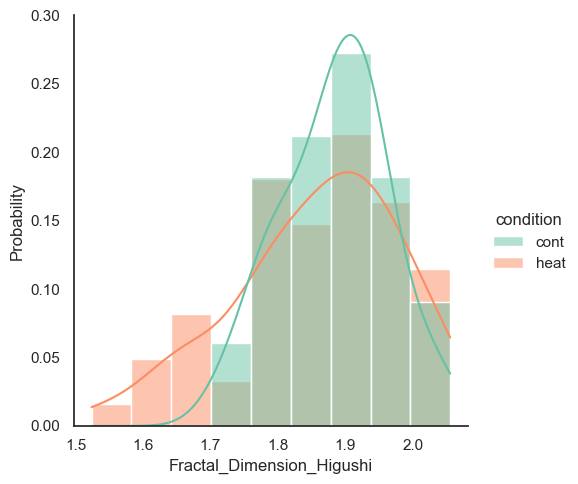

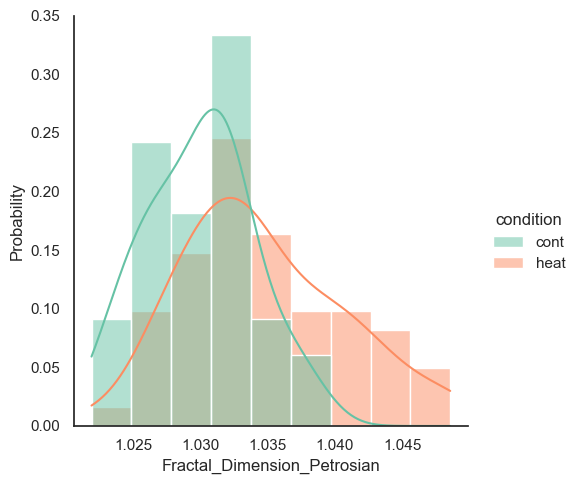

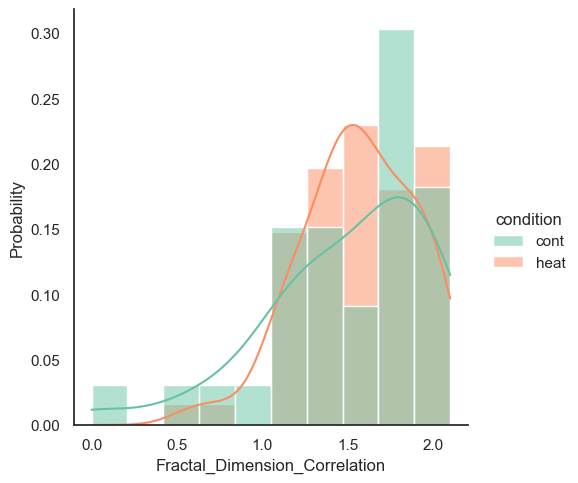

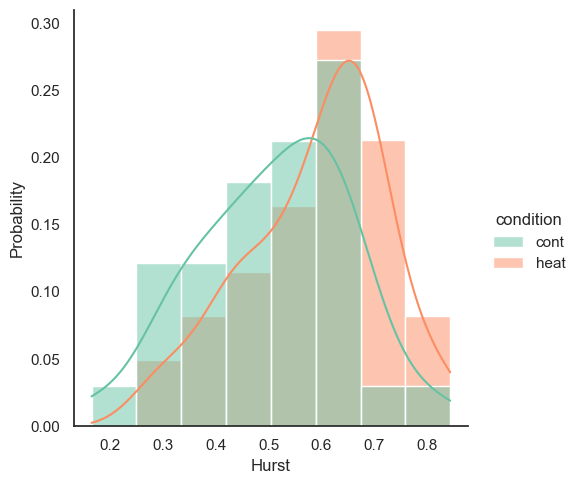

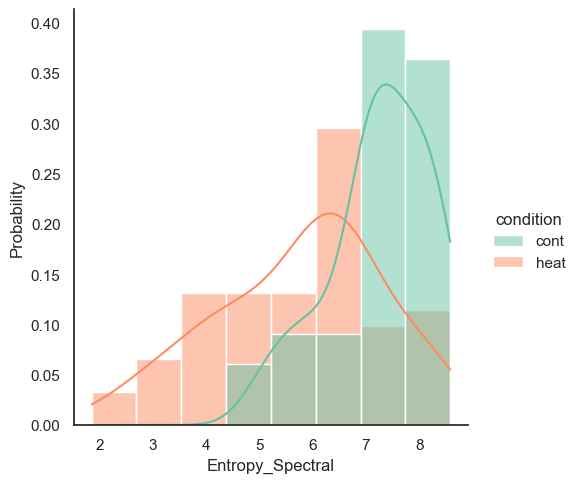

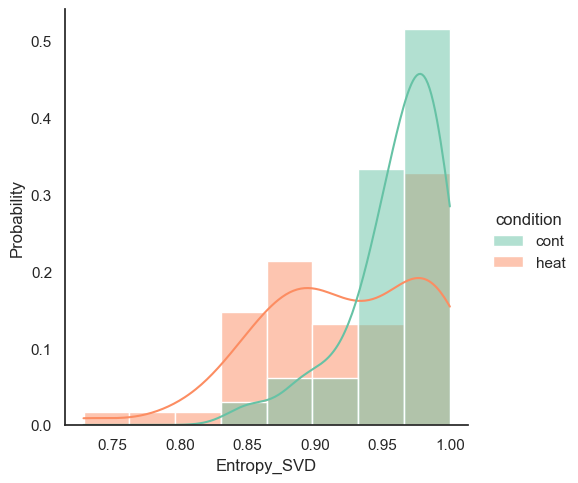

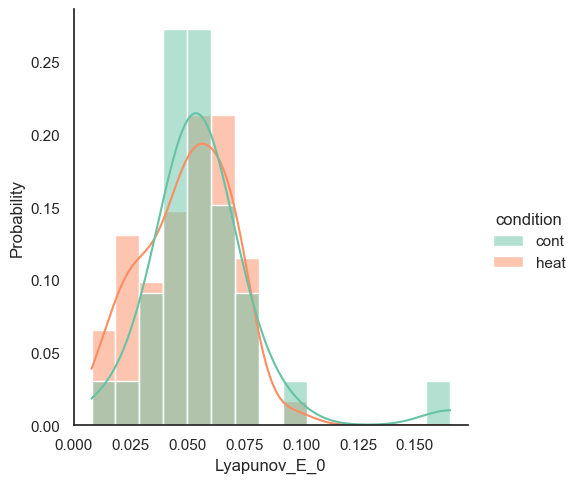

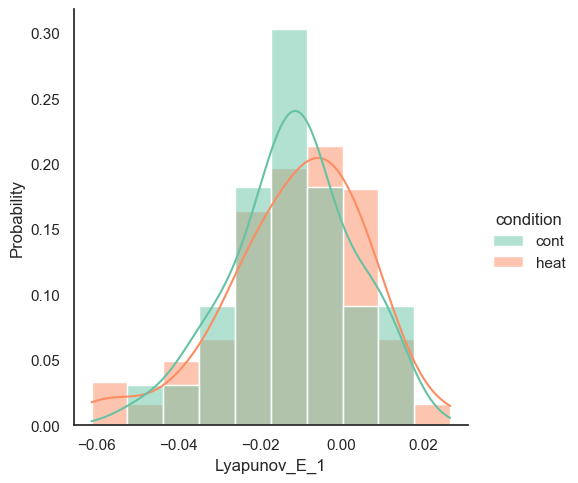

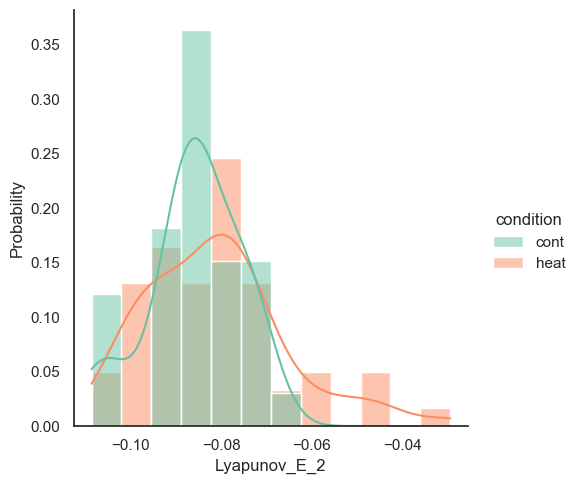

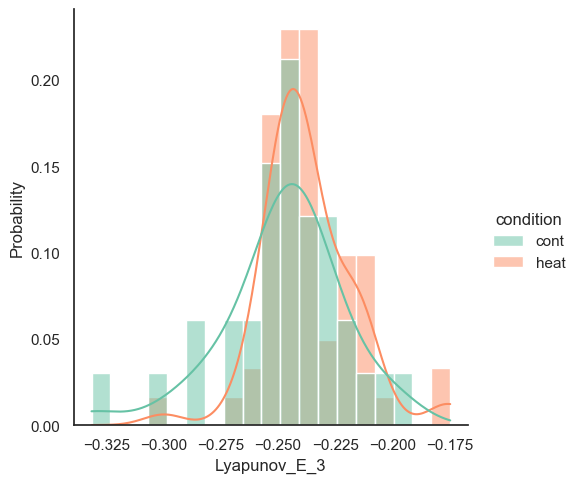

In [11]:


sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Fractal_Dimension_Higushi", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Fractal_Dimension_Higushi')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Fractal_Dimension_Higushi hist.png')

sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Fractal_Dimension_Petrosian", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Fractal_Dimension_Petrosian')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Fractal_Dimension_Petrosian hist.png')

sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Fractal_Dimension_Correlation", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Fractal_Dimension_Correlation')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Fractal_Dimension_Correlation hist.png')



sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Hurst", hue="condition",kde = True, stat = 'probability', common_norm=False)
plt.xlabel('Hurst')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Hurst hist.png')



sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Entropy_Spectral", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Entropy_Spectral')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Entropy_Spectral hist.png')

sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Entropy_SVD", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Entropy_SVD')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Entropy_SVD hist.png')





sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lyapunov_E_0", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Lyapunov_E_0')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Lyapunov_E_0 hist.png')


sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lyapunov_E_1", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Lyapunov_E_1')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Lyapunov_E_1 hist.png')


sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lyapunov_E_2", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Lyapunov_E_2')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Lyapunov_E_2 hist.png')

sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lyapunov_E_3", kde = True, hue="condition",stat = 'probability', common_norm=False)
plt.xlabel('Lyapunov_E_3')
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/Lyapunov_E_3 hist.png')

In [ ]:
rmsd_y = rmsd_y.sort_values(by = ['condition'], ascending = False) 


plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="tau", kde = True, hue="condition",log_scale=True ,stat = 'probability', common_norm=False)
plt.xlabel ('tau for $RMSD_{parallel} (min)$', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks (fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY _ tau hist _whole traj.png', bbox_inches="tight")


plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="v", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('v for $RMSD_{parallel}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY_ v hist_whole traj.png')

plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x="tau", kde = True, hue="condition",log_scale=True ,stat = 'probability', common_norm=False)
plt.xlabel ('tau for $RMSD_{parallel} (min)$', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks (fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY _ tau hist _last200.png', bbox_inches="tight")


plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x="v", kde = True, hue="condition",log_scale=True ,stat = 'probability', common_norm=False)
plt.xlabel ('v for $RMSD_{parallel}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY_ v hist_last200.png')


plt.figure()
sns.displot(data=rmsd_x[rmsd_x['condition'] != 'stir'], x="tau", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('tau for $RMSD_{orthogonal}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/x rmsd tau hist.png')


plt.figure()
sns.displot(data=rmsd_x[rmsd_x['condition'] != 'stir'], x="v", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('v for $RMSD_{orthogonal}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/x rmsd v hist.png')


plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], legend = False, x="Y_MSD",hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('slope of log-log $MSD_{parallel}$',fontsize = 25)
plt.legend(['heat','control'], fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.ylabel('Probability', fontsize = 25)
#plt.savefig(cwd+'/PaperFigs/YMSD hist.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x="X_MSD",hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('$MSD_{orthogonal}$',fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks (fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/XMSD hist.png', bbox_inches="tight")




# RMSD_Y_WHOLE TRAJ
plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] == 'heat'], x="v ballistic",color=palette_3color[0], kde = True, legend = False, log_scale=False,stat = 'probability', common_norm=False)
plt.xlabel('$v_{ballistic}$ for $RMSD_{parallel}$ (mm min$^{-1}$)', fontsize=25)
plt.legend(['heat'], fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.ylabel('Probability', fontsize = 25)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY _ v ballistic.png', bbox_inches="tight")

# RMSD_Y_WHOLE TRAJ
plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="v tau product", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel('v * tau for $RMSD_{parallel}$ (mm)', fontsize=20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY _ v tau product_whole_traj hist.png', bbox_inches="tight")
                                
# RMSD_Y_last200
plt.figure()
sns.displot(data=rmsd_y_last200[rmsd_y_last200['condition'] != 'stir'], x="v tau product", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel('v * tau for $RMSD_{parallel}$ (mm)', fontsize=20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDY _ v tau product_last200.png', bbox_inches="tight")


# RMSD_Y_WHOLE TRAJ
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="v tau product", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel('v * tau for $RMSD_{WholeTrajectory}$ (mm)', fontsize=20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDXY _ v tau product_whole_traj hist.png', bbox_inches="tight")
                                
# RMSD_Y_last200
plt.figure()
sns.displot(data=rmsd_xy_last200[rmsd_xy_last200['condition'] != 'stir'], x="v tau product", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel('v * tau for $RMSD_{t = [-105,-5]min}$ (mm)', fontsize=20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
#plt.savefig(cwd+'/PaperFigs/RMSD/RMSDXY _ v tau product_last200.png', bbox_inches="tight")

# The following other neurokit metrics were tried but didn't really seem as relevant


# # plt.figure()
# # plt.yscale('log')
# # sns.scatterplot(data=rmsd_y, x="Y_MSD", y="tau", hue="condition")
# plt.figure()
# #plt.xscale('log')
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Entropy_Shannon", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Entropy_Spectral", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Entropy_SVD", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Fractal_Dimension_Correlation", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Fractal_Dimension_Higushi", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Fractal_Dimension_Petrosian", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Fisher_Information", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="Hurst", y="tau", hue="condition")
# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy, x="DFA", y="tau", hue="condition")



plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="tau", kde = True, hue="condition",log_scale=True ,stat = 'probability', common_norm=False)
plt.xlabel ('tau for $RMSD_{parallel}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/Y RMSD tau hist.png')
plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="v", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('v for $RMSD_{parallel}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/Y RMSD v hist.png')
plt.figure()
sns.displot(data=rmsd_x[rmsd_x['condition'] != 'stir'], x="tau", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('tau for $RMSD_{orthogonal}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/x rmsd tau hist.png')
plt.figure()
sns.displot(data=rmsd_x[rmsd_x['condition'] != 'stir'], x="v", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel ('v for $RMSD_{orthogonal}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/x rmsd v hist.png')
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="tau", hue="condition",log_scale=True,stat = 'probability', common_norm=False)
#plt.savefig(cwd+'/PaperFigs/RMSD/rmsd whole traj tau hist.png')
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="v", hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.title('rmsd v')
#plt.savefig(cwd+'/PaperFigs/RMSD/rmsd whole traj v hist.png')
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="tau scaled by dfe", hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.title('rmsd tau scaled by dfe')
#plt.savefig(cwd+'/PaperFigs/RMSD/rmsd whole traj tau scaled by dfe hist.png')
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Entropy_Spectral", hue="condition",log_scale=True,stat = 'probability', common_norm=False)
#plt.savefig(cwd+'/PaperFigs/Neurokit_Figs/spectral entropy hist.png')
plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Entropy_SVD", hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.figure()
# sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="Y_MSD", hue="condition",stat = 'probability', common_norm=False)
# plt.xlabel ('$MSD_{parallel}$')
# plt.savefig(cwd+'/PaperFigs/YMSD hist.png')
plt.figure()
sns.displot(data=rmsd_y[rmsd_y['condition'] != 'stir'], x="v tau product", kde = True, hue="condition",log_scale=True,stat = 'probability', common_norm=False)
plt.xlabel('v * tau for $RMSD_{parallel}$')
#plt.savefig(cwd+'/PaperFigs/RMSD/v tau product hist.png')

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lp Peak", hue="condition", legend = False, stat = 'probability', common_norm=False)
plt.xlabel ('Window size at which \n maximum persistence\n length occurs (mm)', fontsize = 25)
plt.legend(['heat','control'], fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.ylabel('Probability', fontsize = 25)
#plt.savefig(cwd+'/PaperFigs/Lp Peak.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Tp Peak", hue="condition", legend = False,stat = 'probability', common_norm=False)
plt.legend(['heat','control'], fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.ylabel('Probability', fontsize = 25)
plt.xlabel ('Window size at which \n maximum persistence time occurs (min)', fontsize = 25)
#plt.savefig(cwd+'/PaperFigs/Tp Peak.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lp", hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('Max Persistence Length')
#plt.savefig(cwd+'/PaperFigs/Lp.png')

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Tp", hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('Max Persistence Time (min)')
#plt.savefig(cwd+'/PaperFigs/Tp.png')

# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lp Peak", y="Tp", hue="condition")




plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Tp Peak", hue="condition", legend = False,stat = 'probability', common_norm=False)
plt.legend(['heat','control'], fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.ylabel('Probability', fontsize = 25)
plt.xlabel ('Window size at which \n maximum persistence time occurs (min)', fontsize = 25)
#plt.savefig(cwd+'/PaperFigs/Tp Peak.png', bbox_inches="tight")

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lp", hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('Max Persistence Length')
#plt.savefig(cwd+'/PaperFigs/Lp.png')

plt.figure()
sns.displot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Tp", hue="condition",stat = 'probability', common_norm=False)
plt.xlabel ('Max Persistence Time (min)')
#plt.savefig(cwd+'/PaperFigs/Tp.png')

# plt.figure()
# plt.yscale('log')
# sns.scatterplot(data=rmsd_xy[rmsd_xy['condition'] != 'stir'], x="Lp Peak", y="Tp", hue="condition")



